In [1]:
import numpy as np
from numpy import *
from pylab import *
from math import *
import matplotlib.pyplot as plt
import matplotlib.pylab as pylab
import os 
import pandas as pd
import glob
from astropy.io import ascii
import itertools
from datetime import datetime

# Ajuste gaussiano
from scipy.optimize import minimize
import emcee
import corner
from IPython.display import display, Math
from scipy.optimize import curve_fit

path = os.getcwd()

### Sustracción del espectro de los gases

Una vez se obtiene el espectro sintetizado mediante Starlight se procede a obtener el espectro del gas.

El espectro sintetizado por el código de Starlight se corresponde con la parte estelar, por lo que al eliminarla obtenemos los gases.

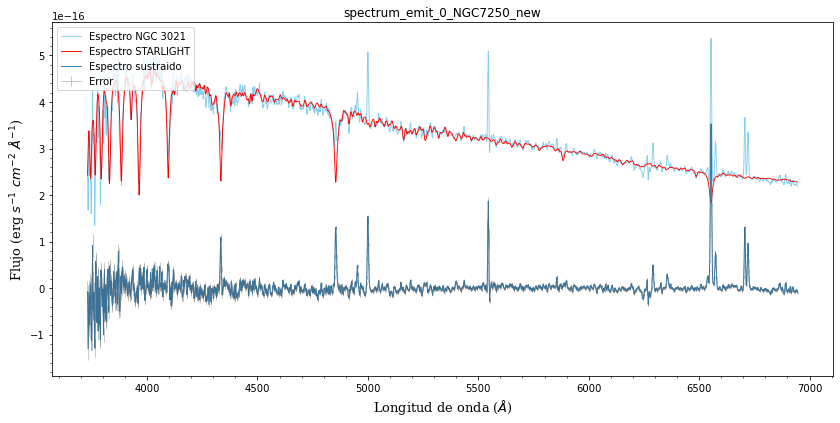

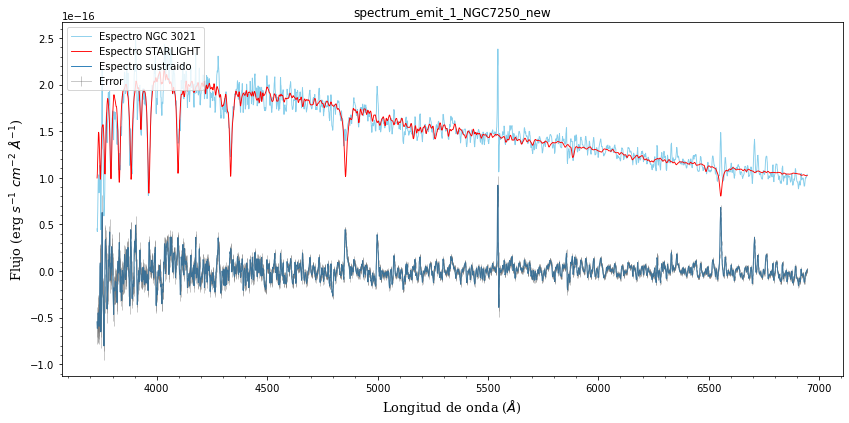

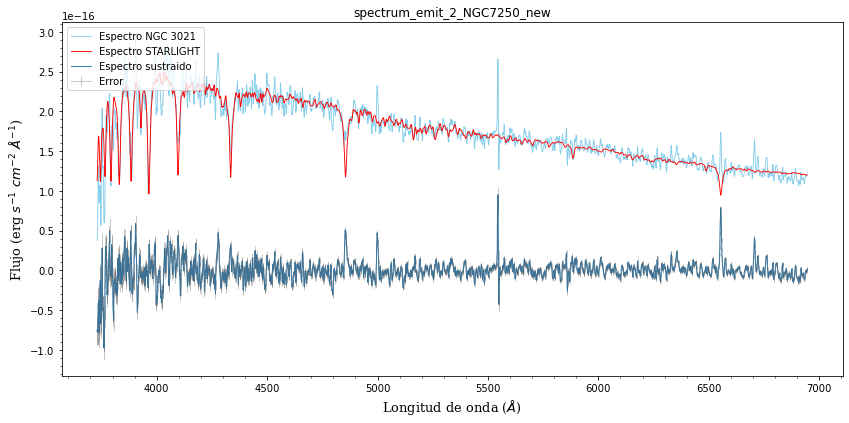

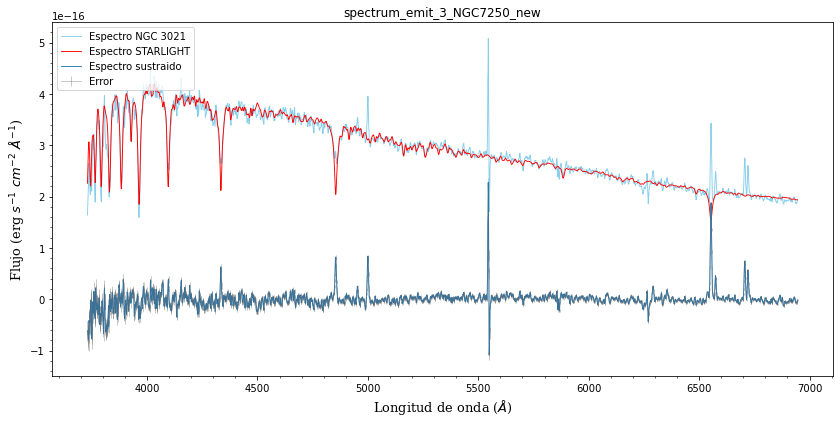

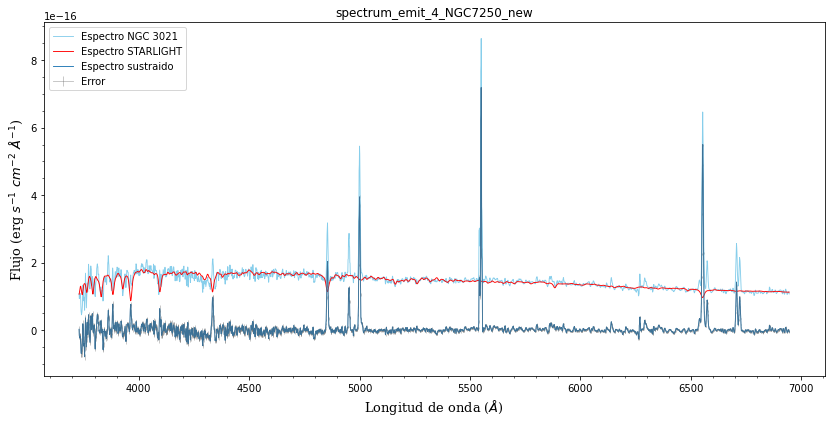

...

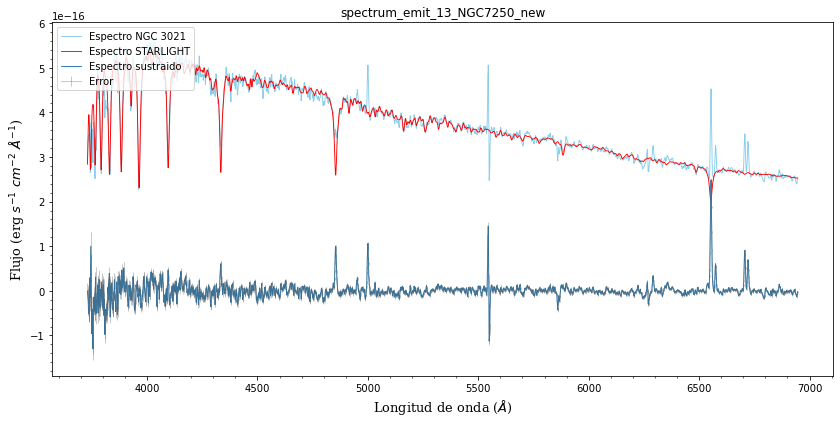

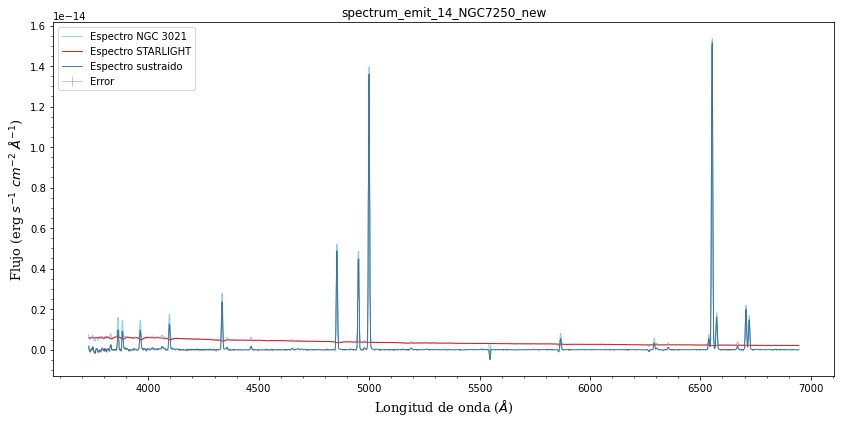

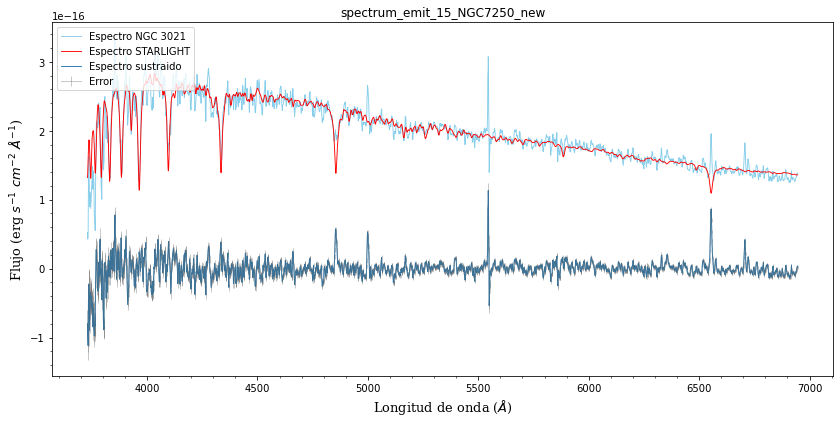

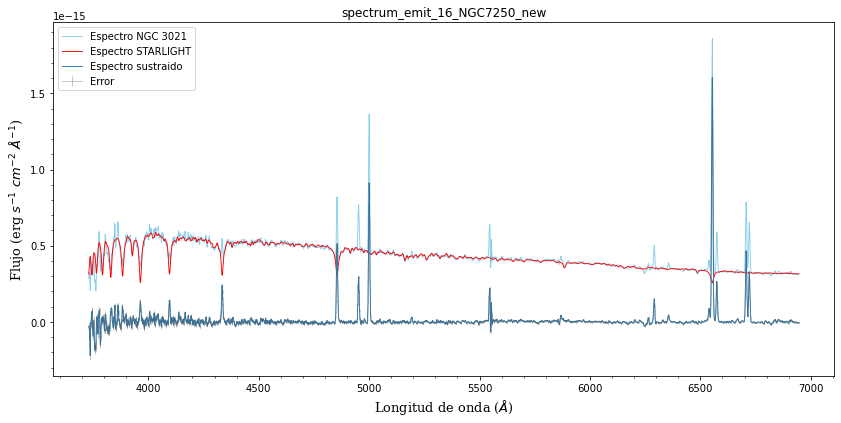

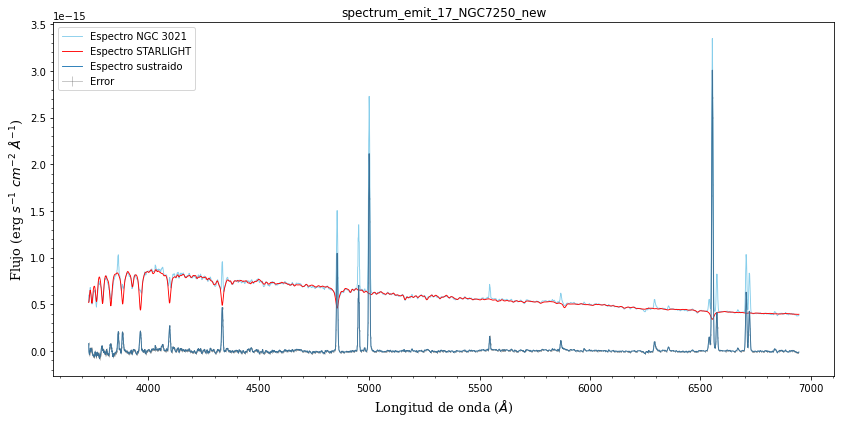

In [2]:
os.chdir(path+'\emited_spectrum')    
os.getcwd()

l_obs_todos = []
f_obs_todos = []
f_syn_todos = []
e_emit_todos = []

lenn = len(glob.glob1(path+'\emited_spectrum',"*.BN"))
#for i in list(itertools.chain(range(lenn-10,lenn-9))):
for i in range(len(glob.glob1(path+'/emited_spectrum',"*.BN"))):
    file = 'spectrum_emit_'+str(i)+'_NGC7250_new'
    l_obs = []
    f_obs = []
    f_syn = []
    with open(file+'.BN', 'r') as SL:
        f_obs_norm = float((np.array((SL.readlines()[25]).split()))[0,])
    with open(file+'.BN', 'r') as SL:
        data = SL.readlines()[1078:4334]   
        for linea in data:
            linea = np.array(linea.split())
            if float(linea[1]) != 0:
                l_obs.append(float(linea[0,]))
                f_obs.append(float(linea[1,]))
                f_syn.append(float(linea[2,]))
        l_obs = np.array(l_obs)
        f_obs = np.array(f_obs)*f_obs_norm
        f_syn = np.array(f_syn)*f_obs_norm
    
    e_emit = []
    with open(file+'.txt','r') as datos:
        data = datos.readlines()
        for linea in data:
            linea = np.array(linea.split())
            if float(linea[0]) >= l_obs[0] and float(linea[0]) <= l_obs[-1]:
                e_emit.append(float(linea[2,]))
        e_emit = np.array(e_emit)        
        
    
    fig, ax = plt.subplots(figsize=(14,6.5))
    ax.plot(l_obs,f_obs,color='skyblue', linewidth=0.9,label="Espectro NGC 3021")
    ax.plot(l_obs,f_syn,color='red', linewidth=0.9,label="Espectro STARLIGHT")
    ax.errorbar(l_obs,f_obs-f_syn,yerr=e_emit,linewidth=0.9, alpha=0.4, label='Error', color='dimgrey')
    ax.plot(l_obs,f_obs-f_syn, linewidth=0.9,label="Espectro sustraido")
    
    xlabel(r'Longitud de onda ($\AA$)', fontsize=13,fontfamily='serif'); ylabel(r'Flujo (erg $s^{-1}$ $cm^{-2}$ $\AA^{-1}$)', fontsize=13,fontfamily='serif') 
    plt.legend(loc='upper left')
    title('%s' %(file));plt.legend(loc='upper left')
    plt.minorticks_on()
    #axvline(4861, color='k', ls="dotted",lw='0.9')
    #text(4881, 8.3*10**(-16), r'[H$_{\beta}$] 4861',alpha=0.8,rotation='vertical',fontsize='11') 
    #axvline(5007, color='k', ls="dotted",lw='0.9')
    #text(5027, 8.3*10**(-16), r'[O III] 5007',alpha=0.8,rotation='vertical',fontsize='11') 
    #axvline(6563, color='k', ls="dotted",lw='0.9')
    #text(6485, 9.9*10**(-16), r'[H$_{\alpha}$] 6563',alpha=0.8,rotation='vertical',fontsize='11') 
    #axvline(6583, color='k', ls="dotted",lw='0.9')
    #text(6603, 9.9*10**(-16), r'[N II] 6583',alpha=0.8,rotation='vertical',fontsize='11') 
    #axvline(6716, color='k', ls="dotted",lw='0.9')
    #text(6646, 6.5*10**(-16), r'[S II] 6716',alpha=0.8,rotation='vertical',fontsize='11') 
    #axvline(6731, color='k', ls="dotted",lw='0.9')
    #text(6751, 6.5*10**(-16), r'[S II] 6731',alpha=0.8,rotation='vertical',fontsize='11')  
    #plt.savefig('espectro_final.png')
    plt.show() 
    
    l_obs_todos.append(l_obs)
    f_obs_todos.append(f_obs)
    f_syn_todos.append(f_syn)
    e_emit_todos.append(e_emit)
    
l_obs_todos = np.array(l_obs_todos)
f_obs_todos = np.array(f_obs_todos)
f_syn_todos = np.array(f_syn_todos)
e_emit_todos = np.array(e_emit_todos)

### Ajuste gaussiano en las líneas de Hbeta, OIII, Halfa y NII

Se emplean dos ajustes distintos:
 - Dos ajustes simple para Hb y OIII 
         def gaussian(x, a, x0, sigma):
            return a*np.exp(-(x-x0)**2/(2*sigma**2))
            
 - Un ajuste triple para Halfa y NII 
         def gaussian_2(x, a1 ,a2,a3, x0, sigma):
           return a1*np.exp(-(x-x0)**2/(2*sigma**2))+a2*np.exp(-(x-(x0+d1))**2/(2*sigma**2))+a3*np.exp(-(x-(x0-d2))**2/(2*sigma**2))
        
   
Como las líneas de Halfa y NII están muy cerca hay que hacer un ajuste de tres gaussianas a la vez. 


AJUSTANDO ESPECTRO 0

Ajuste en 4861 nm:

Parámetros reales:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


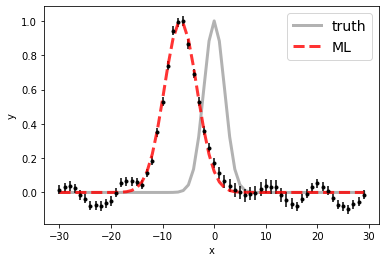

100%|██████████| 15000/15000 [00:14<00:00, 1027.09it/s]


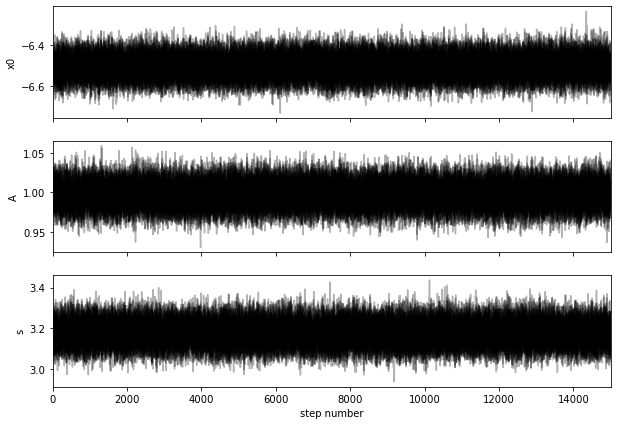

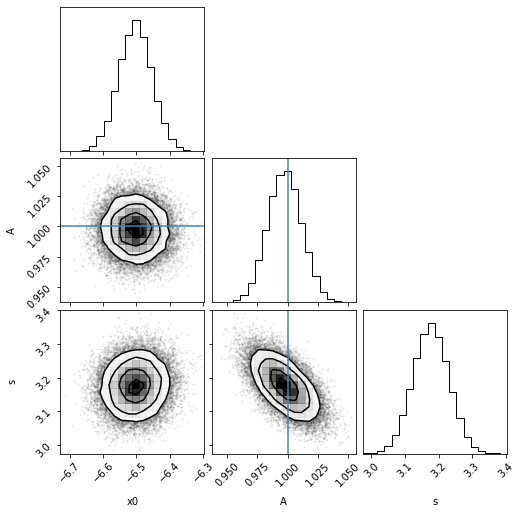

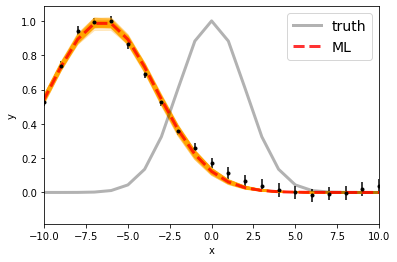

Maximum likelihood estimates:
x0 = -6.504
A = 0.998
s = 3.176


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  4854.496346053439 [0.04975438 0.04931168]
A  =  1.3031970454607146e-16 [1.82889529e-18 1.83100677e-18]
s  =  3.176976606425429 [0.05309826 0.05289876]

-------------------------------------------------------------------------------------------

Ajuste en 5007 nm:

Parámetros reales:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


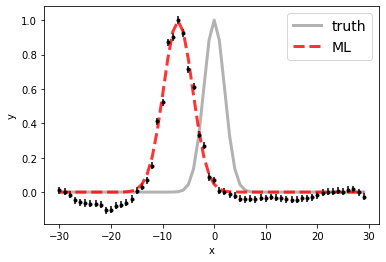

100%|██████████| 15000/15000 [00:15<00:00, 972.41it/s] 


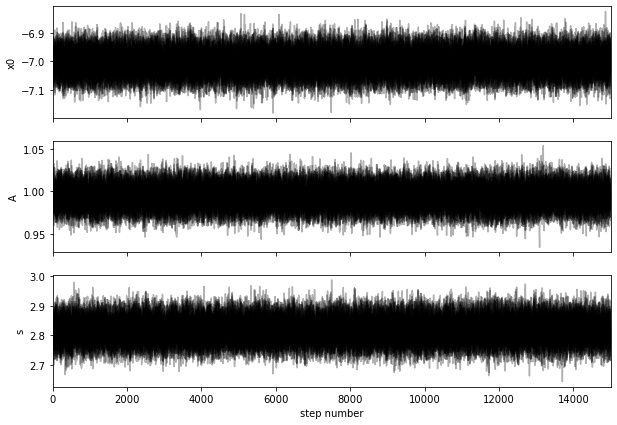

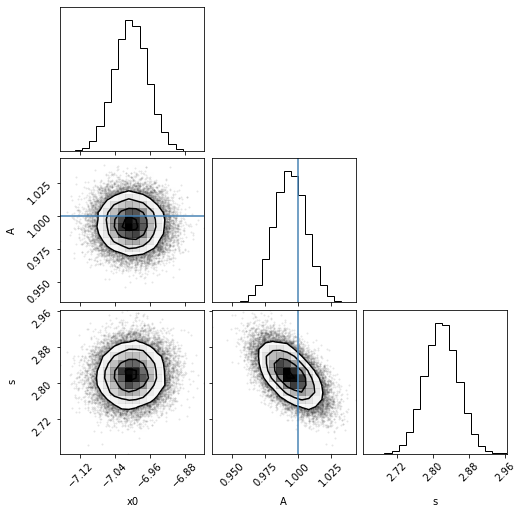

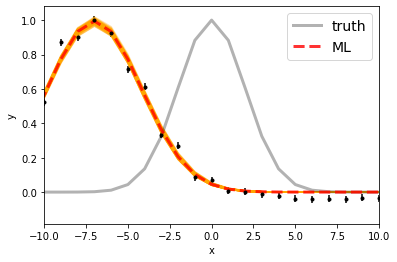

Maximum likelihood estimates:
x0 = -7.004
A = 0.994
s = 2.818


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  4999.996740724111 [0.03895244 0.03825655]
A  =  1.5306852610821523e-16 [1.85150445e-18 1.84892382e-18]
s  =  2.8182334491018444 [0.03697698 0.03697131]

-------------------------------------------------------------------------------------------

Ajuste en 6563 nm:

Parámetros reales:
1.0 1.0 1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


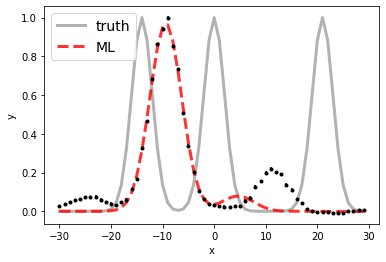

100%|██████████| 15000/15000 [00:23<00:00, 651.32it/s]


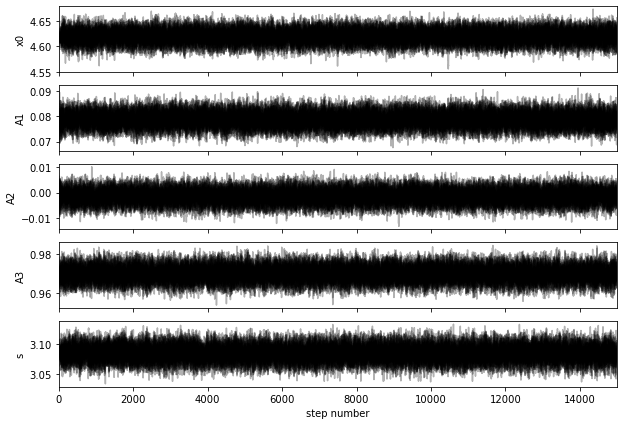

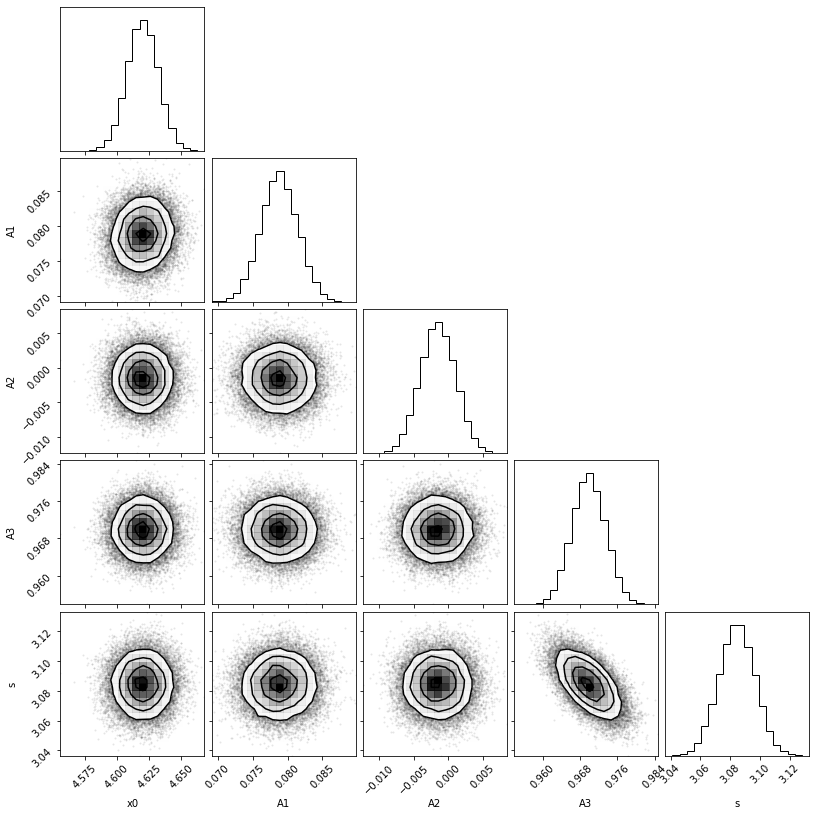

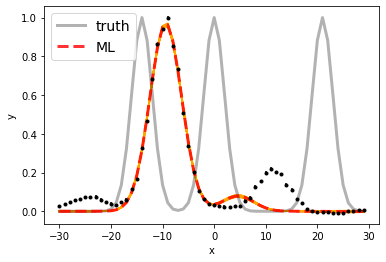

Maximum likelihood estimates:
x0 = 4.620
A1 = 0.079
A2 = -0.002
A3 = 0.970
s = 3.085


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x01, x02 =  6567.619755337004 6588.619755337004 [0.01188736 0.01200245]
A1, A2   =  2.779881721860129e-17 -5.421533420997239e-19 [9.33159598e-19 9.58663328e-19] [8.97175244e-19 8.99042286e-19]
s  =  3.0845914129160352 [0.01209813 0.01200782]

-------------------------------------------------------------------------------------------

///////////////////////////////////////////////////////////////////////////////////////////


AJUSTANDO ESPECTRO 1

Ajuste en 4861 nm:

Parámetros reales:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


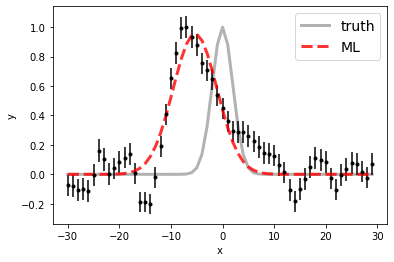

100%|██████████| 15000/15000 [00:14<00:00, 1023.96it/s]


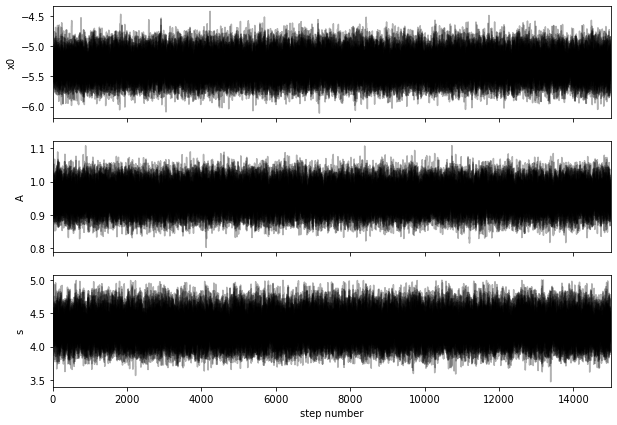

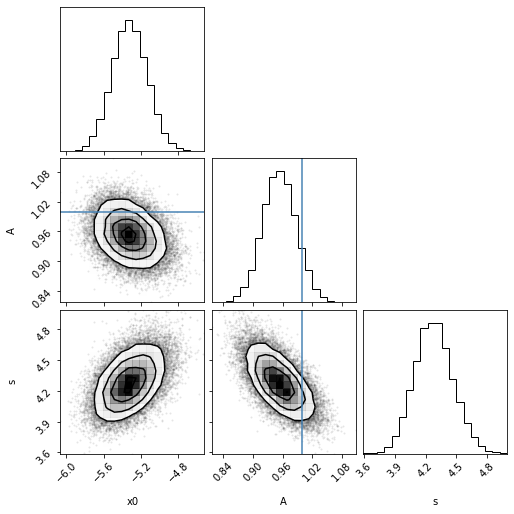

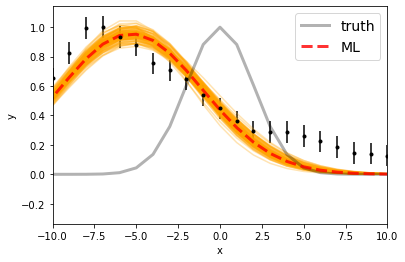

Maximum likelihood estimates:
x0 = -5.329
A = 0.955
s = 4.266


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  4855.675192649602 [0.18353363 0.19316266]
A  =  4.2306665844240315e-17 [1.49737632e-18 1.52196276e-18]
s  =  4.276336622747385 [0.18234038 0.19081929]

-------------------------------------------------------------------------------------------

Ajuste en 5007 nm:

Parámetros reales:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


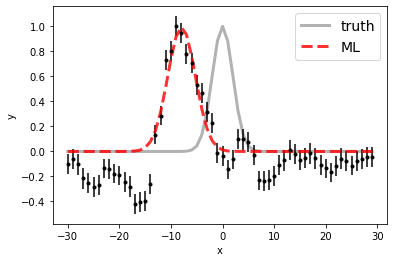

100%|██████████| 15000/15000 [00:14<00:00, 1007.88it/s]


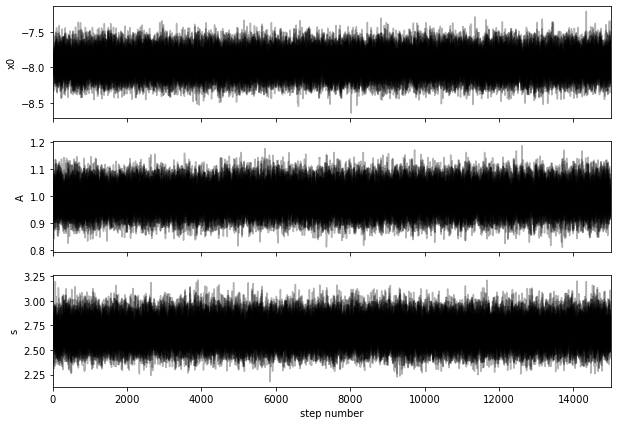

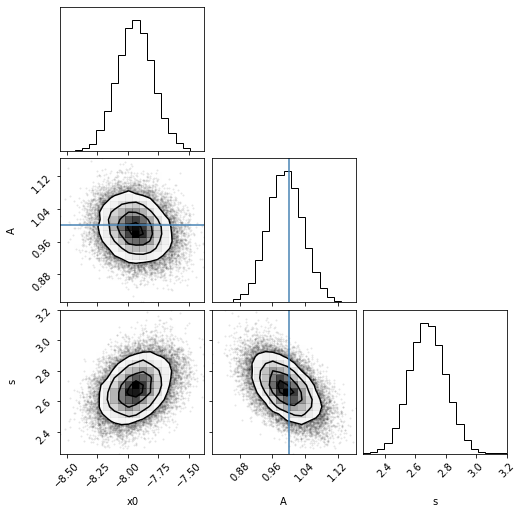

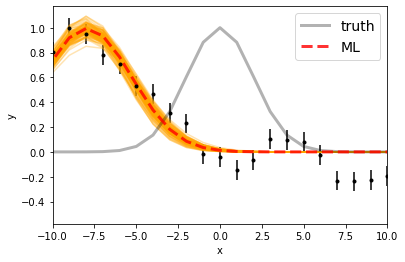

Maximum likelihood estimates:
x0 = -7.941
A = 0.993
s = 2.680


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  4999.060400148223 [0.14726224 0.14696299]
A  =  3.856733108932964e-17 [1.65703128e-18 1.67425044e-18]
s  =  2.6823923046088876 [0.11472964 0.12137522]

-------------------------------------------------------------------------------------------

Ajuste en 6563 nm:

Parámetros reales:
1.0 1.0 1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


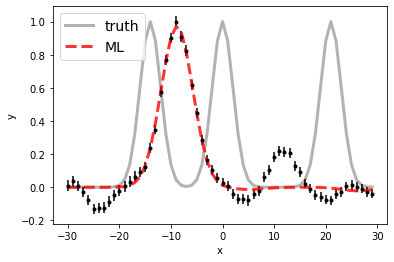

  0%|          | 0/15000 [00:00<?, ?it/s]C:\Users\saruk\anaconda3\lib\site-packages\emcee\moves\red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
100%|██████████| 15000/15000 [00:07<00:00, 1989.33it/s]


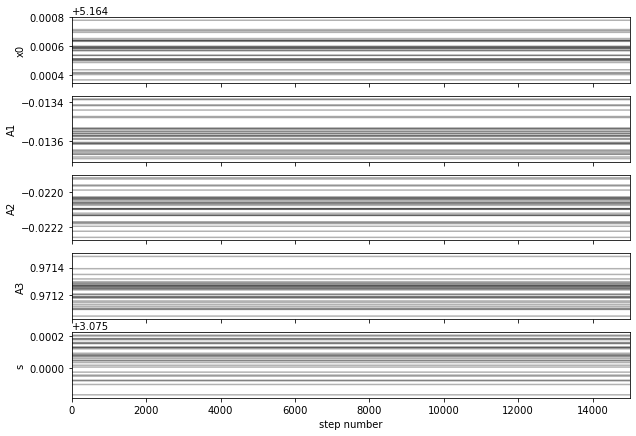

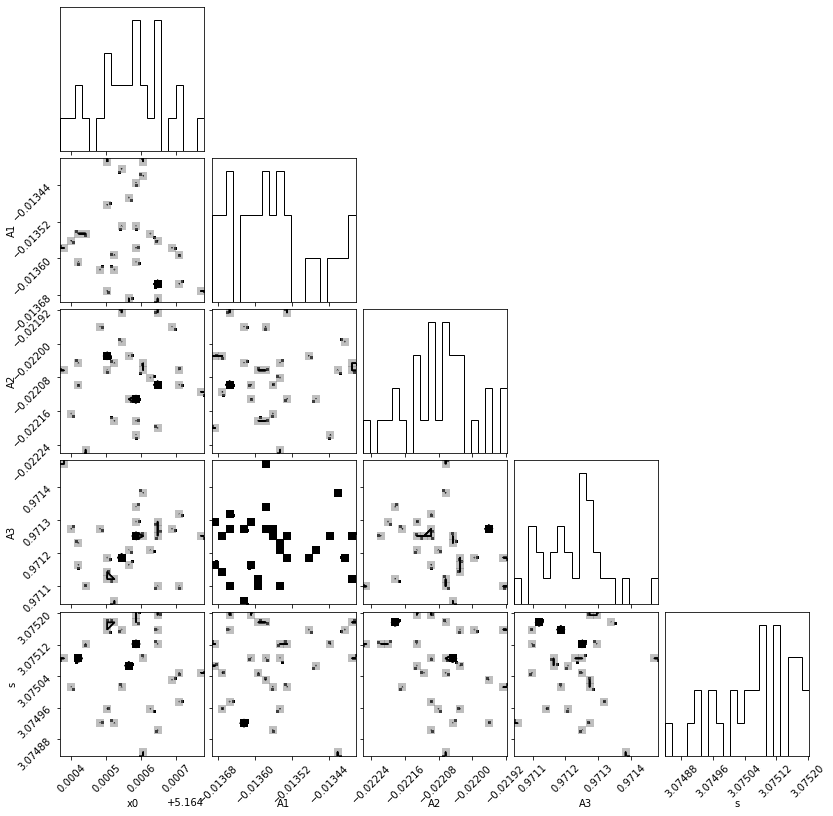

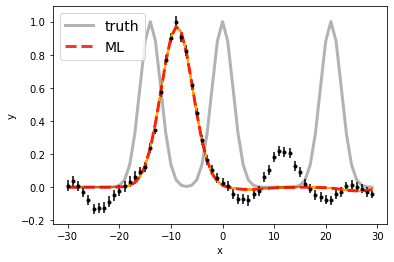

Maximum likelihood estimates:
x0 = 5.165
A1 = -0.014
A2 = -0.022
A3 = 0.971
s = 3.075


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x01, x02 =  6568.164577958331 6589.164577958331 [1.39003491e-04 7.62088857e-05]
A1, A2   =  -9.252849501177192e-19 -1.5045976316752696e-18 [5.99031476e-21 9.11903539e-21] [7.02524295e-21 5.74762269e-21]
s  =  3.0750795079493005 [1.26504794e-04 9.65407082e-05]

-------------------------------------------------------------------------------------------

///////////////////////////////////////////////////////////////////////////////////////////


AJUSTANDO ESPECTRO 2

Ajuste en 4861 nm:

Parámetros reales:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


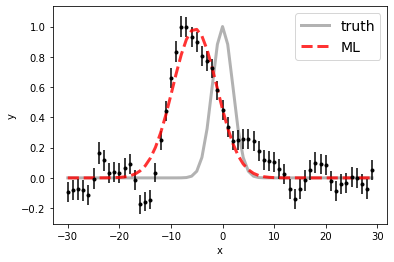

100%|██████████| 15000/15000 [00:14<00:00, 1027.54it/s]


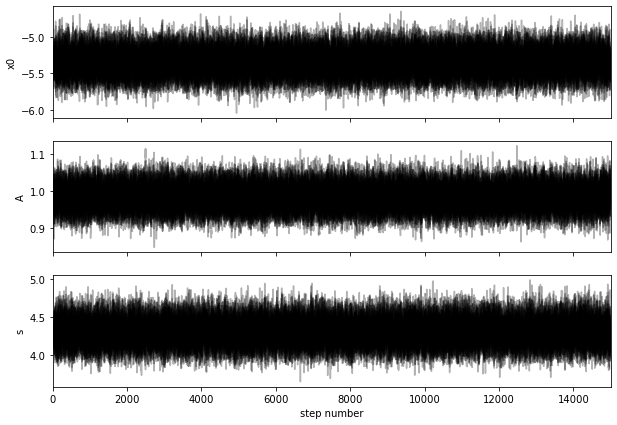

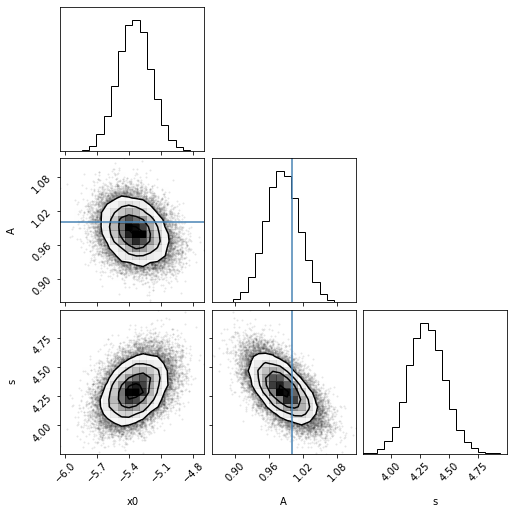

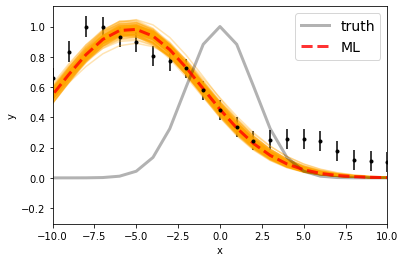

Maximum likelihood estimates:
x0 = -5.356
A = 0.985
s = 4.296


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  4855.650569261897 [0.15534581 0.15613441]
A  =  4.975868916831925e-17 [1.49106212e-18 1.53250213e-18]
s  =  4.304020121604744 [0.14886017 0.15421353]

-------------------------------------------------------------------------------------------

Ajuste en 5007 nm:

Parámetros reales:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


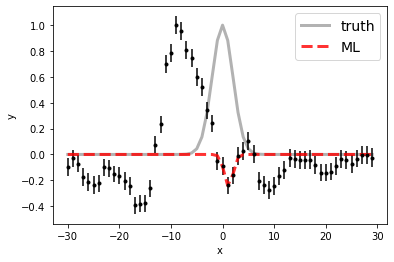

  0%|          | 0/15000 [00:00<?, ?it/s]C:\Users\saruk\anaconda3\lib\site-packages\emcee\moves\red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
100%|██████████| 15000/15000 [00:07<00:00, 2001.08it/s]


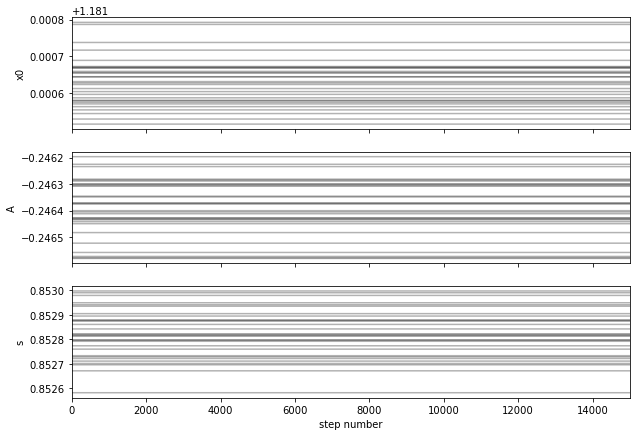

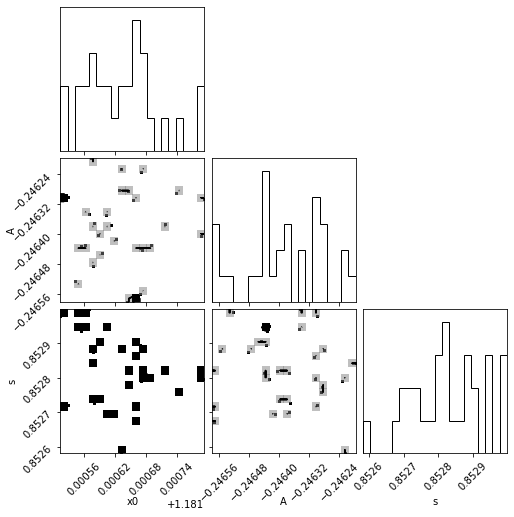

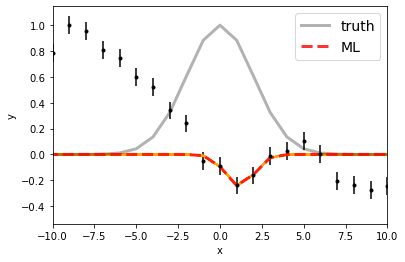

Maximum likelihood estimates:
x0 = 1.182
A = -0.246
s = 0.853


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  5008.181628895888 [6.65926128e-05 5.96478124e-05]
A  =  -1.1641499228933636e-17 [6.39387241e-21 4.85579587e-21]
s  =  0.8528173025446393 [0.00010653 0.00012385]

-------------------------------------------------------------------------------------------

Ajuste en 6563 nm:

Parámetros reales:
1.0 1.0 1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


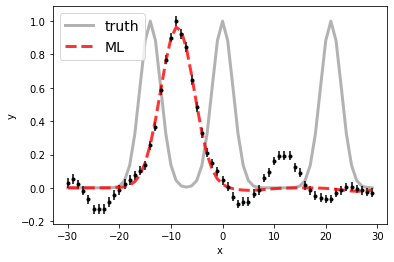

  0%|          | 0/15000 [00:00<?, ?it/s]C:\Users\saruk\anaconda3\lib\site-packages\emcee\moves\red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
100%|██████████| 15000/15000 [00:07<00:00, 1901.81it/s]


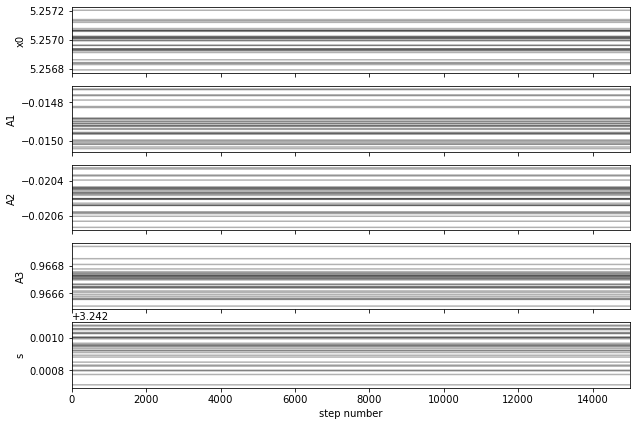

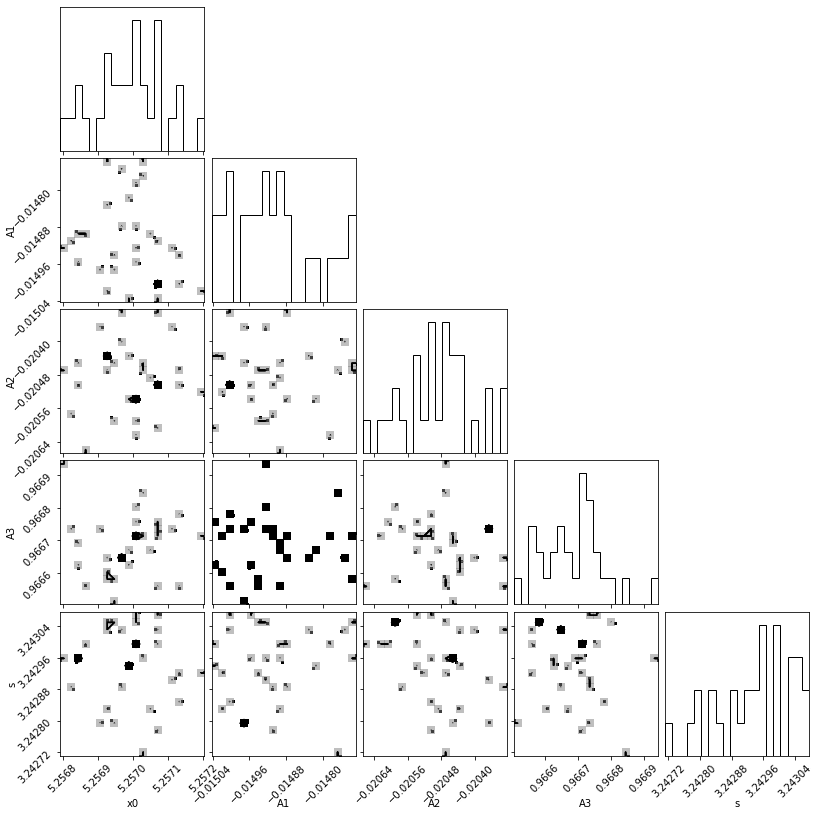

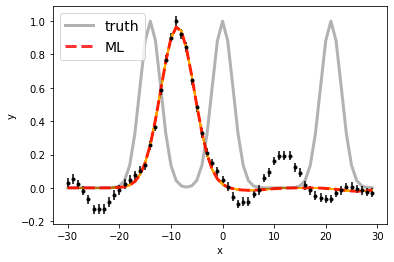

Maximum likelihood estimates:
x0 = 5.257
A1 = -0.015
A2 = -0.020
A3 = 0.967
s = 3.243


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x01, x02 =  6568.257001837669 6589.257001837669 [1.39003491e-04 7.62088857e-05]
A1, A2   =  -1.1769587295608037e-18 -1.615319021921621e-18 [6.93149112e-21 1.05517849e-20] [8.12902345e-21 6.65066817e-21]
s  =  3.2429522751472937 [1.26504794e-04 9.65407082e-05]

-------------------------------------------------------------------------------------------

///////////////////////////////////////////////////////////////////////////////////////////


AJUSTANDO ESPECTRO 3

Ajuste en 4861 nm:

Parámetros reales:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


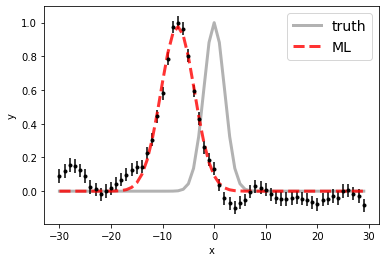

100%|██████████| 15000/15000 [00:14<00:00, 1000.12it/s]


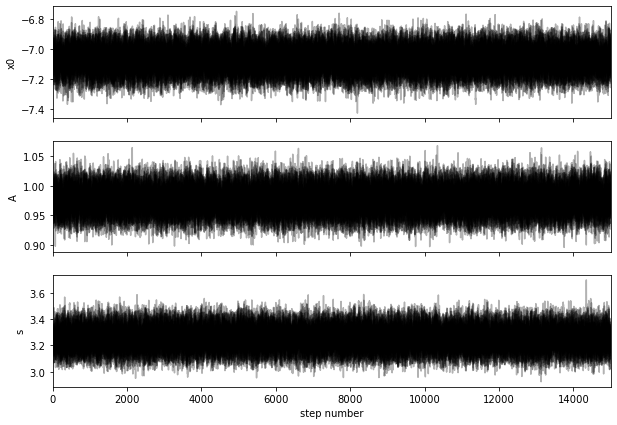

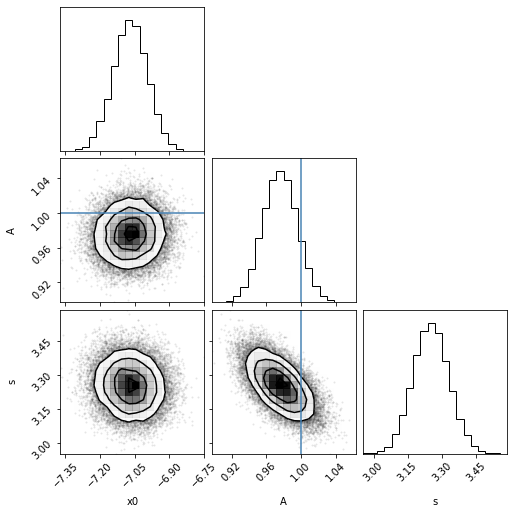

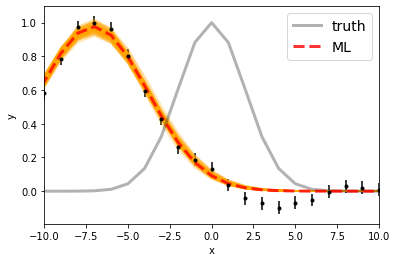

Maximum likelihood estimates:
x0 = -7.069
A = 0.977
s = 3.250


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  4853.930899393064 [0.07427621 0.07382976]
A  =  8.010169346702971e-17 [1.63750317e-18 1.63671033e-18]
s  =  3.2524331551231382 [0.07786034 0.07940137]

-------------------------------------------------------------------------------------------

Ajuste en 5007 nm:

Parámetros reales:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


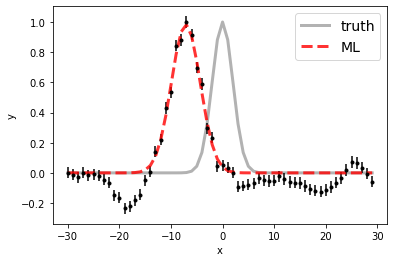

100%|██████████| 15000/15000 [00:14<00:00, 1004.91it/s]


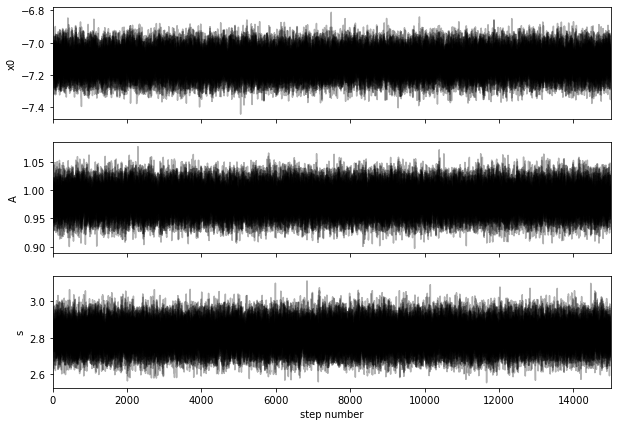

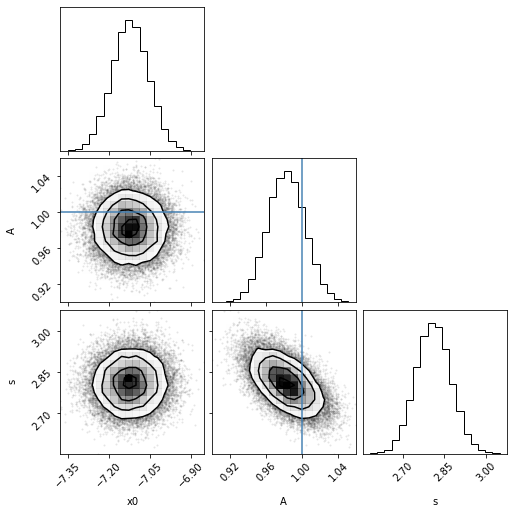

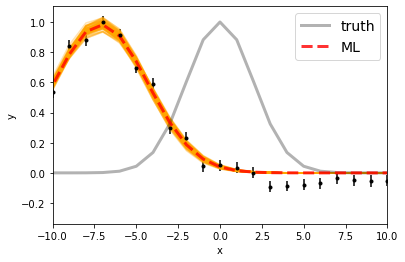

Maximum likelihood estimates:
x0 = -7.123
A = 0.983
s = 2.808


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  4999.877029427606 [0.06595327 0.06746866]
A  =  8.233496950542386e-17 [1.70464464e-18 1.72733016e-18]
s  =  2.8089040081989207 [0.06276923 0.06359737]

-------------------------------------------------------------------------------------------

Ajuste en 6563 nm:

Parámetros reales:
1.0 1.0 1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


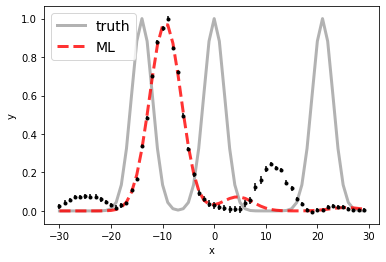

100%|██████████| 15000/15000 [00:22<00:00, 653.59it/s]


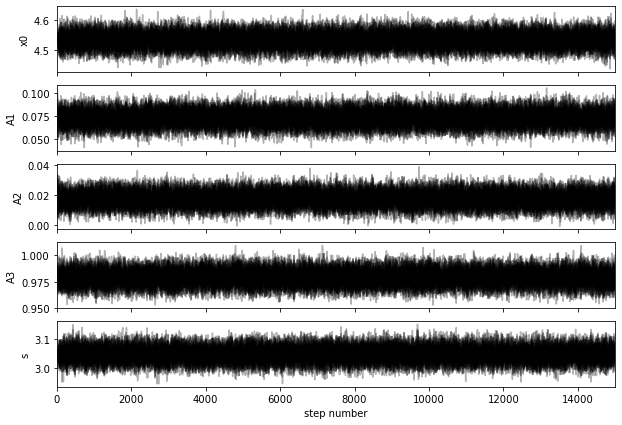

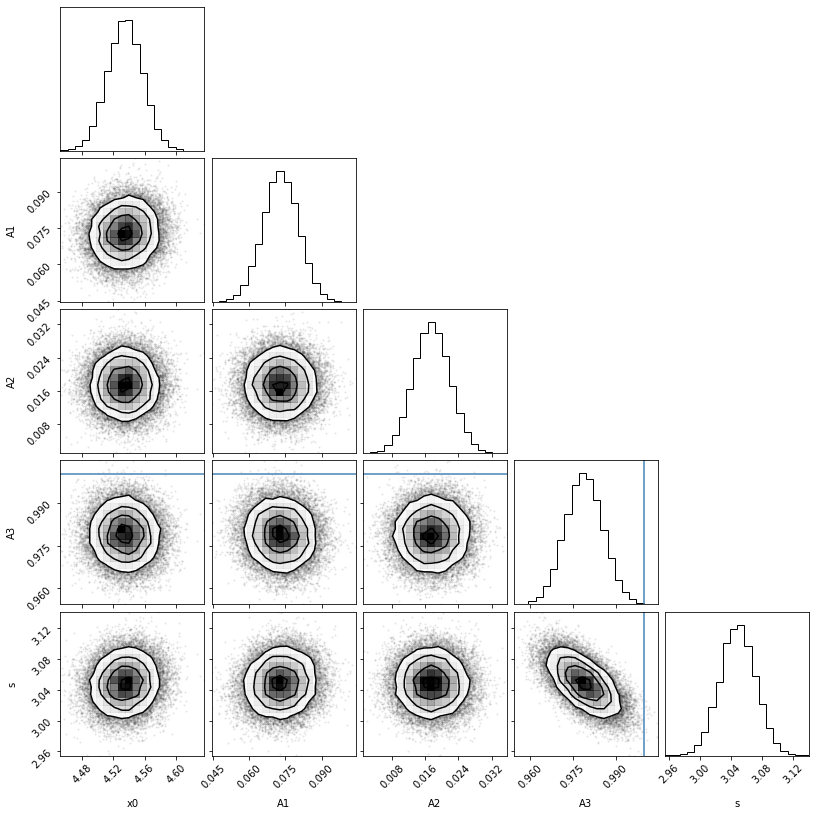

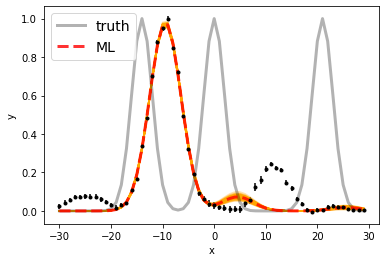

Maximum likelihood estimates:
x0 = 4.534
A1 = 0.073
A2 = 0.018
A3 = 0.979
s = 3.048


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x01, x02 =  6567.534811008683 6588.534811008683 [0.02222977 0.02193578]
A1, A2   =  1.3709286744698163e-17 3.2962726946685894e-18 [1.38340009e-18 1.38760971e-18] [8.22598381e-19 8.29766573e-19]
s  =  3.0483223072378287 [0.02278389 0.02301028]

-------------------------------------------------------------------------------------------

///////////////////////////////////////////////////////////////////////////////////////////


AJUSTANDO ESPECTRO 4

Ajuste en 4861 nm:

Parámetros reales:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


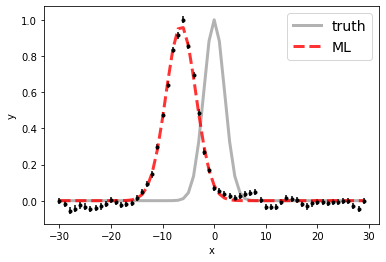

100%|██████████| 15000/15000 [00:14<00:00, 1012.56it/s]


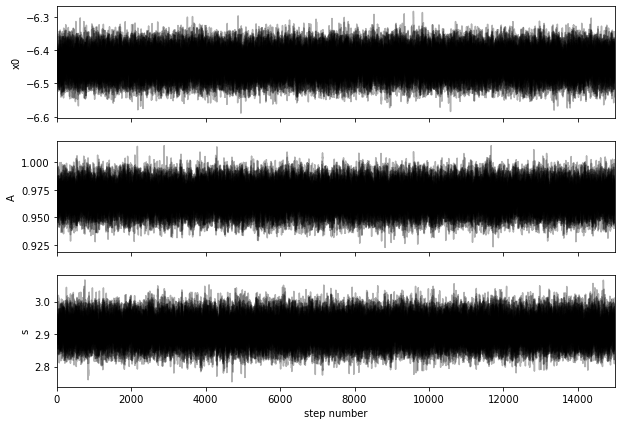

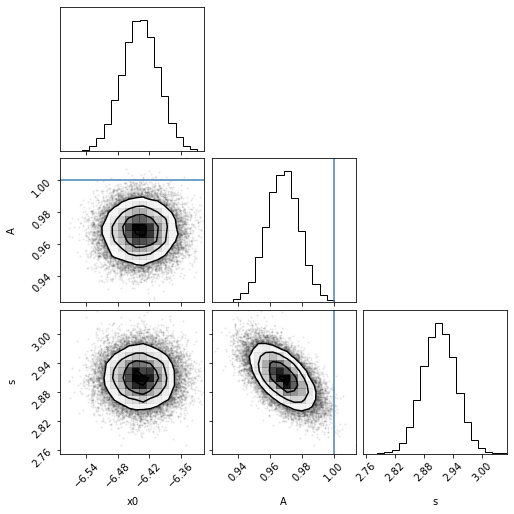

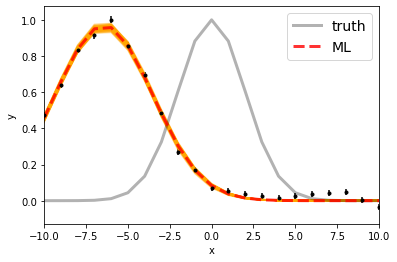

Maximum likelihood estimates:
x0 = -6.438
A = 0.968
s = 2.911


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  4854.56303466186 [0.0350428  0.03447172]
A  =  1.9724113767767326e-16 [2.10637734e-18 2.08383378e-18]
s  =  2.9113933123651368 [0.03379081 0.0342385 ]

-------------------------------------------------------------------------------------------

Ajuste en 5007 nm:

Parámetros reales:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


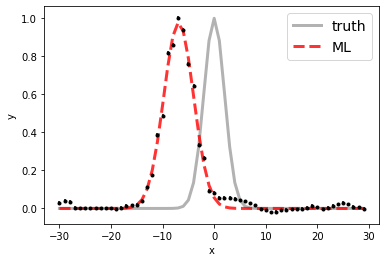

100%|██████████| 15000/15000 [00:15<00:00, 988.46it/s] 


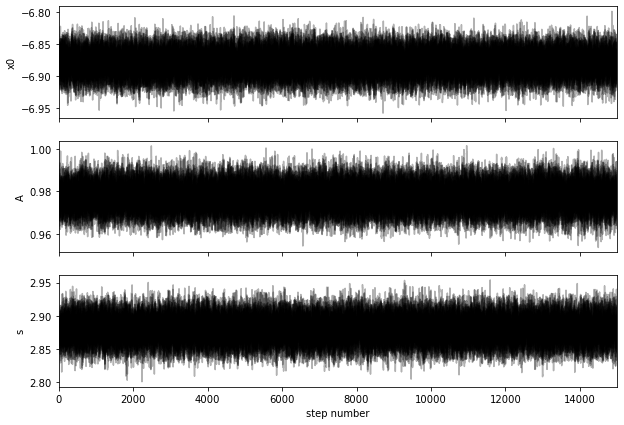

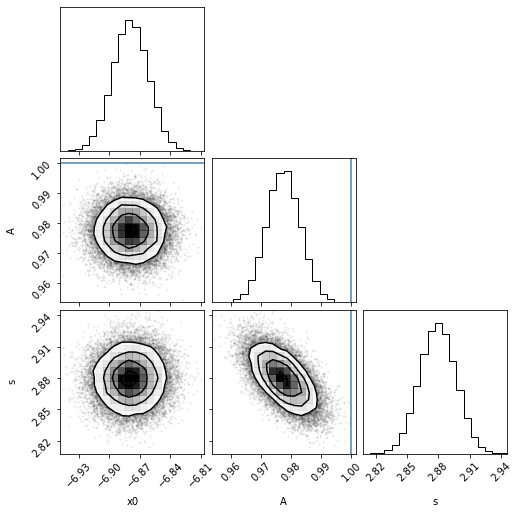

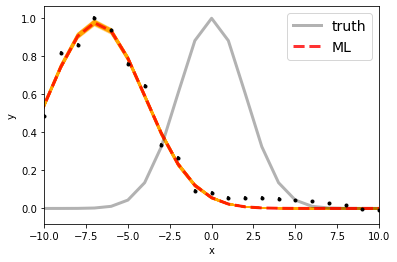

Maximum likelihood estimates:
x0 = -6.879
A = 0.977
s = 2.880


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  5000.120682985356 [0.01750862 0.01768035]
A  =  3.8591292287518896e-16 [2.19789036e-18 2.21037243e-18]
s  =  2.8796287074657405 [0.01747052 0.01714195]

-------------------------------------------------------------------------------------------

Ajuste en 6563 nm:

Parámetros reales:
1.0 1.0 1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


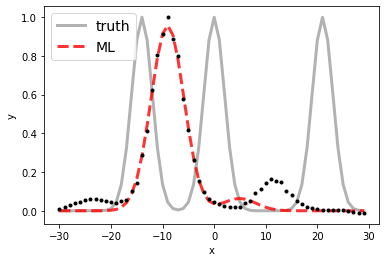

100%|██████████| 15000/15000 [00:22<00:00, 655.64it/s]


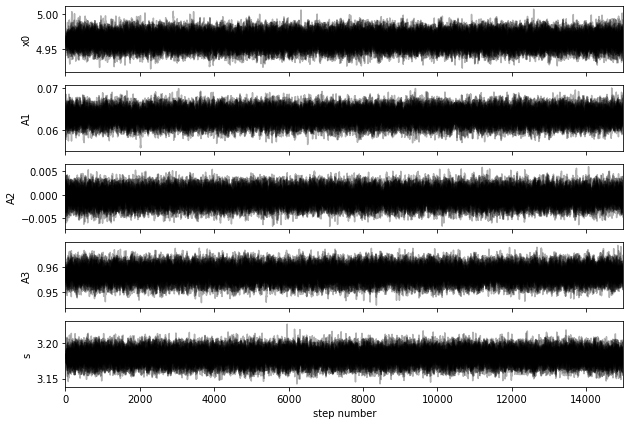

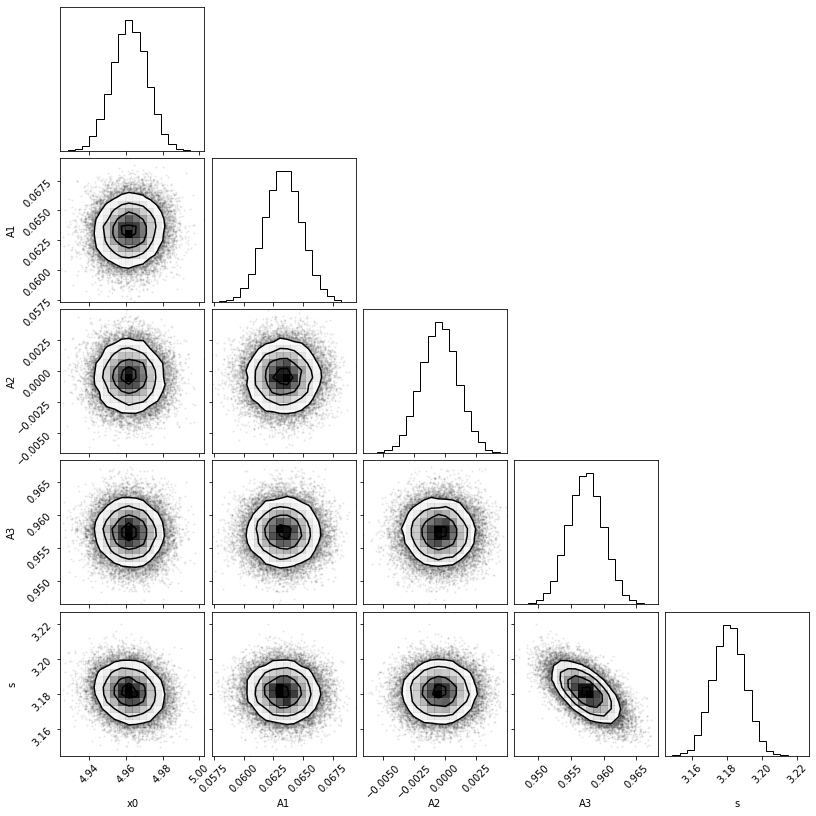

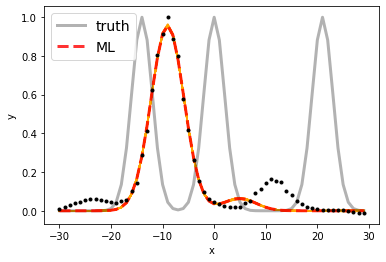

Maximum likelihood estimates:
x0 = 4.962
A1 = 0.063
A2 = -0.000
A3 = 0.957
s = 3.181


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x01, x02 =  6567.961974547445 6588.961974547445 [0.00933746 0.00941484]
A1, A2   =  3.482072515382174e-17 -2.54267545138642e-19 [8.47677260e-19 8.42595039e-19] [8.13444084e-19 8.02101419e-19]
s  =  3.1811691336267485 [0.00900264 0.00892988]

-------------------------------------------------------------------------------------------

///////////////////////////////////////////////////////////////////////////////////////////


AJUSTANDO ESPECTRO 5

Ajuste en 4861 nm:

Parámetros reales:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


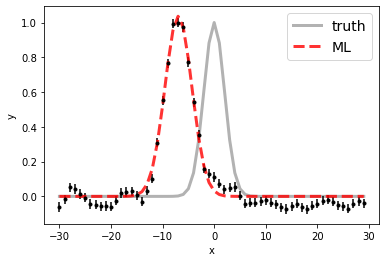

100%|██████████| 15000/15000 [00:14<00:00, 1044.01it/s]


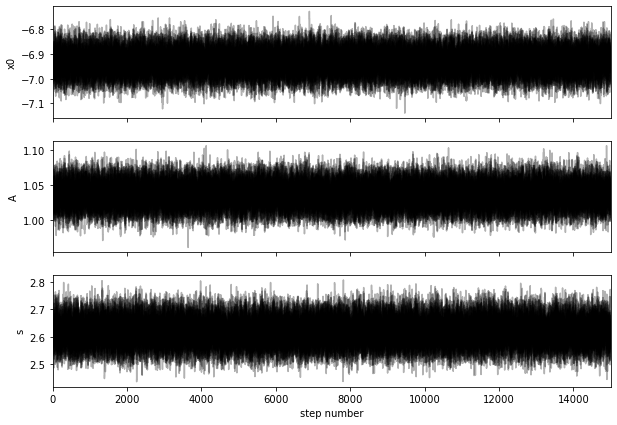

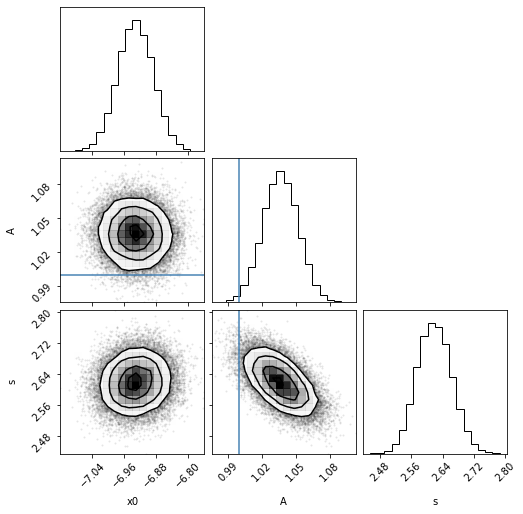

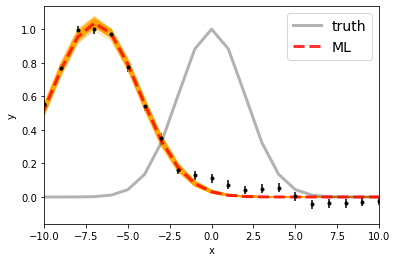

Maximum likelihood estimates:
x0 = -6.931
A = 1.036
s = 2.618


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  4854.06793643952 [0.04398435 0.04503797]
A  =  1.2841418371896916e-16 [1.93860819e-18 1.94257876e-18]
s  =  2.618111316077096 [0.04357528 0.04495696]

-------------------------------------------------------------------------------------------

Ajuste en 5007 nm:

Parámetros reales:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


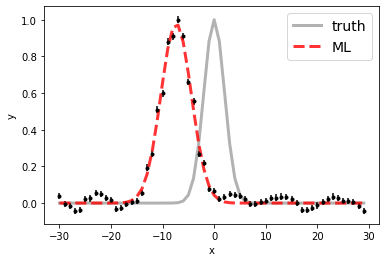

100%|██████████| 15000/15000 [00:14<00:00, 1057.70it/s]


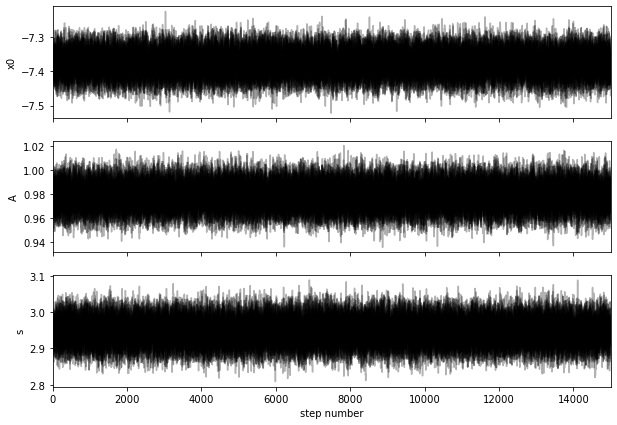

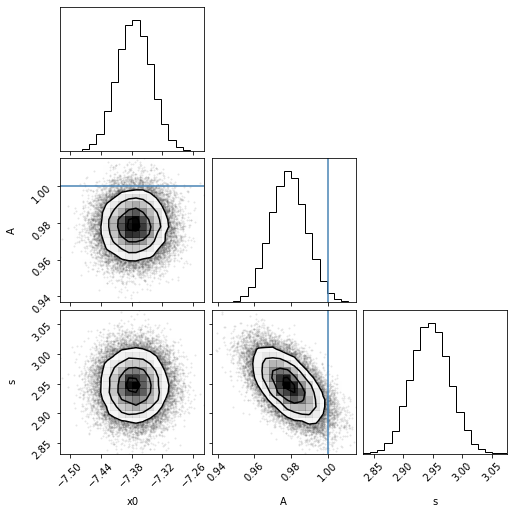

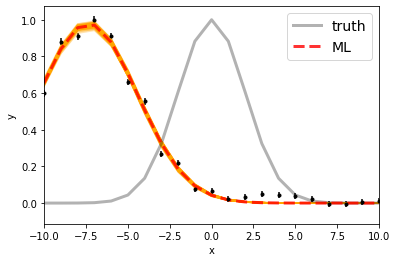

Maximum likelihood estimates:
x0 = -7.375
A = 0.979
s = 2.946


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  4999.624934906504 [0.03312555 0.03318818]
A  =  1.7990316930818602e-16 [1.79934868e-18 1.82071585e-18]
s  =  2.9462419378199 [0.03211862 0.03231089]

-------------------------------------------------------------------------------------------

Ajuste en 6563 nm:

Parámetros reales:
1.0 1.0 1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


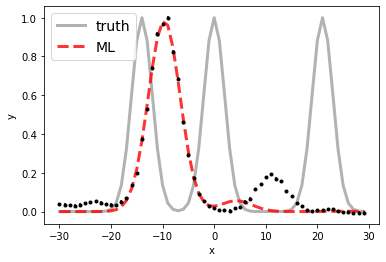

100%|██████████| 15000/15000 [00:21<00:00, 687.85it/s]


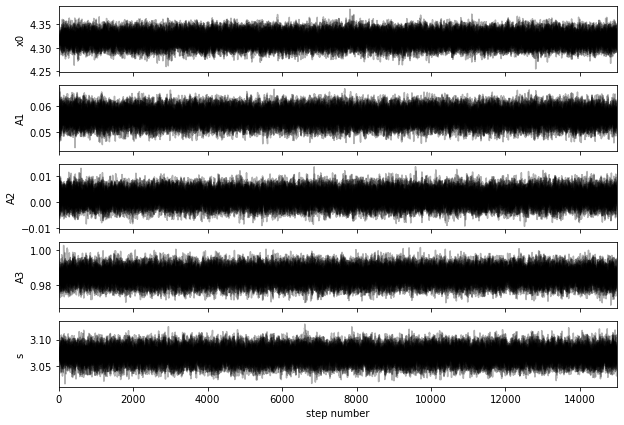

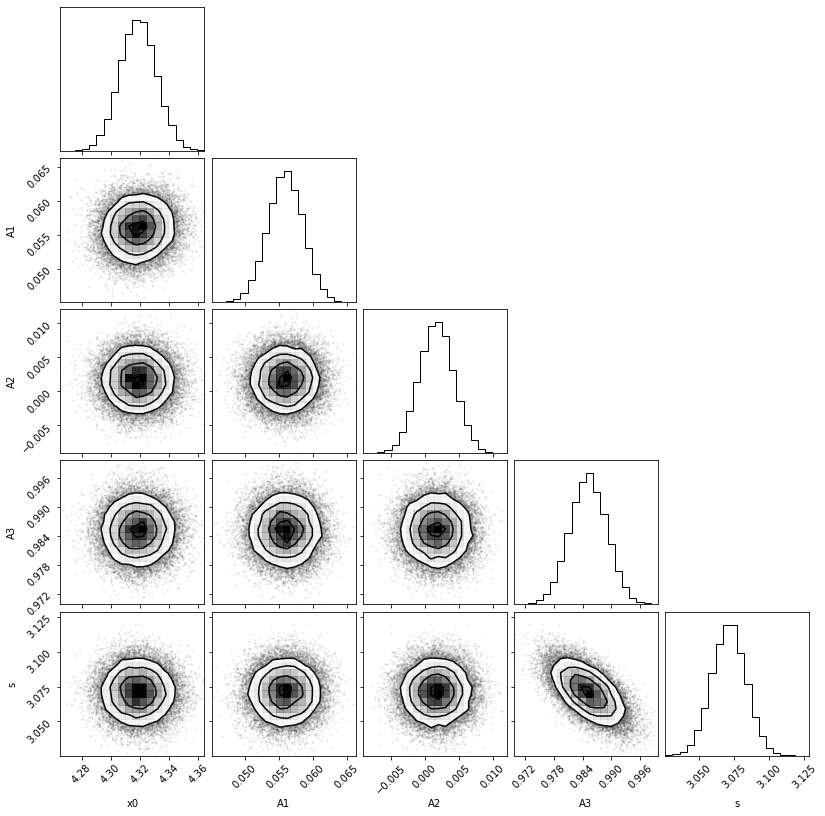

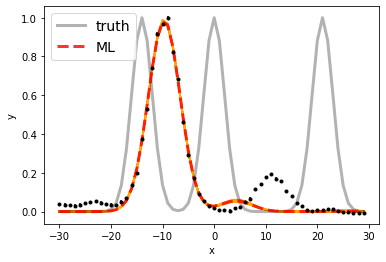

Maximum likelihood estimates:
x0 = 4.319
A1 = 0.056
A2 = 0.002
A3 = 0.985
s = 3.071


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x01, x02 =  6567.31868396823 6588.31868396823 [0.01238081 0.01256788]
A1, A2   =  1.7632146257765132e-17 5.443048147997263e-19 [8.16462342e-19 8.09114975e-19] [8.06516188e-19 7.98096566e-19]
s  =  3.0711278933644497 [0.01215475 0.01212572]

-------------------------------------------------------------------------------------------

///////////////////////////////////////////////////////////////////////////////////////////


AJUSTANDO ESPECTRO 6

Ajuste en 4861 nm:

Parámetros reales:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


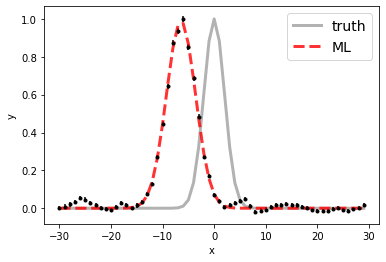

100%|██████████| 15000/15000 [00:14<00:00, 1067.13it/s]


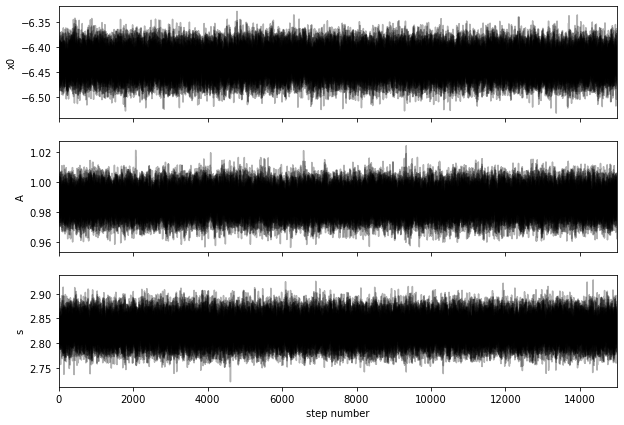

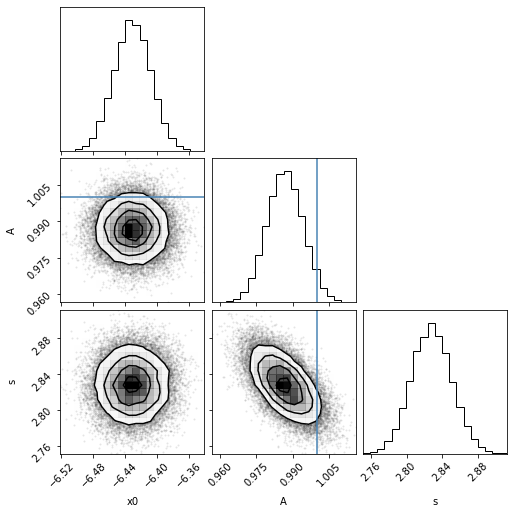

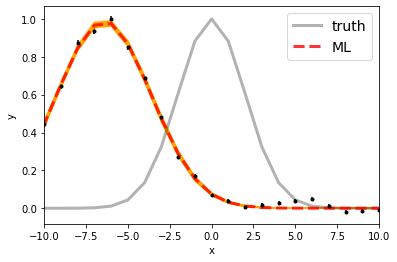

Maximum likelihood estimates:
x0 = -6.431
A = 0.987
s = 2.828


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  4854.569094000573 [0.02298794 0.02321534]
A  =  3.0393649533123077e-16 [2.30131463e-18 2.32385207e-18]
s  =  2.8277691769058286 [0.02205199 0.02251908]

-------------------------------------------------------------------------------------------

Ajuste en 5007 nm:

Parámetros reales:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


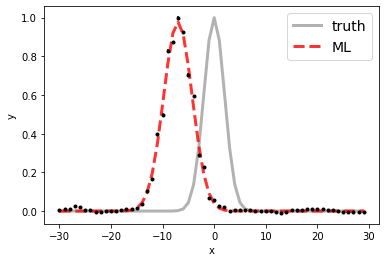

100%|██████████| 15000/15000 [00:14<00:00, 1051.54it/s]


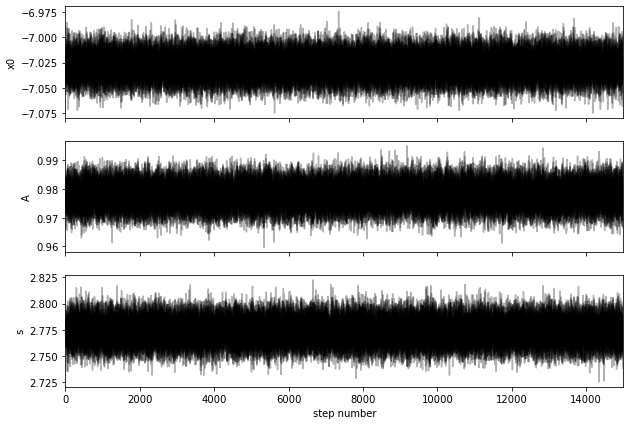

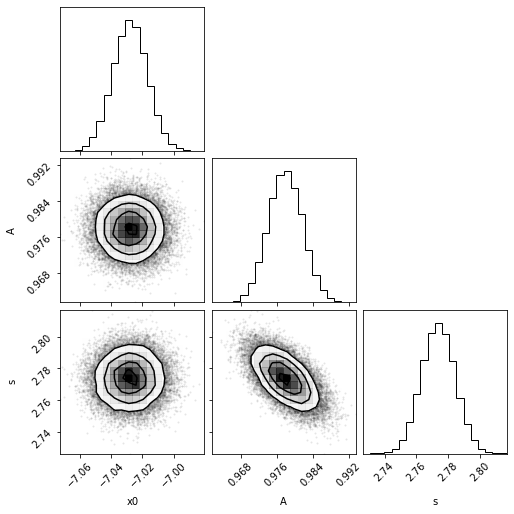

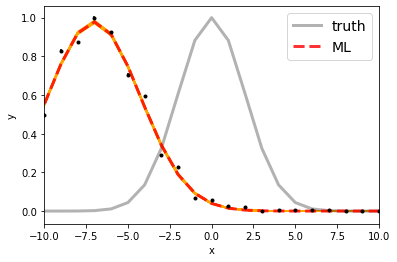

Maximum likelihood estimates:
x0 = -7.028
A = 0.978
s = 2.774


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  4999.9719875090705 [0.01114254 0.010987  ]
A  =  6.189475070971224e-16 [2.37592312e-18 2.41598390e-18]
s  =  2.7737450892155935 [0.01038801 0.01040175]

-------------------------------------------------------------------------------------------

Ajuste en 6563 nm:

Parámetros reales:
1.0 1.0 1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


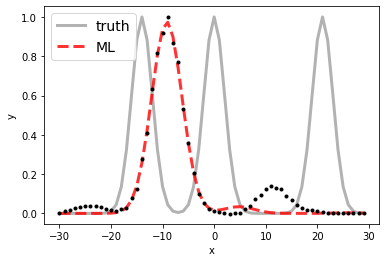

100%|██████████| 15000/15000 [00:22<00:00, 669.41it/s]


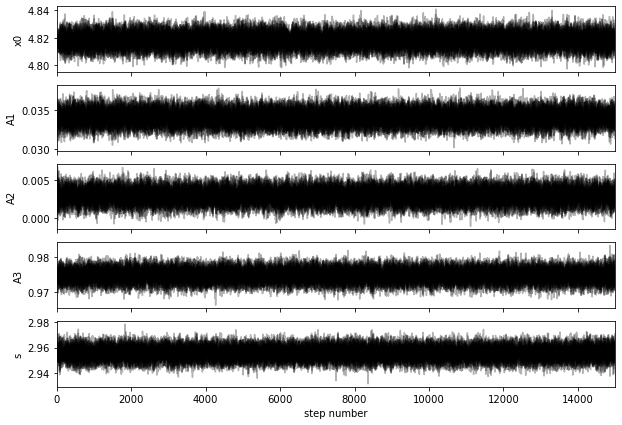

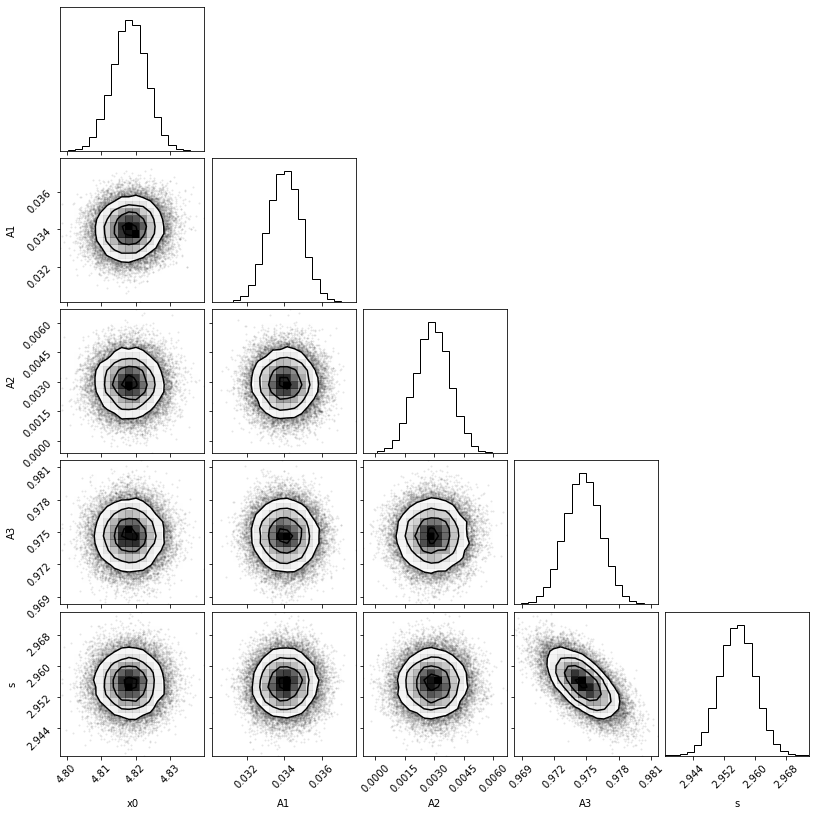

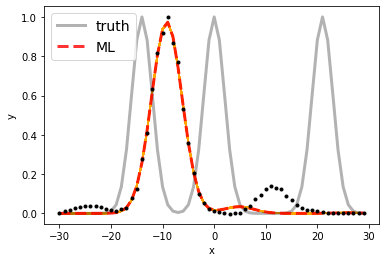

Maximum likelihood estimates:
x0 = 4.818
A1 = 0.034
A2 = 0.003
A3 = 0.975
s = 2.955


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x01, x02 =  6567.81822251363 6588.81822251363 [0.00495053 0.00483342]
A1, A2   =  2.9348659926330566e-17 2.5191574298235733e-18 [7.5226776e-19 7.5101583e-19] [7.70055577e-19 7.49804599e-19]
s  =  2.9554977584922364 [0.00451147 0.00446543]

-------------------------------------------------------------------------------------------

///////////////////////////////////////////////////////////////////////////////////////////


AJUSTANDO ESPECTRO 7

Ajuste en 4861 nm:

Parámetros reales:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


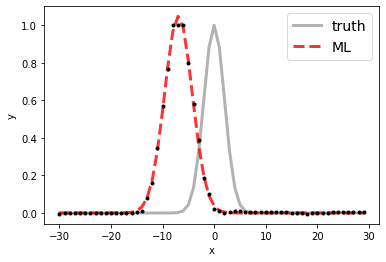

100%|██████████| 15000/15000 [00:16<00:00, 935.35it/s] 


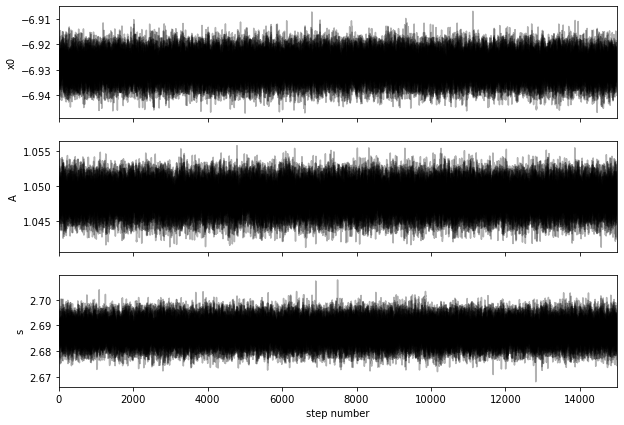

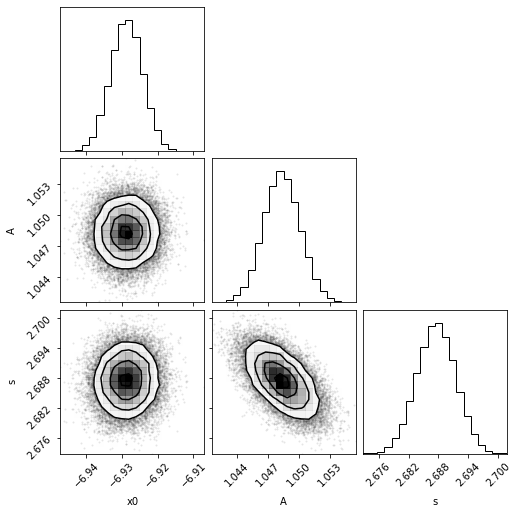

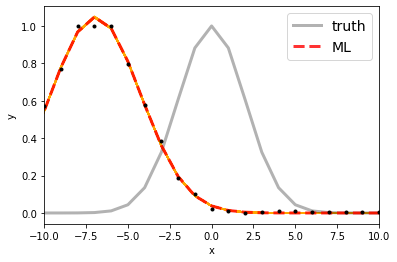

Maximum likelihood estimates:
x0 = -6.929
A = 1.048
s = 2.688


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  4854.07123653586 [0.00446883 0.00446826]
A  =  2.2161862885590265e-15 [3.66175703e-18 3.76414492e-18]
s  =  2.68753829835632 [0.00389368 0.00386212]

-------------------------------------------------------------------------------------------

Ajuste en 5007 nm:

Parámetros reales:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


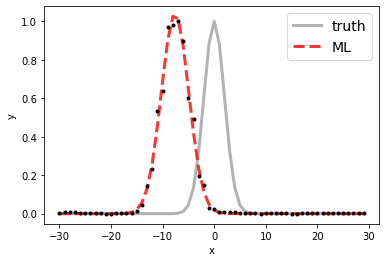

100%|██████████| 15000/15000 [00:15<00:00, 991.38it/s] 


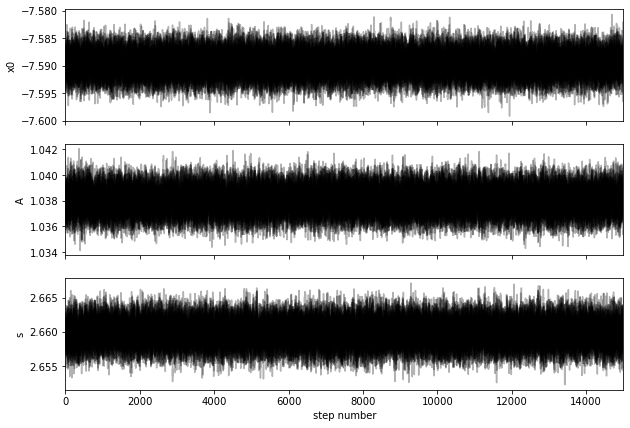

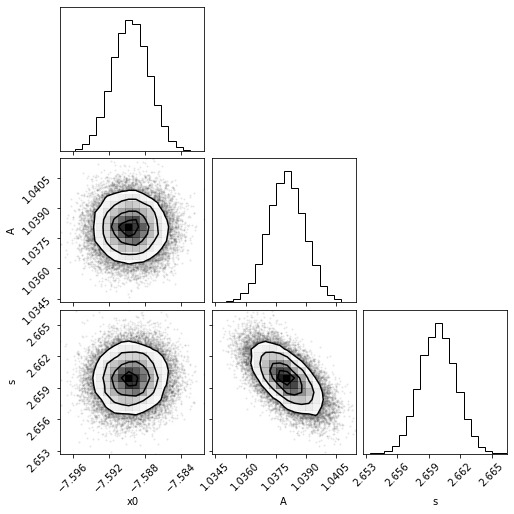

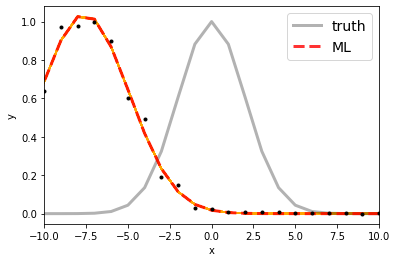

Maximum likelihood estimates:
x0 = -7.590
A = 1.038
s = 2.660


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  4999.410367134712 [0.00203105 0.00204798]
A  =  5.9787494637502854e-15 [5.15213832e-18 5.24951704e-18]
s  =  2.6598739508290503 [0.00169915 0.00170783]

-------------------------------------------------------------------------------------------

Ajuste en 6563 nm:

Parámetros reales:
1.0 1.0 1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


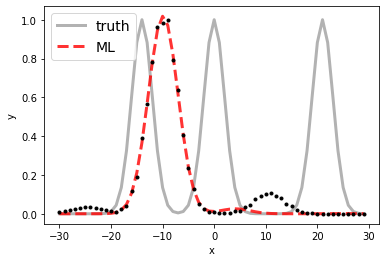

100%|██████████| 15000/15000 [00:22<00:00, 655.31it/s]


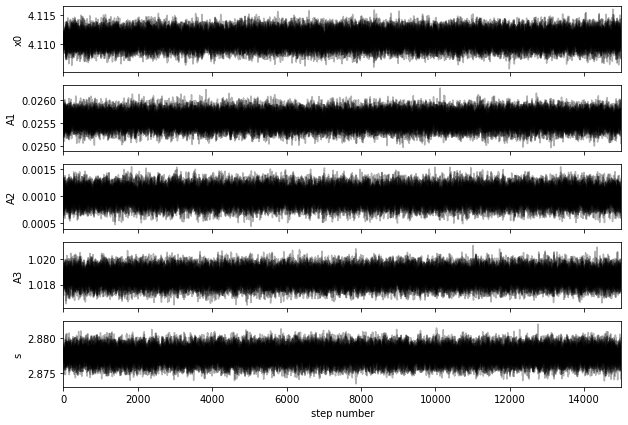

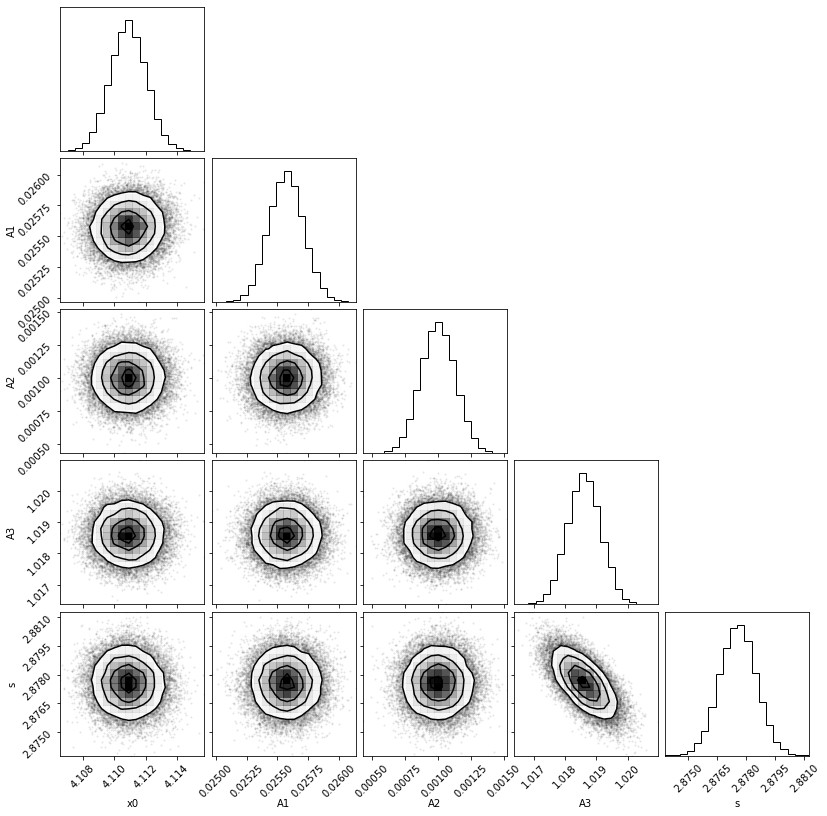

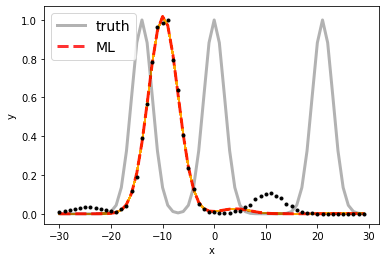

Maximum likelihood estimates:
x0 = 4.111
A1 = 0.026
A2 = 0.001
A3 = 1.019
s = 2.878


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x01, x02 =  6567.110885115189 6588.110885115189 [0.00114768 0.0011345 ]
A1, A2   =  1.6246989703528778e-16 6.357192444294113e-18 [8.95755070e-19 8.90320869e-19] [8.22808106e-19 8.22889002e-19]
s  =  2.8775673202498036 [0.00094196 0.00093933]

-------------------------------------------------------------------------------------------

///////////////////////////////////////////////////////////////////////////////////////////


AJUSTANDO ESPECTRO 8

Ajuste en 4861 nm:

Parámetros reales:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


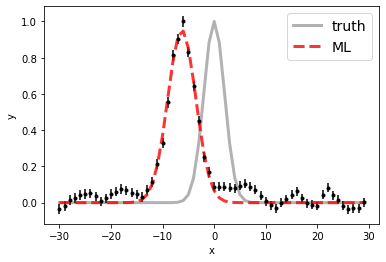

100%|██████████| 15000/15000 [00:15<00:00, 984.91it/s] 


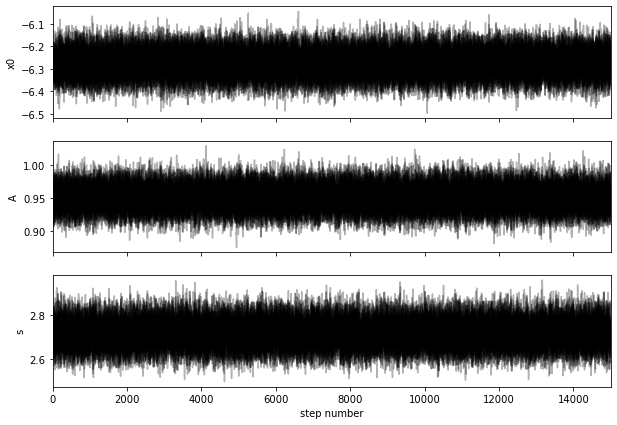

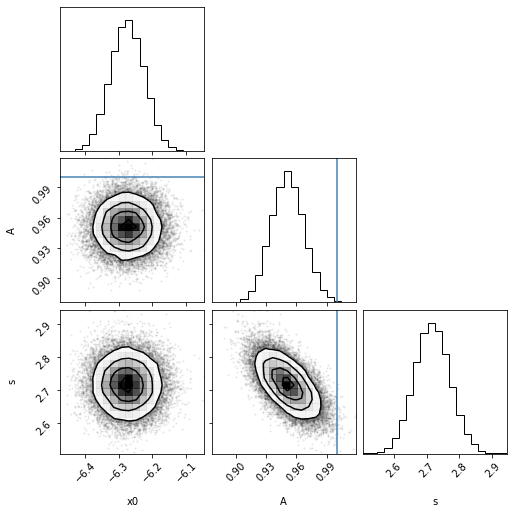

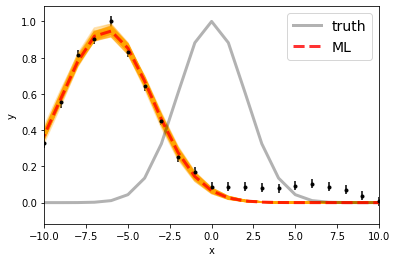

Maximum likelihood estimates:
x0 = -6.275
A = 0.952
s = 2.716


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  4854.725034289191 [0.05043383 0.05044772]
A  =  1.398410233838439e-16 [2.36945371e-18 2.39983899e-18]
s  =  2.716303627705316 [0.05327996 0.05414356]

-------------------------------------------------------------------------------------------

Ajuste en 5007 nm:

Parámetros reales:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


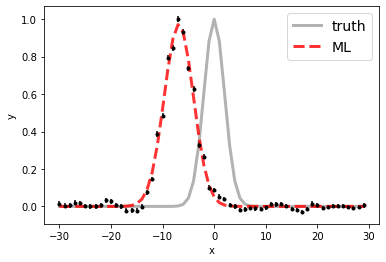

100%|██████████| 15000/15000 [00:15<00:00, 974.53it/s] 


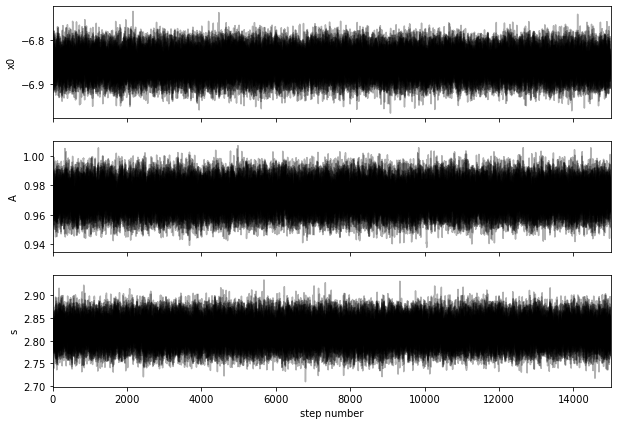

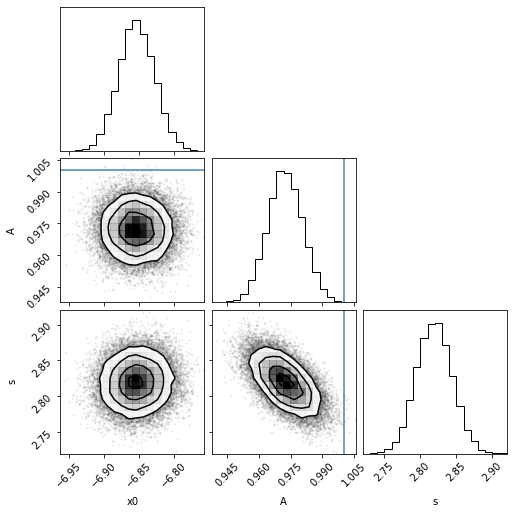

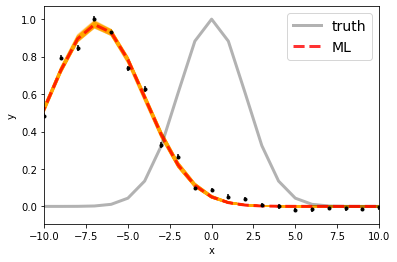

Maximum likelihood estimates:
x0 = -6.853
A = 0.972
s = 2.820


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  5000.1463704764865 [0.02532373 0.02616782]
A  =  2.605740414612889e-16 [2.19556442e-18 2.24467457e-18]
s  =  2.819661736175824 [0.02443157 0.02461406]

-------------------------------------------------------------------------------------------

Ajuste en 6563 nm:

Parámetros reales:
1.0 1.0 1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


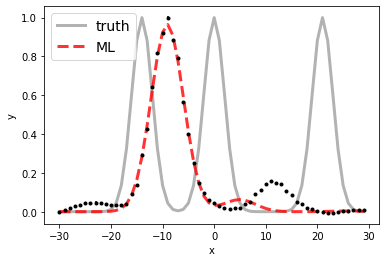

100%|██████████| 15000/15000 [00:23<00:00, 637.57it/s]


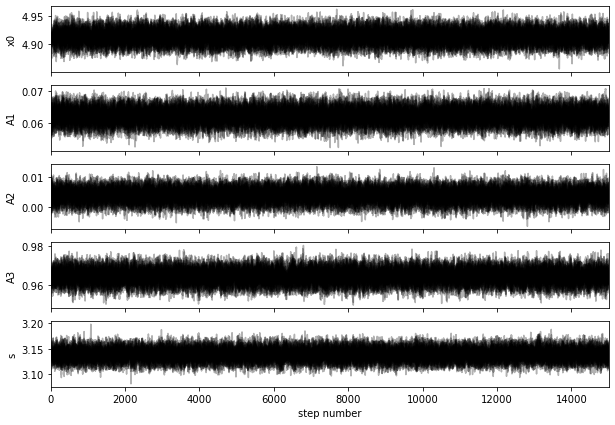

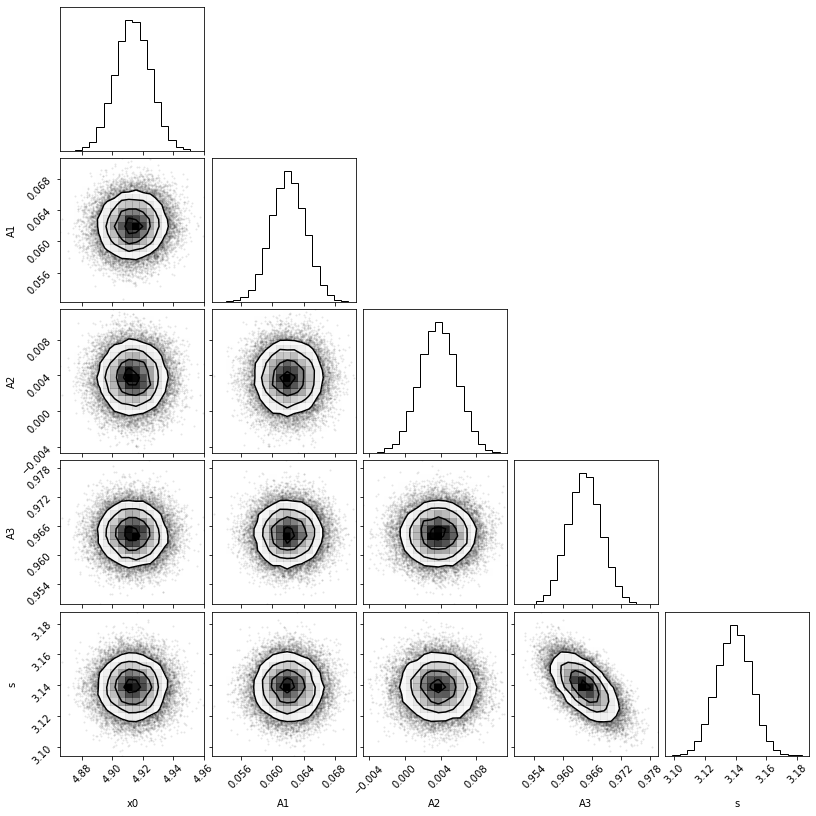

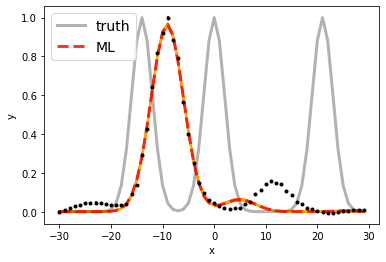

Maximum likelihood estimates:
x0 = 4.913
A1 = 0.062
A2 = 0.004
A3 = 0.964
s = 3.139


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x01, x02 =  6567.913289885504 6588.913289885504 [0.01129909 0.01147116]
A1, A2   =  2.3119022740287112e-17 1.3943693634655873e-18 [8.15382826e-19 8.24621210e-19] [7.77739232e-19 7.77055378e-19]
s  =  3.138947704039749 [0.01116352 0.01094978]

-------------------------------------------------------------------------------------------

///////////////////////////////////////////////////////////////////////////////////////////


AJUSTANDO ESPECTRO 9

Ajuste en 4861 nm:

Parámetros reales:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


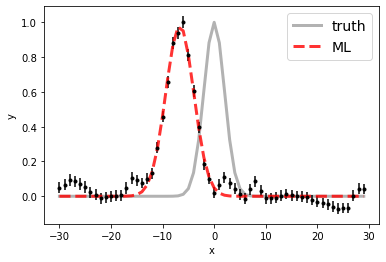

100%|██████████| 15000/15000 [00:14<00:00, 1007.23it/s]


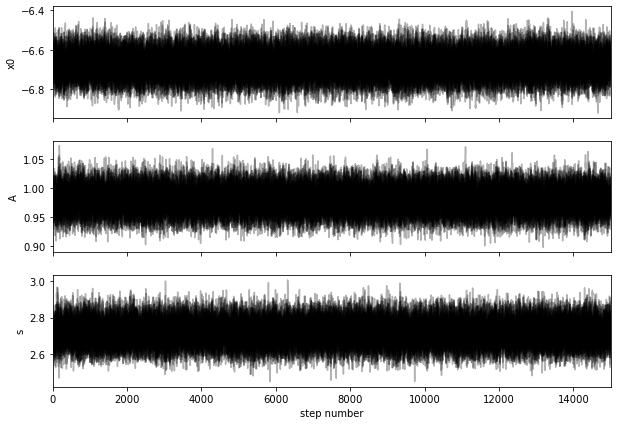

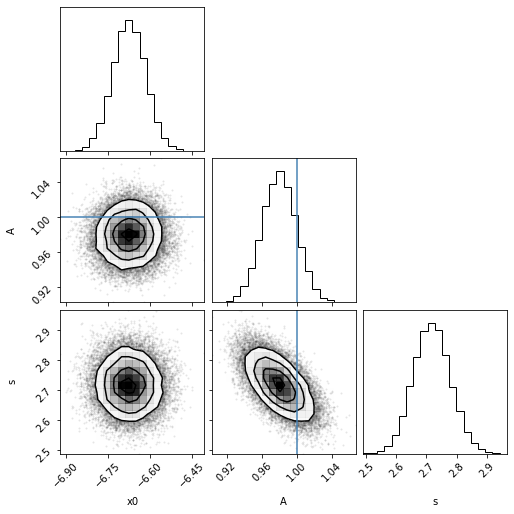

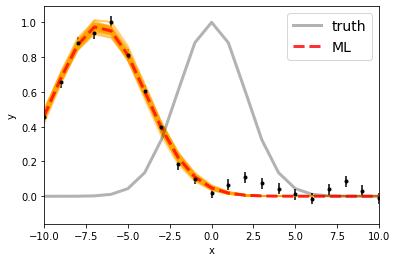

Maximum likelihood estimates:
x0 = -6.673
A = 0.980
s = 2.716


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  4854.3260194347595 [0.05854268 0.05880817]
A  =  9.351741325969578e-17 [1.85612041e-18 1.83505734e-18]
s  =  2.7171525255639652 [0.06084382 0.06171544]

-------------------------------------------------------------------------------------------

Ajuste en 5007 nm:

Parámetros reales:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


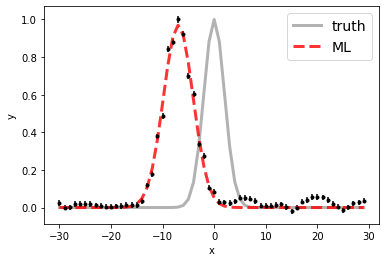

100%|██████████| 15000/15000 [00:14<00:00, 1014.09it/s]


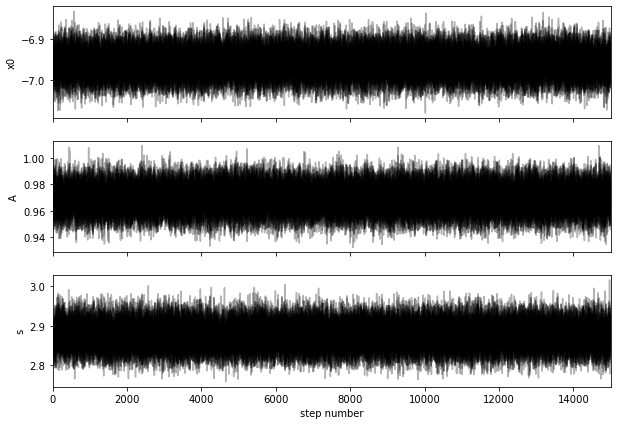

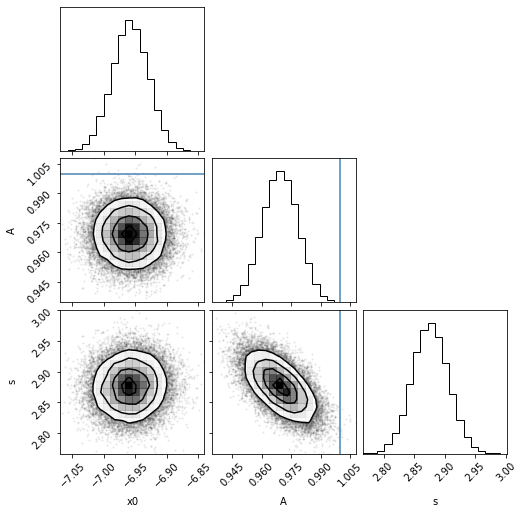

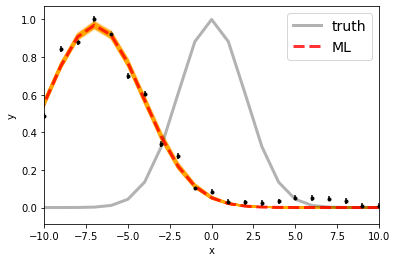

Maximum likelihood estimates:
x0 = -6.959
A = 0.970
s = 2.875


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  5000.041541411039 [0.02902122 0.02877347]
A  =  1.7974884937490647e-16 [1.70626746e-18 1.67552656e-18]
s  =  2.8760759749219615 [0.02932651 0.02939721]

-------------------------------------------------------------------------------------------

Ajuste en 6563 nm:

Parámetros reales:
1.0 1.0 1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


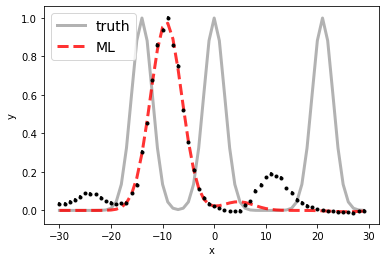

100%|██████████| 15000/15000 [00:22<00:00, 657.20it/s]


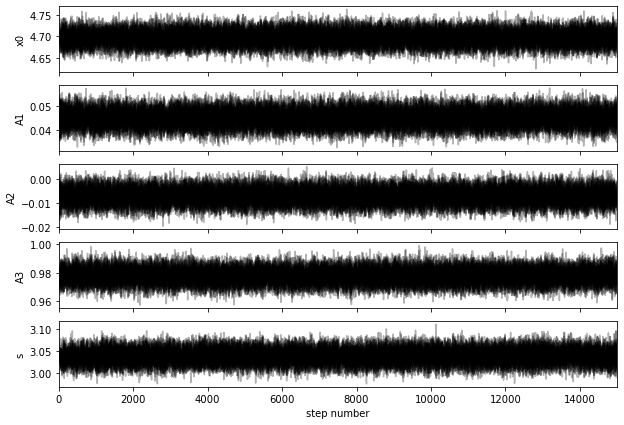

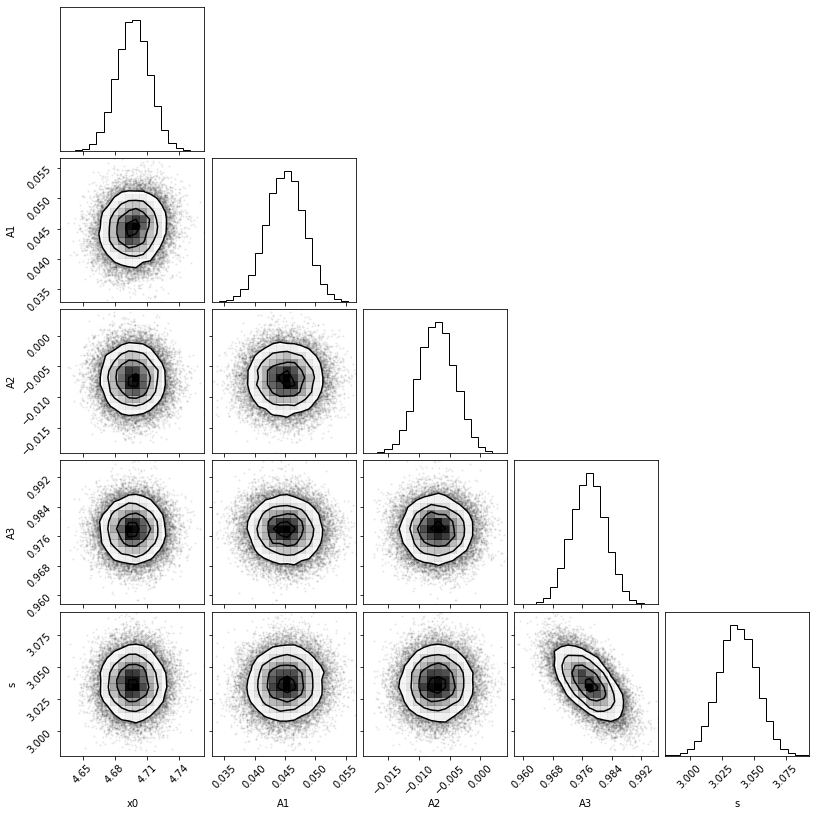

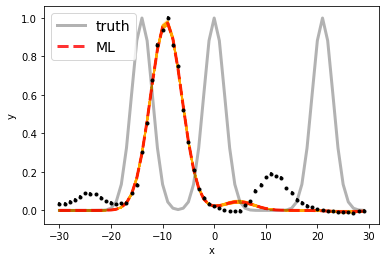

Maximum likelihood estimates:
x0 = 4.697
A1 = 0.045
A2 = -0.007
A3 = 0.978
s = 3.038


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x01, x02 =  6567.697028952155 6588.697028952155 [0.01538189 0.01530242]
A1, A2   =  1.0584203662063817e-17 -1.6552380625896355e-18 [7.35410766e-19 7.31921352e-19] [6.85493718e-19 6.94023961e-19]
s  =  3.03744891135736 [0.01446731 0.01484769]

-------------------------------------------------------------------------------------------

///////////////////////////////////////////////////////////////////////////////////////////


AJUSTANDO ESPECTRO 10

Ajuste en 4861 nm:

Parámetros reales:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


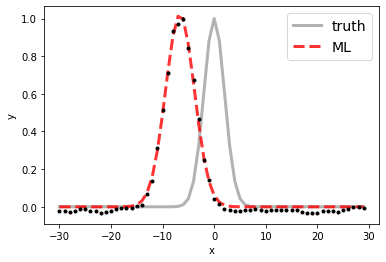

100%|██████████| 15000/15000 [00:14<00:00, 1001.45it/s]


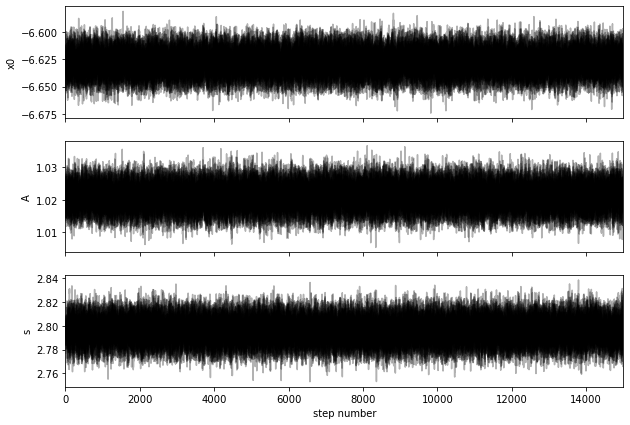

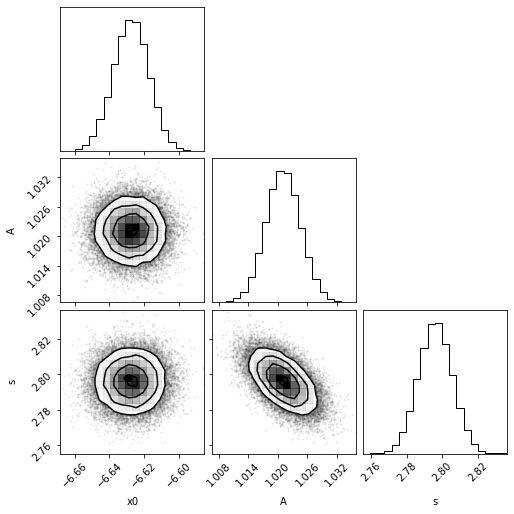

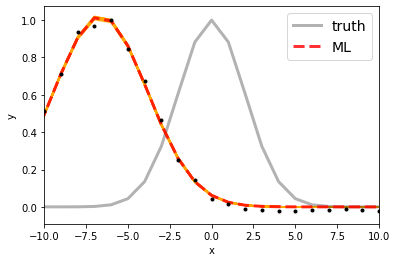

Maximum likelihood estimates:
x0 = -6.628
A = 1.021
s = 2.796


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  4854.37243892614 [0.01036681 0.01008928]
A  =  9.480445515082087e-16 [3.23120801e-18 3.26501954e-18]
s  =  2.7959990642952355 [0.00950463 0.00949829]

-------------------------------------------------------------------------------------------

Ajuste en 5007 nm:

Parámetros reales:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


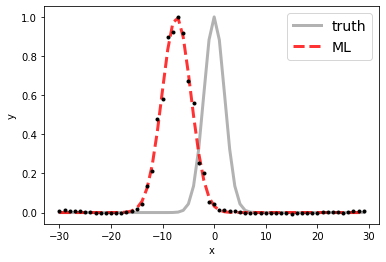

100%|██████████| 15000/15000 [00:15<00:00, 995.38it/s] 


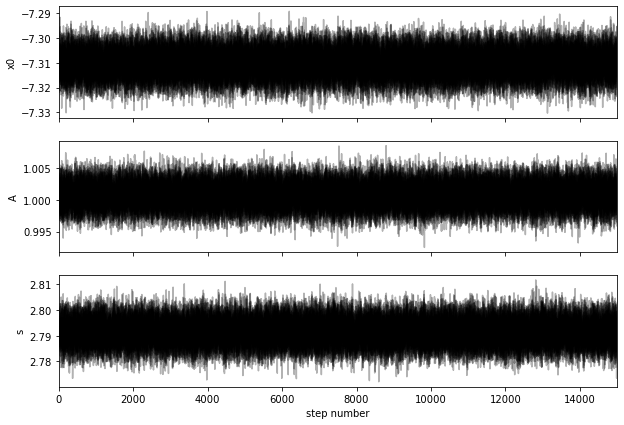

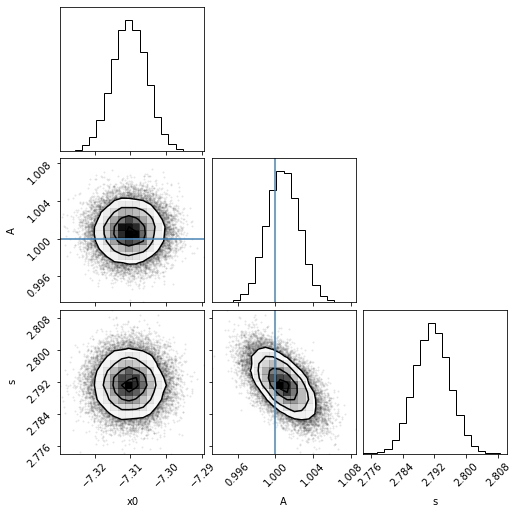

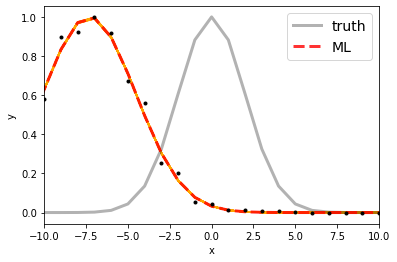

Maximum likelihood estimates:
x0 = -7.310
A = 1.001
s = 2.792


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  4999.689743688409 [0.00475043 0.00481167]
A  =  2.1849693208570447e-15 [3.77570187e-18 3.79401635e-18]
s  =  2.7915046574150666 [0.004357   0.00441806]

-------------------------------------------------------------------------------------------

Ajuste en 6563 nm:

Parámetros reales:
1.0 1.0 1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


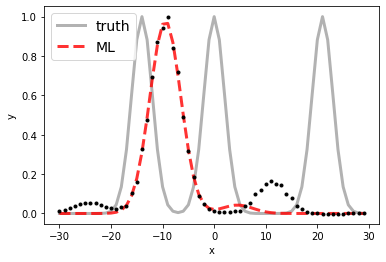

100%|██████████| 15000/15000 [00:22<00:00, 653.15it/s]


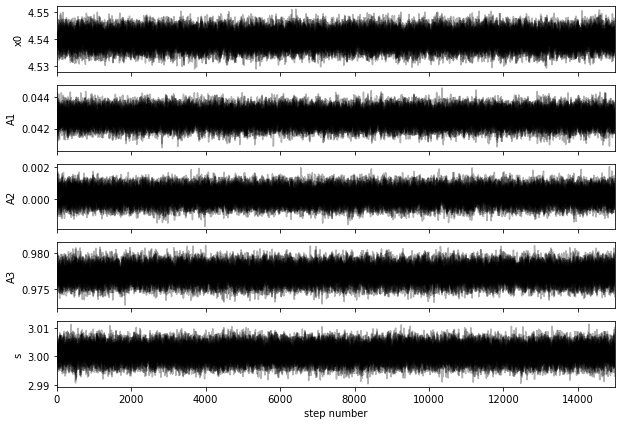

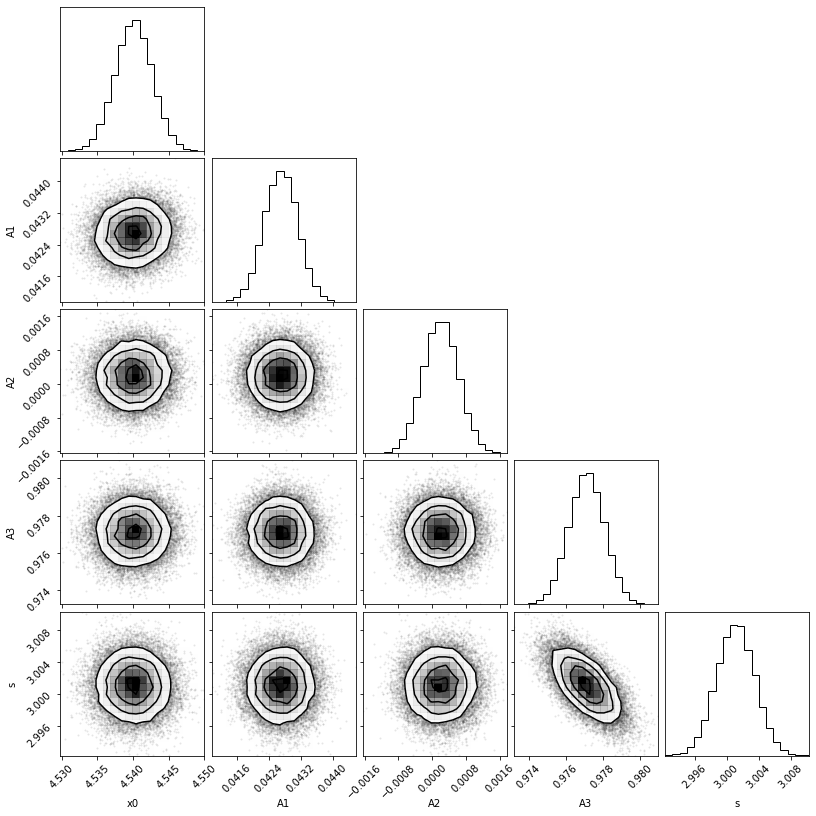

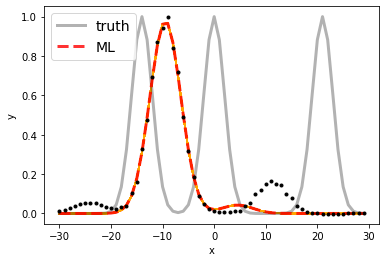

Maximum likelihood estimates:
x0 = 4.540
A1 = 0.043
A2 = 0.000
A3 = 0.977
s = 3.001


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x01, x02 =  6567.540077374336 6588.540077374336 [0.00260076 0.00257523]
A1, A2   =  1.139986823889643e-16 5.126749607005869e-19 [1.13995284e-18 1.11102223e-18] [1.11855611e-18 1.10087275e-18]
s  =  3.0011203500768655 [0.002383  0.0023706]

-------------------------------------------------------------------------------------------

///////////////////////////////////////////////////////////////////////////////////////////


AJUSTANDO ESPECTRO 11

Ajuste en 4861 nm:

Parámetros reales:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


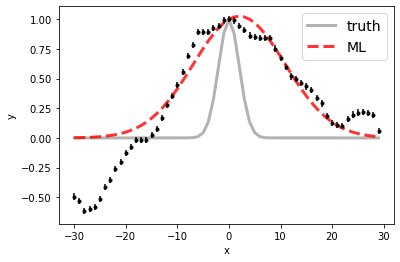

  0%|          | 0/15000 [00:00<?, ?it/s]C:\Users\saruk\anaconda3\lib\site-packages\emcee\moves\red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
100%|██████████| 15000/15000 [00:07<00:00, 1954.26it/s]


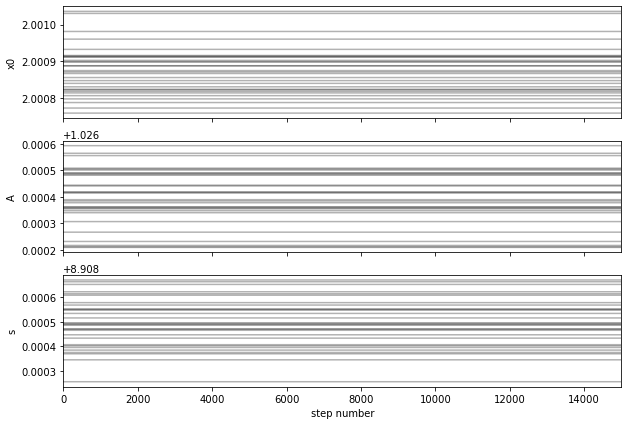

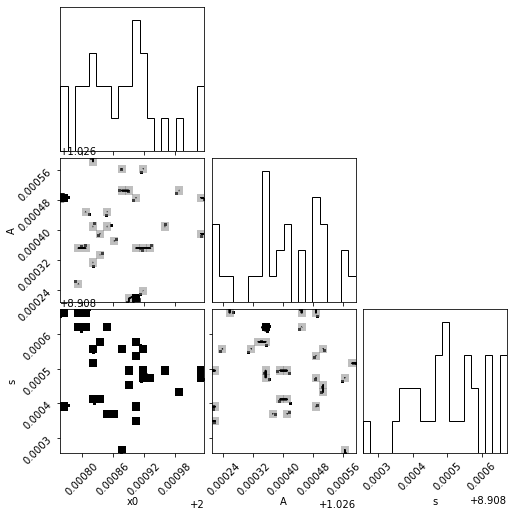

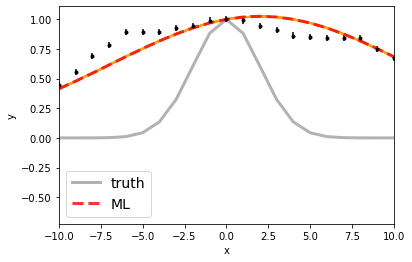

Maximum likelihood estimates:
x0 = 2.001
A = 1.026
s = 8.909


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  4863.00087271526 [6.65926128e-05 5.96478124e-05]
A  =  1.492116167173861e-16 [1.96725108e-20 1.49401944e-20]
s  =  8.90849153963077 [0.00010653 0.00012385]

-------------------------------------------------------------------------------------------

Ajuste en 5007 nm:

Parámetros reales:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


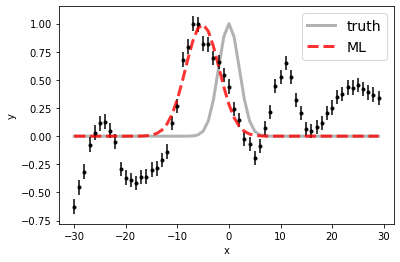

100%|██████████| 15000/15000 [00:14<00:00, 1012.57it/s]


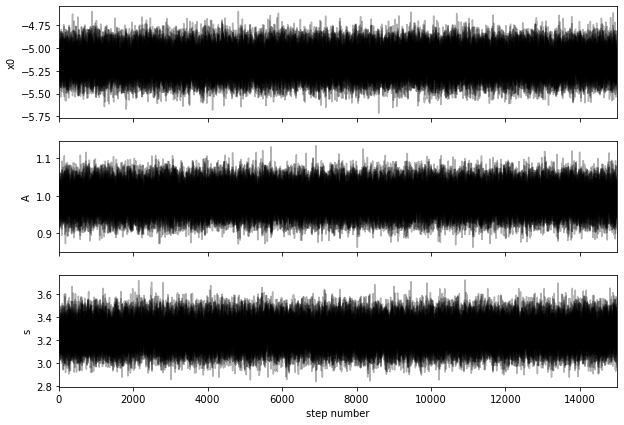

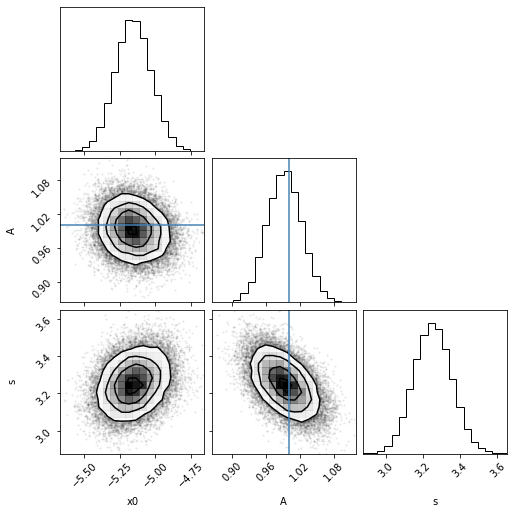

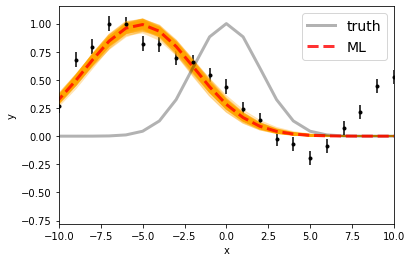

Maximum likelihood estimates:
x0 = -5.155
A = 0.993
s = 3.250


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  5001.843525869594 [0.12463228 0.12939627]
A  =  5.506113246127013e-17 [1.72388096e-18 1.72328870e-18]
s  =  3.2511767277511803 [0.09979523 0.10216198]

-------------------------------------------------------------------------------------------

Ajuste en 6563 nm:

Parámetros reales:
1.0 1.0 1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


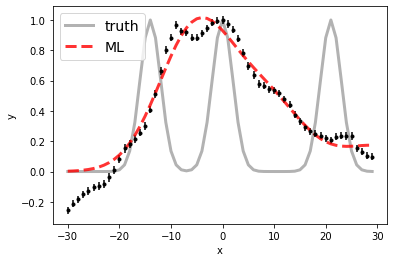

  0%|          | 0/15000 [00:00<?, ?it/s]C:\Users\saruk\anaconda3\lib\site-packages\emcee\moves\red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
100%|██████████| 15000/15000 [00:08<00:00, 1855.10it/s]


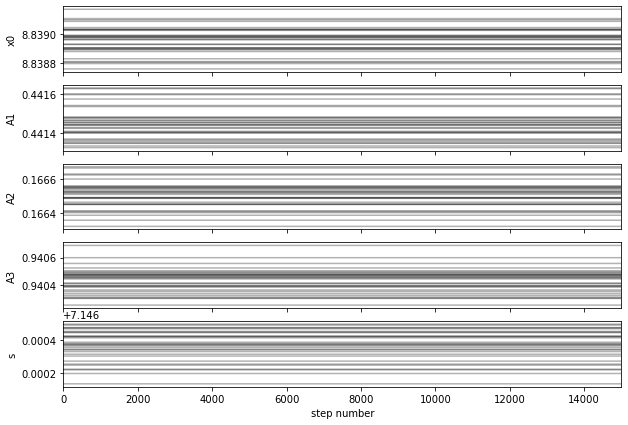

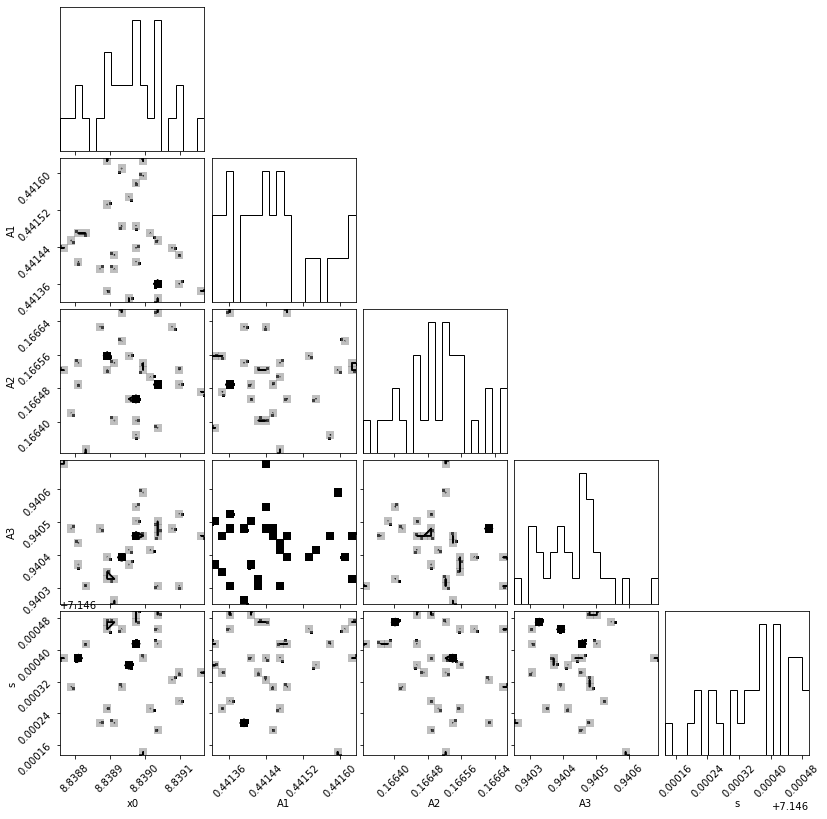

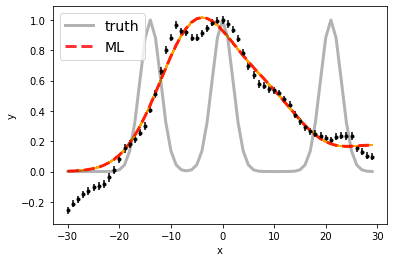

Maximum likelihood estimates:
x0 = 8.839
A1 = 0.441
A2 = 0.167
A3 = 0.940
s = 7.146


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x01, x02 =  6571.8389674346945 6592.8389674346945 [1.39003491e-04 7.62088857e-05]
A1, A2   =  4.140085945487747e-17 1.5616564710693134e-17 [8.24163406e-21 1.25462110e-20] [9.66551574e-21 7.90773187e-21]
s  =  7.146373409902501 [1.26504794e-04 9.65407082e-05]

-------------------------------------------------------------------------------------------

///////////////////////////////////////////////////////////////////////////////////////////


AJUSTANDO ESPECTRO 12

Ajuste en 4861 nm:

Parámetros reales:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


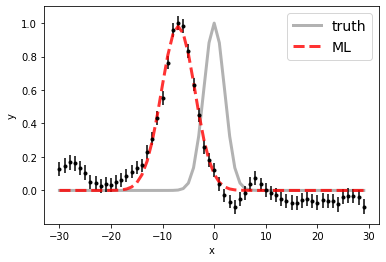

100%|██████████| 15000/15000 [00:16<00:00, 937.45it/s] 


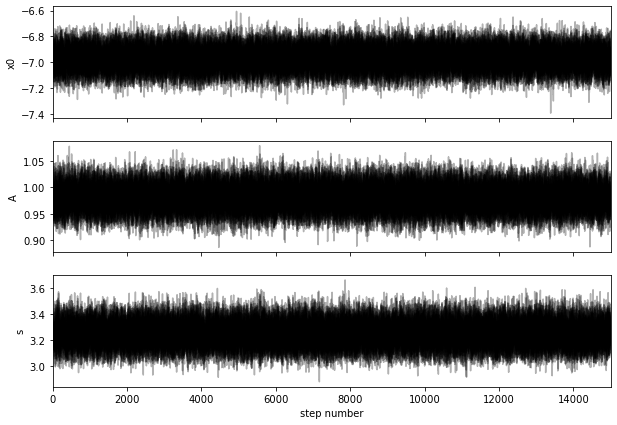

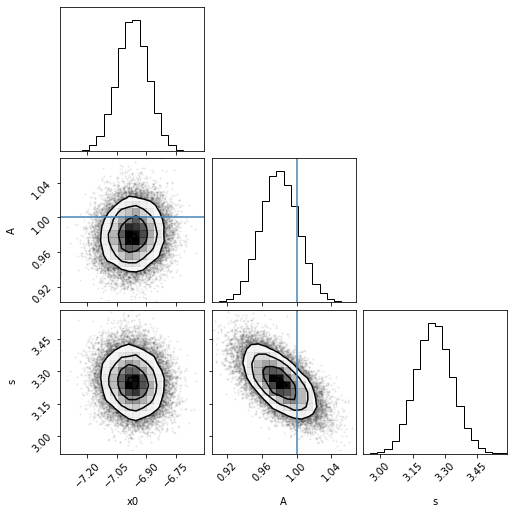

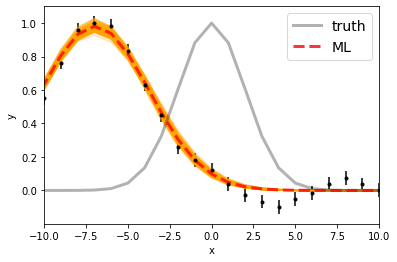

Maximum likelihood estimates:
x0 = -6.970
A = 0.981
s = 3.247


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  4854.030099547086 [0.07829655 0.07824883]
A  =  7.35010938515147e-17 [1.58197494e-18 1.62211870e-18]
s  =  3.2486547172886393 [0.08350303 0.08549799]

-------------------------------------------------------------------------------------------

Ajuste en 5007 nm:

Parámetros reales:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


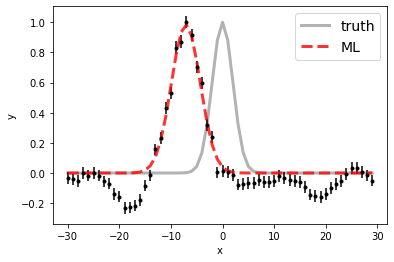

100%|██████████| 15000/15000 [00:15<00:00, 947.98it/s] 


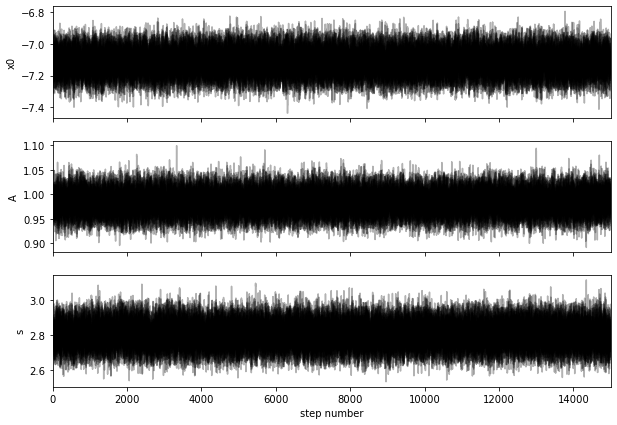

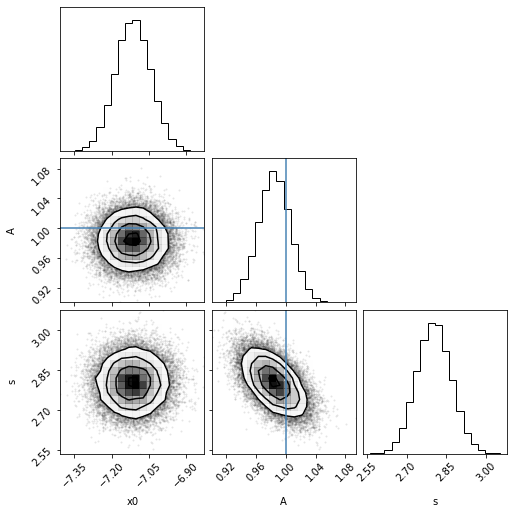

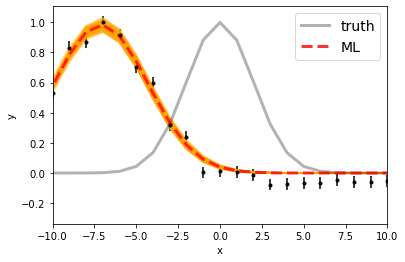

Maximum likelihood estimates:
x0 = -7.115
A = 0.984
s = 2.801


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  4999.885584968905 [0.07064813 0.07090809]
A  =  7.734008473323538e-17 [1.67536113e-18 1.68897165e-18]
s  =  2.80245840271487 [0.06486314 0.06525801]

-------------------------------------------------------------------------------------------

Ajuste en 6563 nm:

Parámetros reales:
1.0 1.0 1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


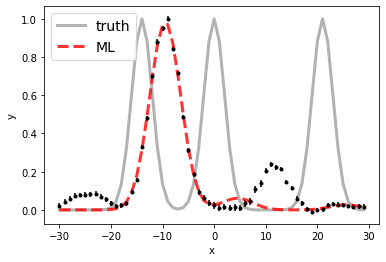

100%|██████████| 15000/15000 [00:23<00:00, 647.80it/s]


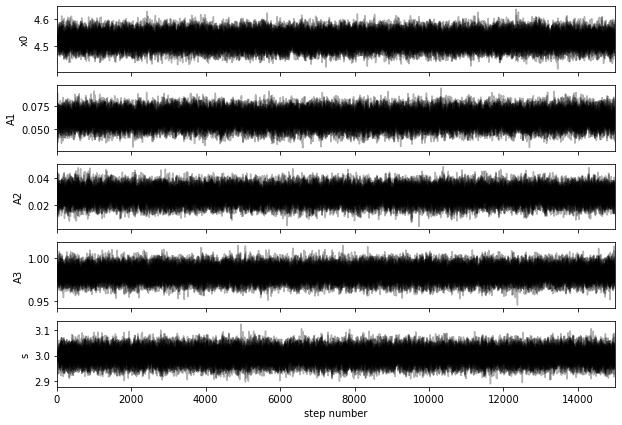

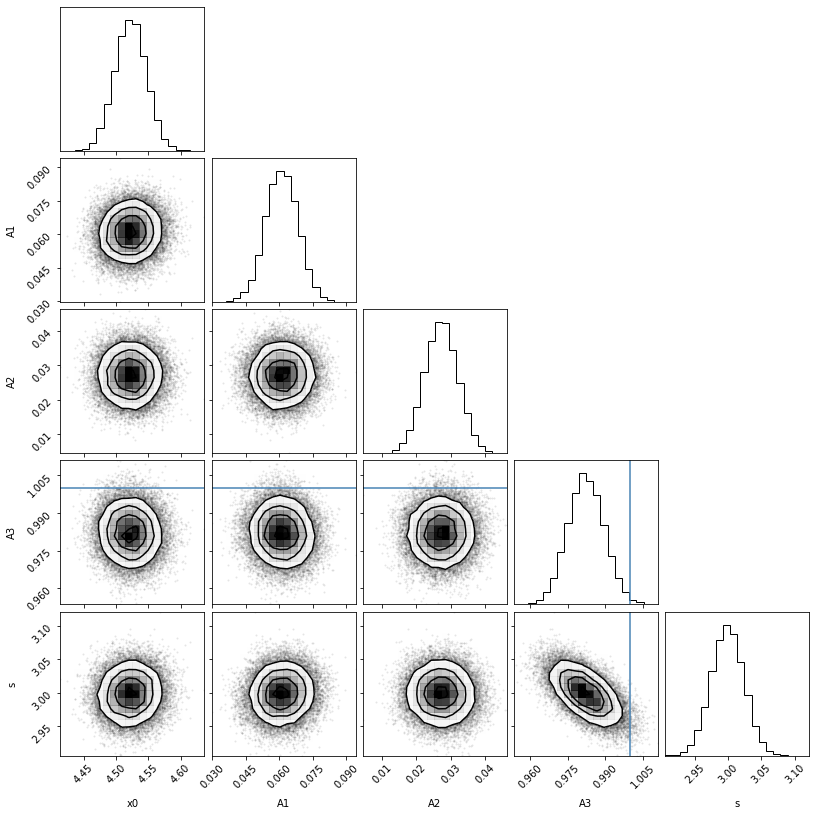

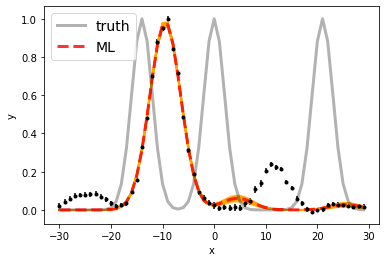

Maximum likelihood estimates:
x0 = 4.522
A1 = 0.061
A2 = 0.027
A3 = 0.982
s = 2.999


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x01, x02 =  6567.52212949669 6588.52212949669 [0.0243058  0.02403675]
A1, A2   =  1.0290397419336235e-17 4.5779817071696206e-18 [1.20554832e-18 1.22317440e-18] [8.09326666e-19 8.13692537e-19]
s  =  2.999136736548172 [0.02412734 0.02452647]

-------------------------------------------------------------------------------------------

///////////////////////////////////////////////////////////////////////////////////////////


AJUSTANDO ESPECTRO 13

Ajuste en 4861 nm:

Parámetros reales:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


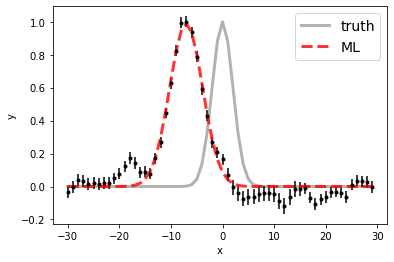

  0%|          | 0/15000 [00:00<?, ?it/s]C:\Users\saruk\anaconda3\lib\site-packages\emcee\moves\red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
100%|██████████| 15000/15000 [00:07<00:00, 2021.19it/s]


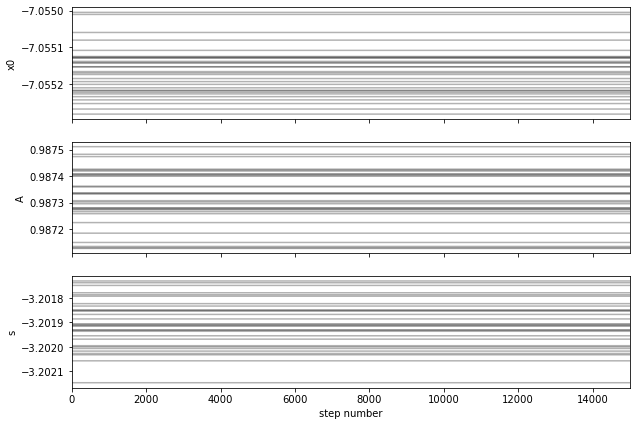

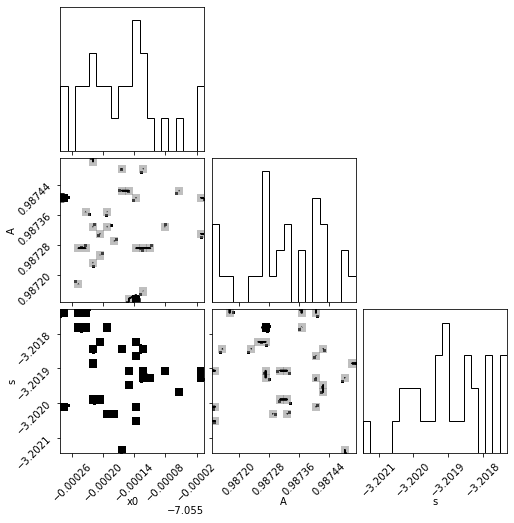

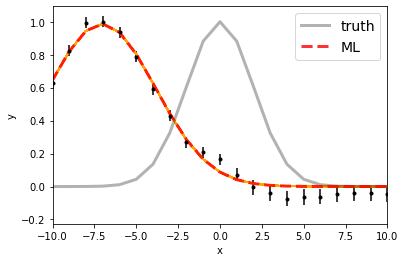

Maximum likelihood estimates:
x0 = -7.055
A = 0.987
s = -3.202


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  4853.944831809918 [6.65926128e-05 5.96478124e-05]
A  =  9.869652707486185e-17 [1.35275095e-20 1.02734025e-20]
s  =  -3.201910403629964 [0.00010653 0.00012385]

-------------------------------------------------------------------------------------------

Ajuste en 5007 nm:

Parámetros reales:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


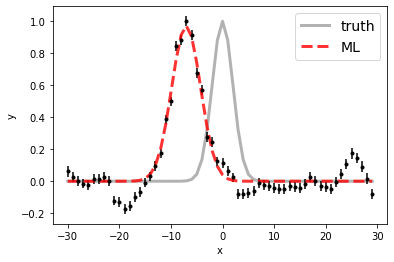

100%|██████████| 15000/15000 [00:14<00:00, 1027.88it/s]


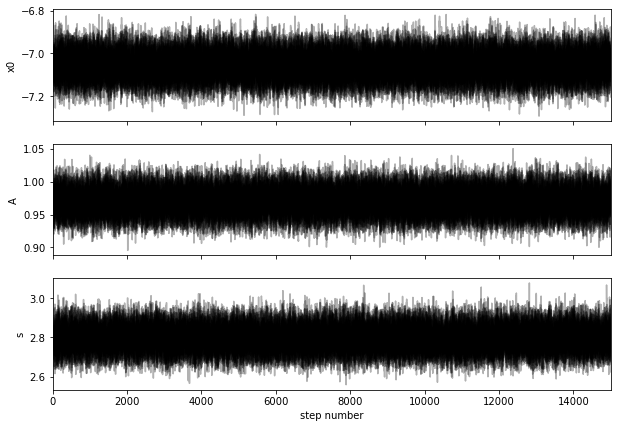

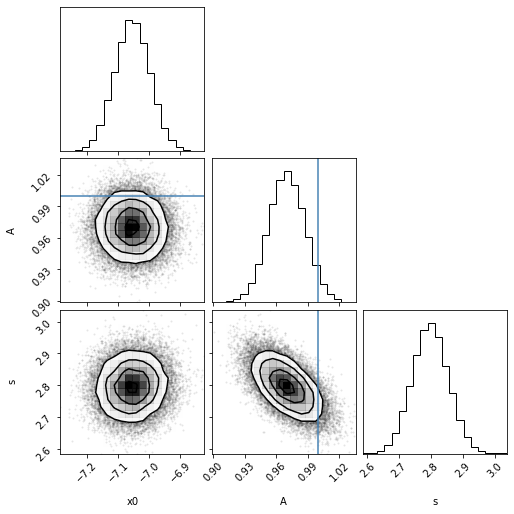

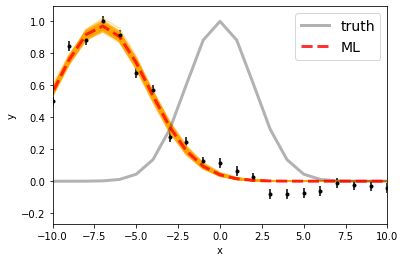

Maximum likelihood estimates:
x0 = -7.054
A = 0.971
s = 2.795


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  4999.945437533723 [0.05667103 0.05644793]
A  =  1.0327691358617806e-16 [1.82308715e-18 1.86510037e-18]
s  =  2.7965905672687117 [0.05564223 0.05692885]

-------------------------------------------------------------------------------------------

Ajuste en 6563 nm:

Parámetros reales:
1.0 1.0 1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


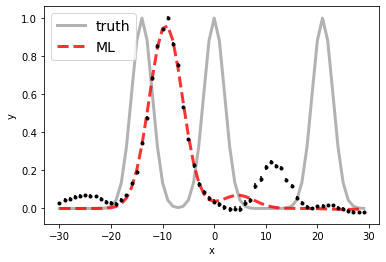

100%|██████████| 15000/15000 [00:22<00:00, 659.73it/s]


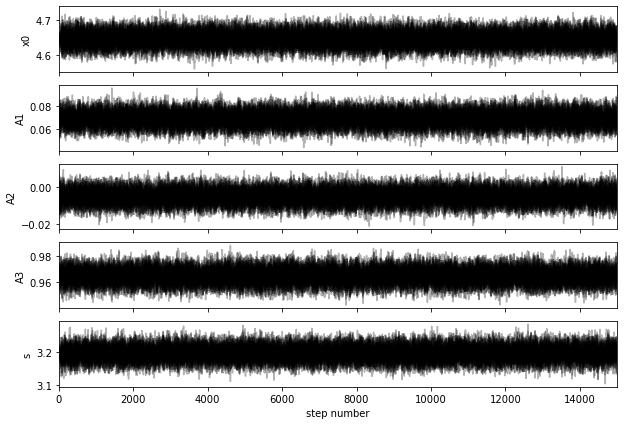

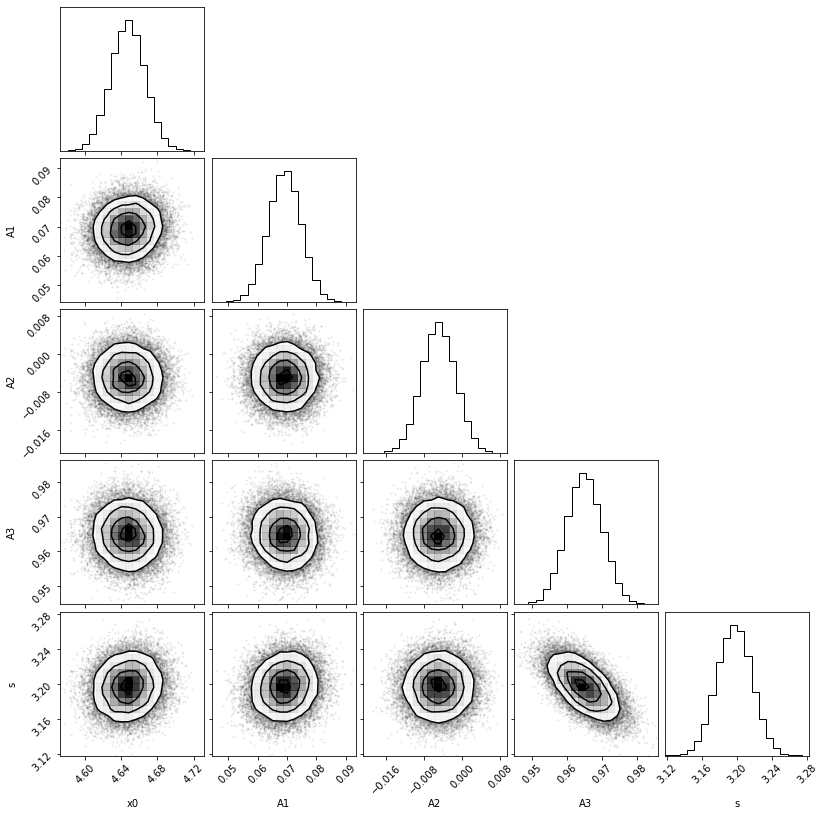

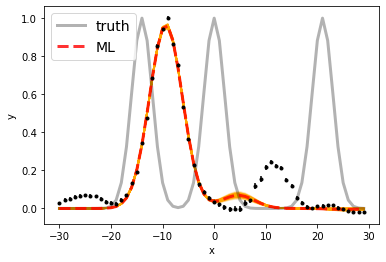

Maximum likelihood estimates:
x0 = 4.647
A1 = 0.069
A2 = -0.005
A3 = 0.965
s = 3.197


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x01, x02 =  6567.64719448519 6588.64719448519 [0.01863171 0.01867319]
A1, A2   =  1.7225354175421177e-17 -1.2301929650595946e-18 [1.38023928e-18 1.38261226e-18] [8.68789461e-19 8.84836017e-19]
s  =  3.1970469449302463 [0.01995156 0.01947388]

-------------------------------------------------------------------------------------------

///////////////////////////////////////////////////////////////////////////////////////////


AJUSTANDO ESPECTRO 14

Ajuste en 4861 nm:

Parámetros reales:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


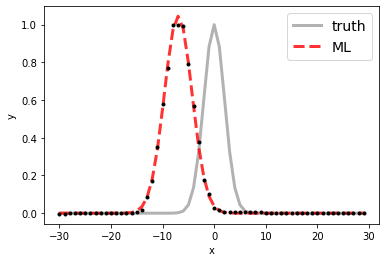

100%|██████████| 15000/15000 [00:14<00:00, 1026.50it/s]


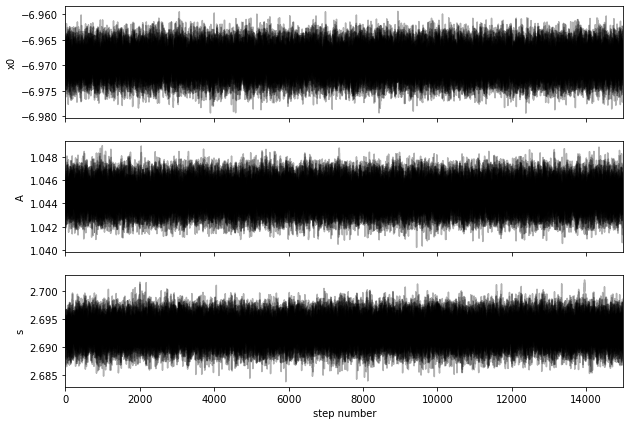

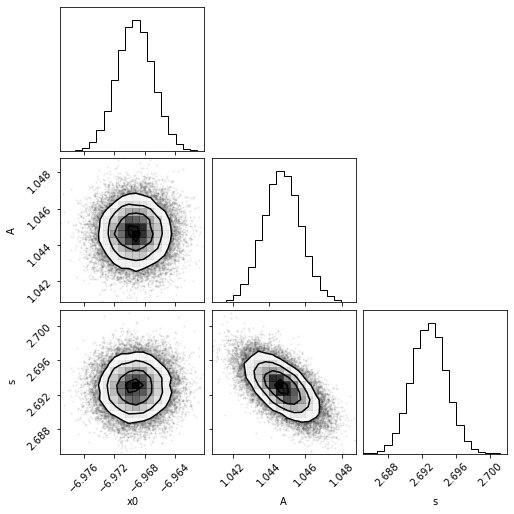

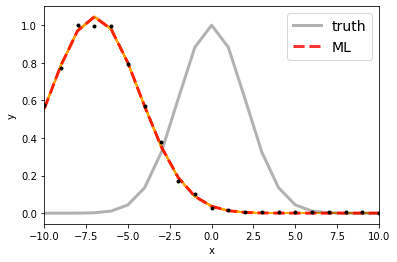

Maximum likelihood estimates:
x0 = -6.969
A = 1.045
s = 2.693


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  4854.030695834475 [0.0023653  0.00238813]
A  =  5.089879371749559e-15 [5.08227304e-18 5.07370800e-18]
s  =  2.6928793565519467 [0.00202726 0.00198513]

-------------------------------------------------------------------------------------------

Ajuste en 5007 nm:

Parámetros reales:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


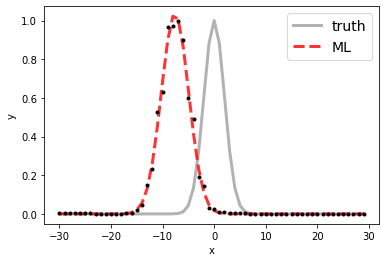

100%|██████████| 15000/15000 [00:14<00:00, 1037.75it/s]


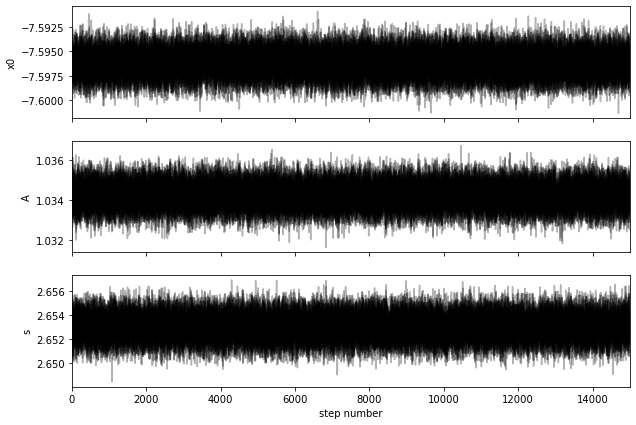

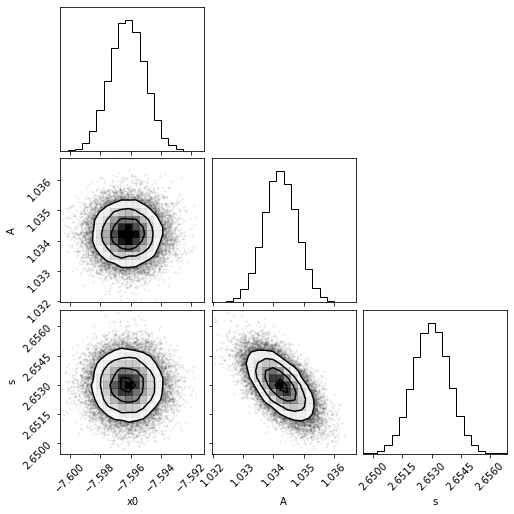

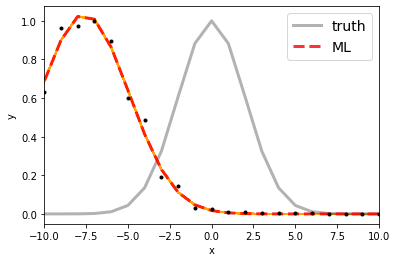

Maximum likelihood estimates:
x0 = -7.596
A = 1.034
s = 2.653


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  4999.403786324621 [0.00115236 0.00116931]
A  =  1.4068167155204687e-14 [7.43660969e-18 7.60538565e-18]
s  =  2.652983612066643 [0.00092406 0.00092508]

-------------------------------------------------------------------------------------------

Ajuste en 6563 nm:

Parámetros reales:
1.0 1.0 1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


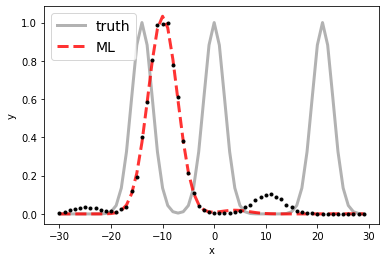

100%|██████████| 15000/15000 [00:22<00:00, 667.21it/s]


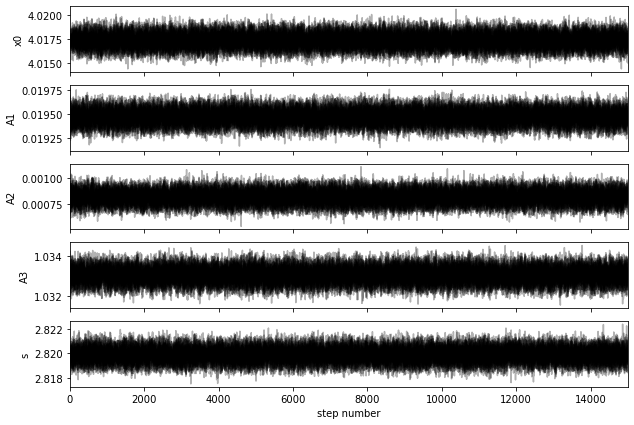

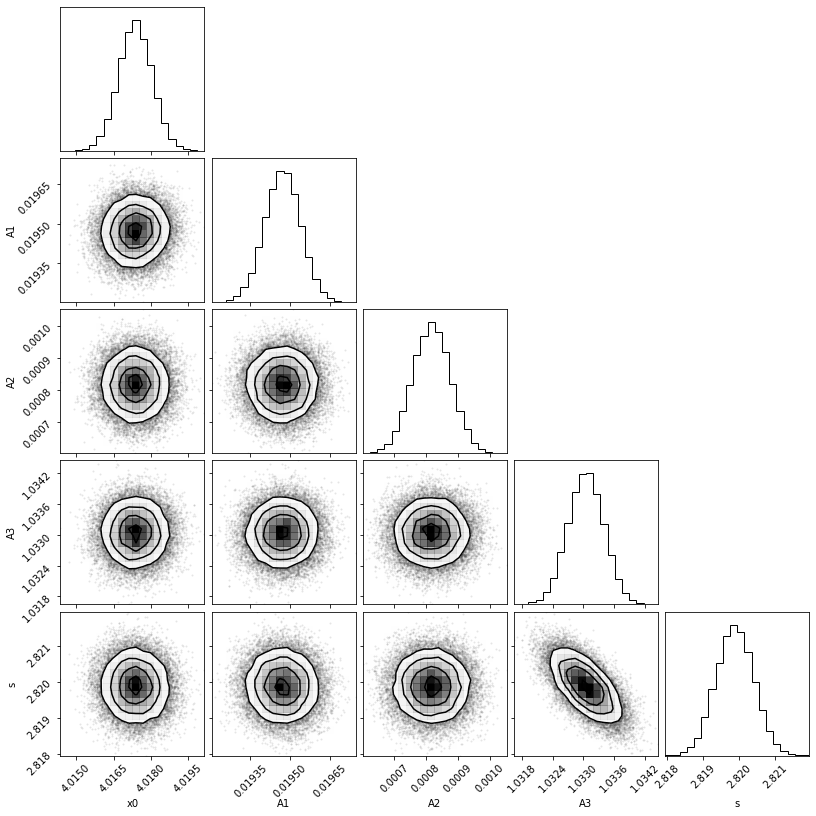

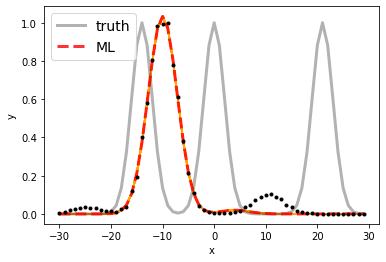

Maximum likelihood estimates:
x0 = 4.017
A1 = 0.019
A2 = 0.001
A3 = 1.033
s = 2.820


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x01, x02 =  6567.017371961773 6588.017371961773 [0.00066686 0.00066997]
A1, A2   =  2.949849883878304e-16 1.2378543244615826e-17 [1.03846457e-18 1.01362376e-18] [9.10339901e-19 8.96443263e-19]
s  =  2.819876151665486 [0.0005269 0.0005223]

-------------------------------------------------------------------------------------------

///////////////////////////////////////////////////////////////////////////////////////////


AJUSTANDO ESPECTRO 15

Ajuste en 4861 nm:

Parámetros reales:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


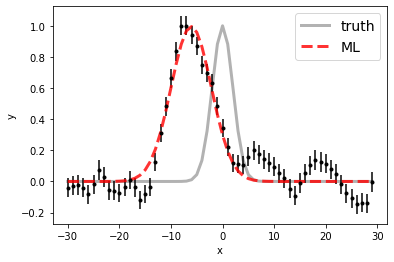

100%|██████████| 15000/15000 [00:14<00:00, 1004.14it/s]


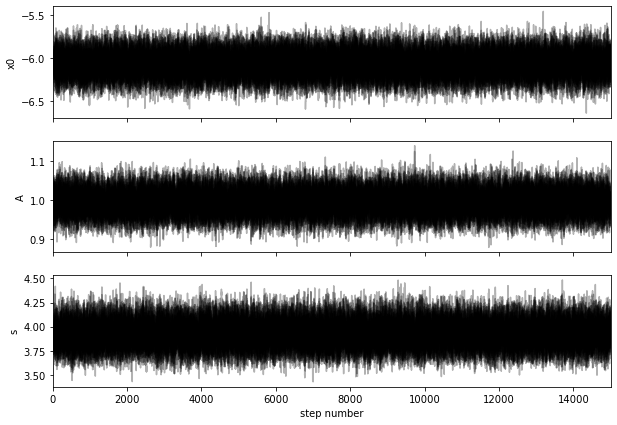

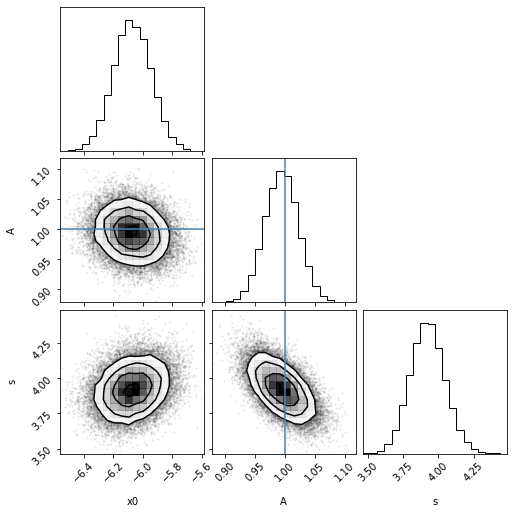

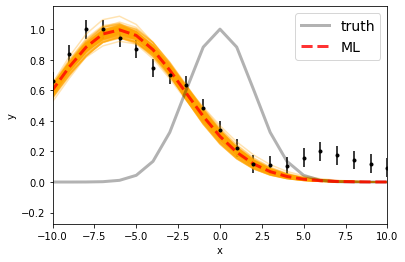

Maximum likelihood estimates:
x0 = -6.075
A = 0.995
s = 3.916


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  4854.926374917908 [0.12655639 0.12920216]
A  =  5.699444640187488e-17 [1.60417804e-18 1.58325433e-18]
s  =  3.922801858238108 [0.12085716 0.12295185]

-------------------------------------------------------------------------------------------

Ajuste en 5007 nm:

Parámetros reales:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


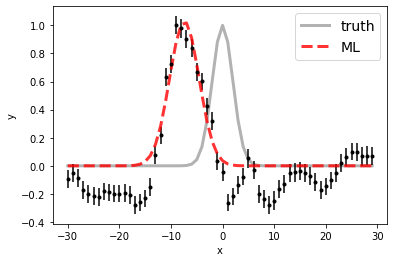

100%|██████████| 15000/15000 [00:14<00:00, 1022.62it/s]


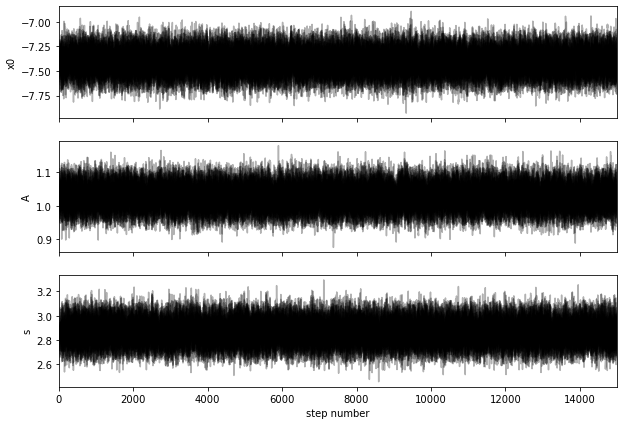

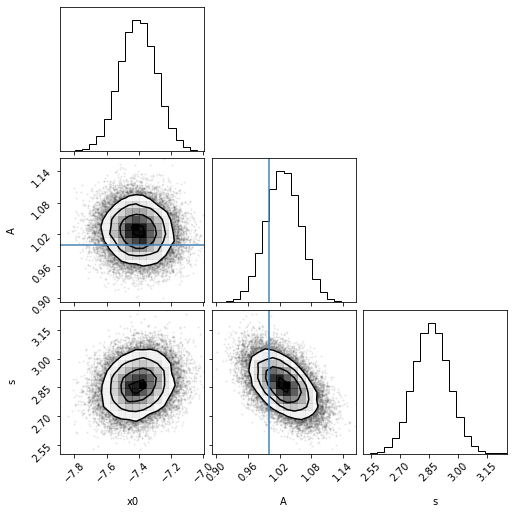

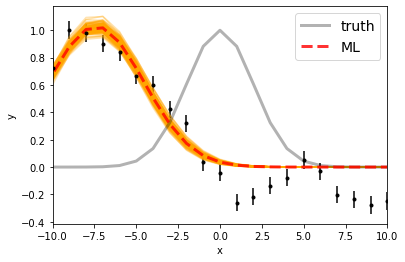

Maximum likelihood estimates:
x0 = -7.407
A = 1.028
s = 2.863


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  4999.595080986788 [0.11385897 0.11208911]
A  =  5.466919965795759e-17 [1.72986886e-18 1.74868355e-18]
s  =  2.863201429518477 [0.08975025 0.09196224]

-------------------------------------------------------------------------------------------

Ajuste en 6563 nm:

Parámetros reales:
1.0 1.0 1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


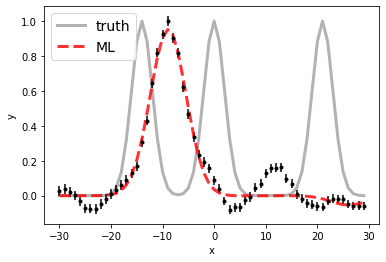

  0%|          | 0/15000 [00:00<?, ?it/s]C:\Users\saruk\anaconda3\lib\site-packages\emcee\moves\red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
100%|██████████| 15000/15000 [00:07<00:00, 1968.22it/s]


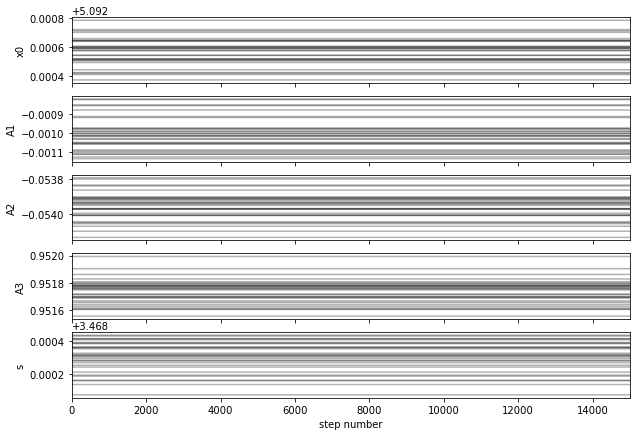

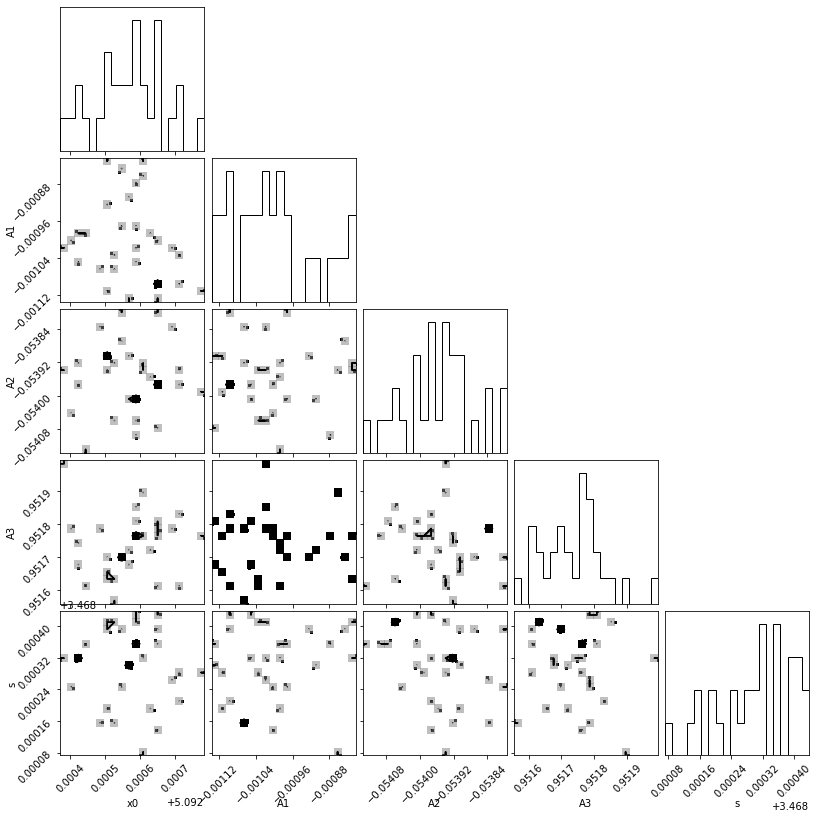

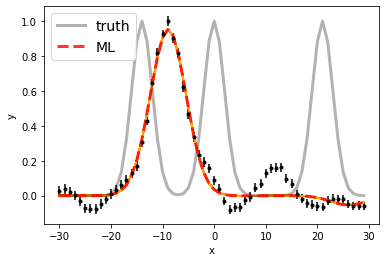

Maximum likelihood estimates:
x0 = 5.093
A1 = -0.001
A2 = -0.054
A3 = 0.952
s = 3.468


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x01, x02 =  6568.092580360933 6589.092580360933 [1.39003491e-04 7.62088857e-05]
A1, A2   =  -8.772154120858407e-20 -4.663022933618877e-18 [7.59571541e-21 1.15629312e-20] [8.90800371e-21 7.28798201e-21]
s  =  3.4683135741070266 [1.26504794e-04 9.65407082e-05]

-------------------------------------------------------------------------------------------

///////////////////////////////////////////////////////////////////////////////////////////


AJUSTANDO ESPECTRO 16

Ajuste en 4861 nm:

Parámetros reales:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


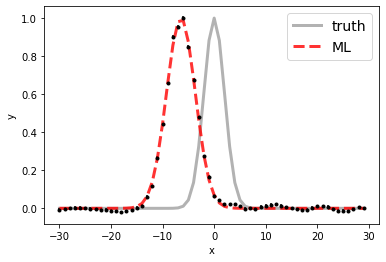

100%|██████████| 15000/15000 [00:14<00:00, 1036.69it/s]


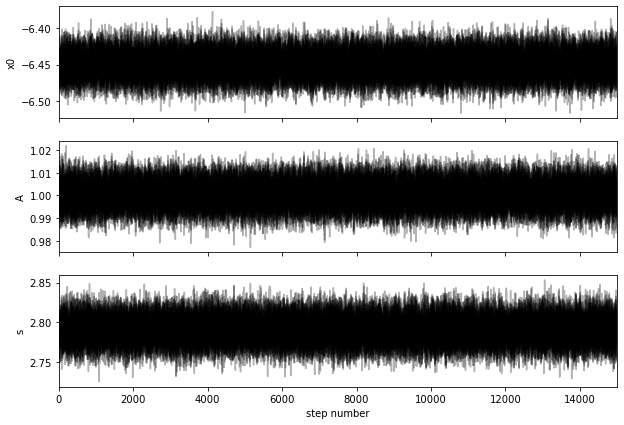

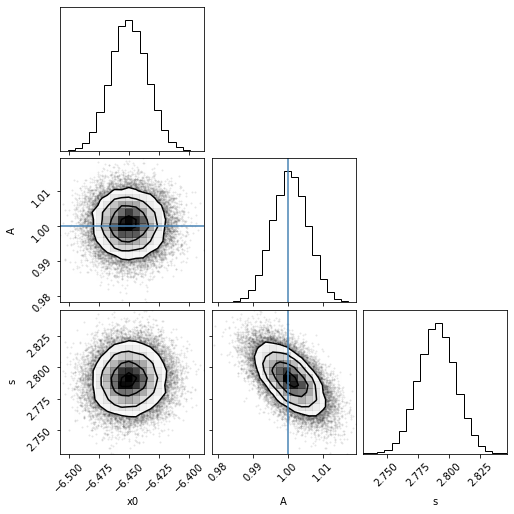

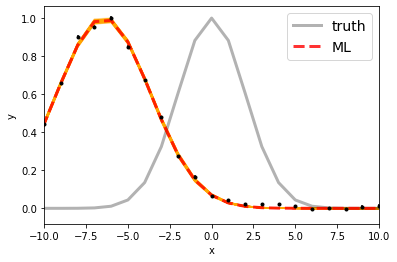

Maximum likelihood estimates:
x0 = -6.450
A = 1.001
s = 2.790


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  4854.549959099304 [0.01505366 0.01559063]
A  =  5.1396046611439e-16 [2.61088466e-18 2.60679433e-18]
s  =  2.7904442309008646 [0.01485303 0.01481287]

-------------------------------------------------------------------------------------------

Ajuste en 5007 nm:

Parámetros reales:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


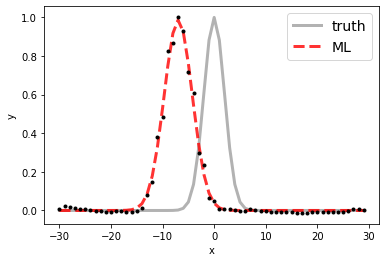

100%|██████████| 15000/15000 [00:14<00:00, 1034.90it/s]


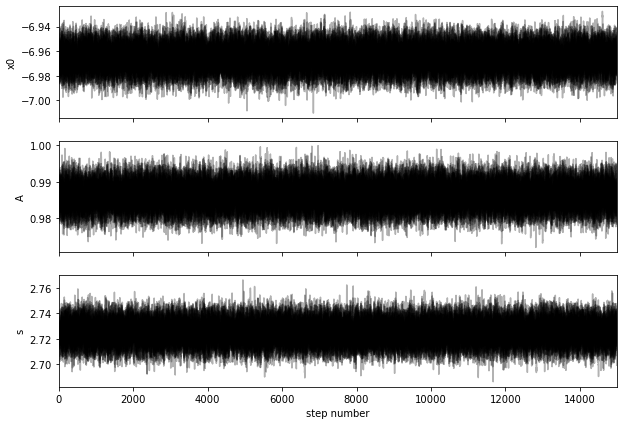

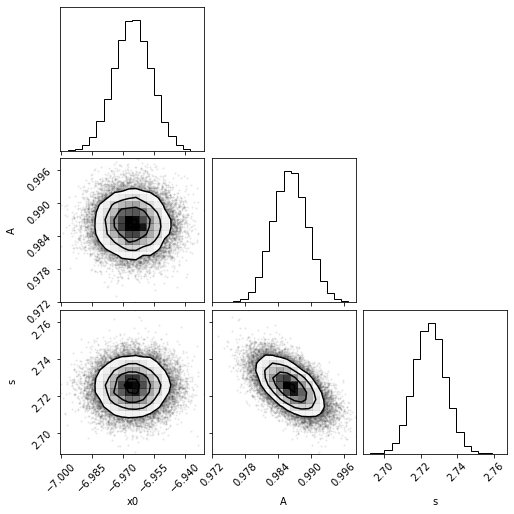

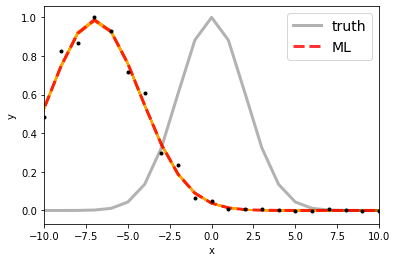

Maximum likelihood estimates:
x0 = -6.966
A = 0.986
s = 2.725


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  5000.0346005555875 [0.00897102 0.00907381]
A  =  8.99867193963207e-16 [2.85946282e-18 2.90173880e-18]
s  =  2.7250192290246327 [0.0082902 0.008376 ]

-------------------------------------------------------------------------------------------

Ajuste en 6563 nm:

Parámetros reales:
1.0 1.0 1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


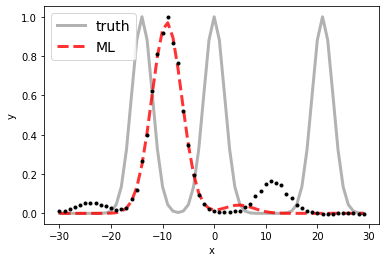

100%|██████████| 15000/15000 [00:22<00:00, 669.31it/s]


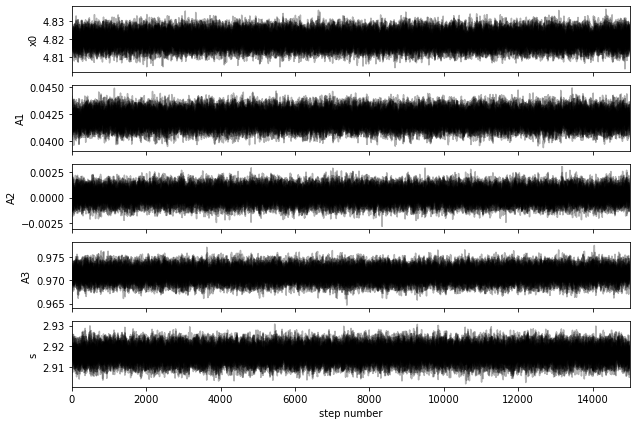

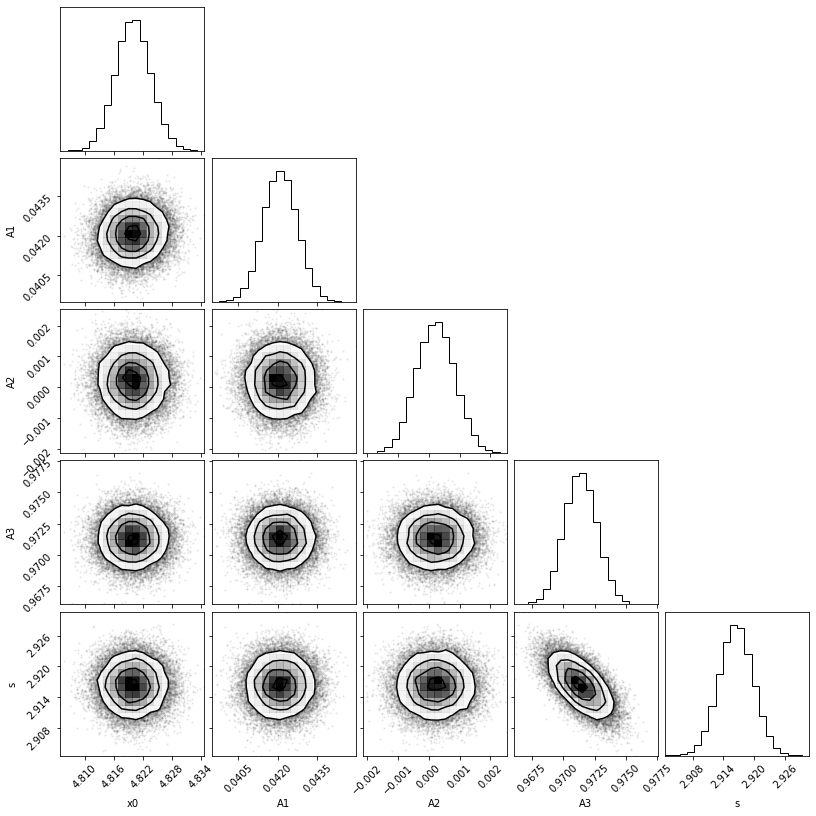

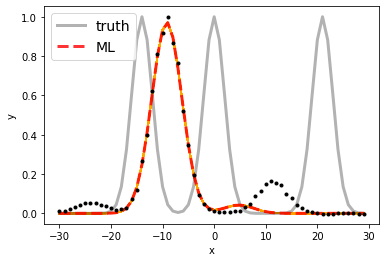

Maximum likelihood estimates:
x0 = 4.820
A1 = 0.042
A2 = 0.000
A3 = 0.971
s = 2.916


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x01, x02 =  6567.8199283783515 6588.8199283783515 [0.0036075  0.00363813]
A1, A2   =  6.750633746865264e-17 3.5994018490271407e-19 [1.02919610e-18 1.04278829e-18] [1.00020571e-18 9.91345458e-19]
s  =  2.916434431190001 [0.00329051 0.00328408]

-------------------------------------------------------------------------------------------

///////////////////////////////////////////////////////////////////////////////////////////


AJUSTANDO ESPECTRO 17

Ajuste en 4861 nm:

Parámetros reales:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


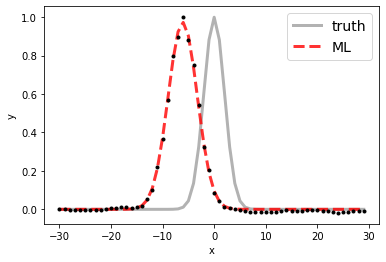

100%|██████████| 15000/15000 [00:15<00:00, 993.98it/s] 


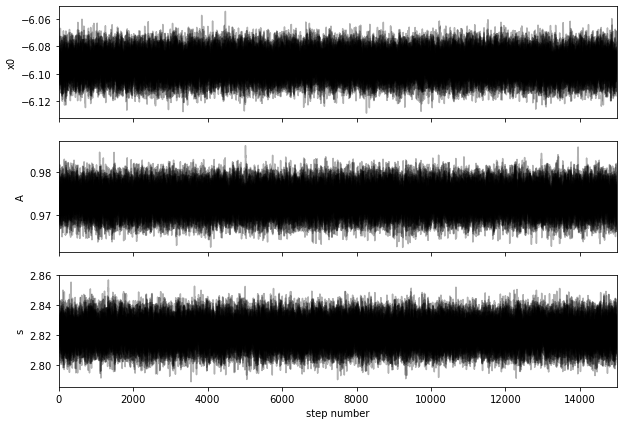

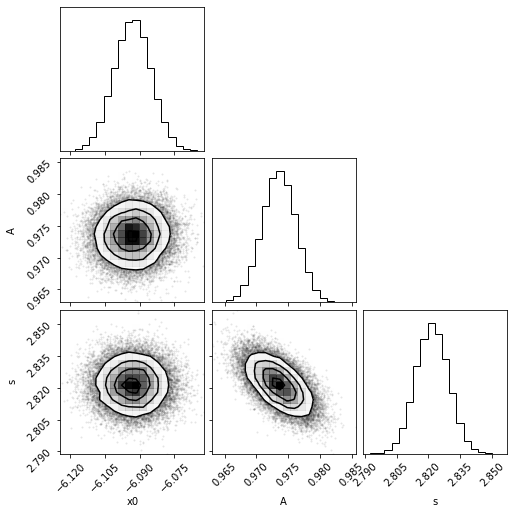

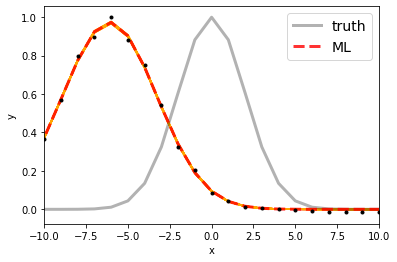

Maximum likelihood estimates:
x0 = -6.093
A = 0.974
s = 2.822


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  4854.906843031203 [0.00805636 0.00786481]
A  =  1.0185473577535346e-15 [2.77404694e-18 2.79025555e-18]
s  =  2.8216978468335028 [0.00759495 0.00762996]

-------------------------------------------------------------------------------------------

Ajuste en 5007 nm:

Parámetros reales:
1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


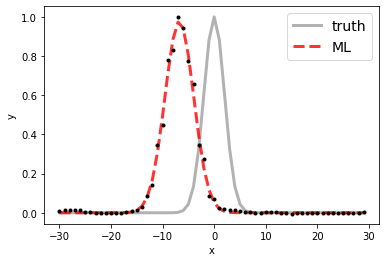

100%|██████████| 15000/15000 [00:14<00:00, 1030.45it/s]


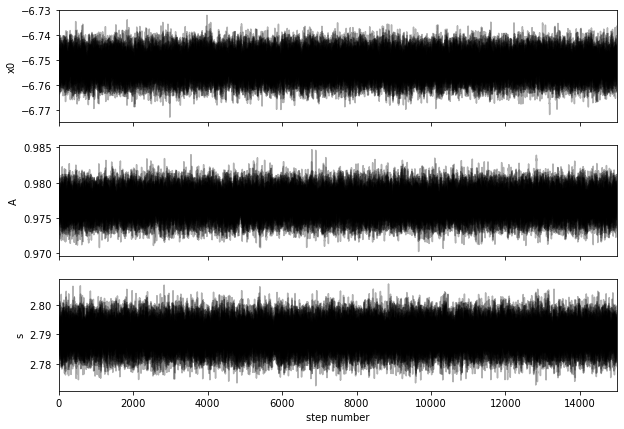

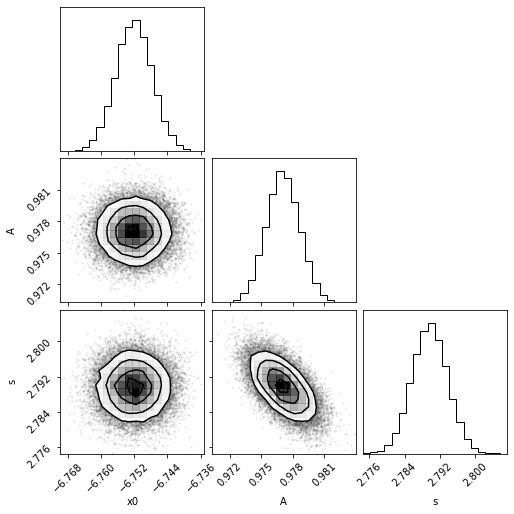

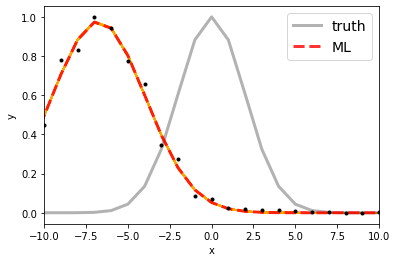

Maximum likelihood estimates:
x0 = -6.752
A = 0.977
s = 2.790


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x0 =  5000.247943787183 [0.00437197 0.00434858]
A  =  2.0645711501552685e-15 [3.33456964e-18 3.40310018e-18]
s  =  2.7896692779459578 [0.00400536 0.00400527]

-------------------------------------------------------------------------------------------

Ajuste en 6563 nm:

Parámetros reales:
1.0 1.0 1.0 0.0 2.0



C:\Users\saruk\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


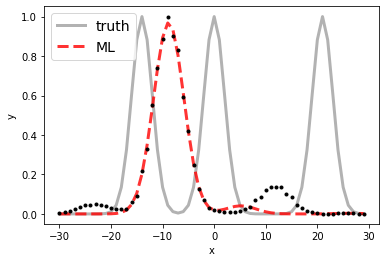

100%|██████████| 15000/15000 [00:23<00:00, 648.40it/s]


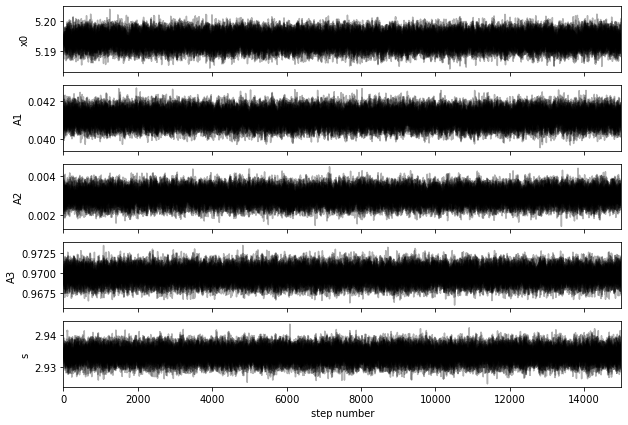

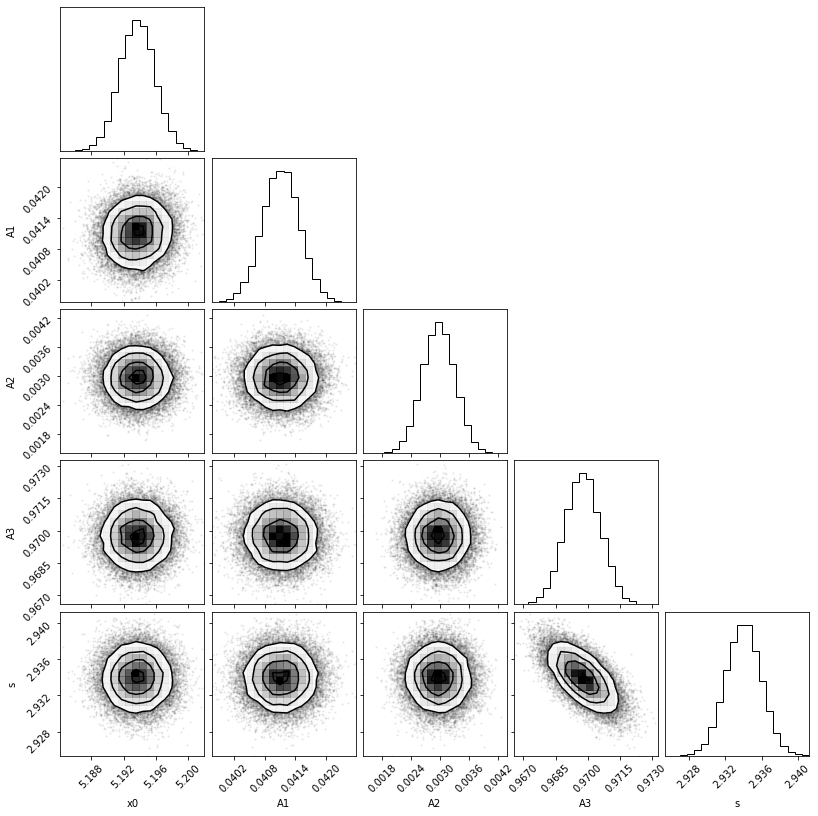

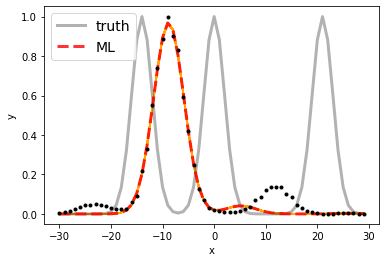

Maximum likelihood estimates:
x0 = 5.194
A1 = 0.041
A2 = 0.003
A3 = 0.970
s = 2.934


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>


Parámetros obtenidos:
x01, x02 =  6568.193675422987 6589.193675422987 [0.00215333 0.00213073]
A1, A2   =  1.2370474986943834e-16 8.909169109310844e-18 [1.08154968e-18 1.07166081e-18] [1.00480315e-18 1.01101295e-18]
s  =  2.9339762838816634 [0.00194502 0.00192844]

-------------------------------------------------------------------------------------------

///////////////////////////////////////////////////////////////////////////////////////////


El programa ha finalizado en 990 s.


In [3]:
instanteInicial = datetime.now()

os.chdir(path+'\\adjusted_spectrum')    
os.getcwd()


Hbeta = 4861
OIII = 5007
Halfa = 6563
NII = 6583

lineas = np.array([Hbeta,OIII,Halfa,NII])
lineas_wave = np.array(np.where((l_obs==Hbeta)|(l_obs==OIII)|(l_obs==Halfa)|(l_obs==NII)))

for j in range(len(l_obs_todos[:,0])):
    l_obs = l_obs_todos[j,:]
    f_obs = f_obs_todos[j,:]
    f_syn = f_syn_todos[j,:]
    e_emit = e_emit_todos[j,:]
    
    print('AJUSTANDO ESPECTRO',j)
    print()
    
    
    ##################################### Hb y OIII
    x0_1 = []
    A_1 = []
    s_1 = []
    e_x0_1 = []
    e_A_1 = []
    e_s_1 = []
    lineas_1 = lineas[0:2]
    lineas_wave_1 = lineas_wave[0,0:2]
    for i in range(len(lineas_1)):
        lim_i=lineas_wave_1[i]-30; lim_i=int(lim_i)
        lim_f=lineas_wave_1[i]+30; lim_f=int(lim_f)
        
        # Choose the "true" parameters.
        data = f_obs-f_syn
        wave = l_obs[lim_i:lim_f]
        flux = data[lim_i:lim_f]
        ymax = np.max(flux)
        x = wave-lineas_1[i]
        y = flux/ymax
        yerr = e_emit[lim_i:lim_f]/ymax
        linea = lineas_1[i]
        
        def gaussian(x, a, x0, sigma):
            return a*np.exp(-(x-x0)**2/(2*sigma**2))
            
        popt, pcov = curve_fit(gaussian, wave, flux, p0=[1, 0, 2])
        
        A_true,x0_true,s_true=popt
        print('Ajuste en', lineas_1[i],'nm:')
        print()
        print('Parámetros reales:')
        print(A_true,x0_true,s_true)
        print()
        
        
        # Maximum likehood estimation:
        def log_likelihood(theta, x, y, yerr):
            x0, A, s = theta
            model = A * np.exp( -(x-x0)**2 / (2 * s**2) )
            sigma2 = yerr ** 2 #+ model ** 2 
            return -0.5 * np.sum((y - model) ** 2 / sigma2 )#+ np.log(sigma2))
        
        np.random.seed(42)
        nll = lambda *args: -log_likelihood(*args)
        initial = np.array([x0_true, A_true, s_true]) + 0.1 * np.random.randn(3)
        soln = minimize(nll, initial, args=(x, y, yerr))
        x0_ml, A_ml, s_ml = soln.x
        
        
        plt.errorbar(x, y, yerr=yerr, fmt=".k", capsize=0)
        plt.plot(x, A_true * np.exp(-(x-x0_true)**2 / (2*s_true**2))  , "k", alpha=0.3, lw=3, label="truth")
        plt.plot(x, A_ml * np.exp(-(x-x0_ml)**2 / (2*s_ml**2))  , "--r", alpha=0.8, lw=3, label="ML")
        plt.legend(fontsize=14)
        #plt.xlim(-10, 10)
        plt.xlabel('x')
        plt.ylabel('y');
        plt.show()
        
        
        # Marginalization and uncertainty:
        def log_prior(theta):
            x0, A, s = theta
            if -10. < x0 < 10. and 0.0 < A < 20.0 and 0.0 < s < 5.0:
                return 0.0
            return -np.inf
        
        def log_probability(theta, x, y, yerr):
            lp = log_prior(theta)
            if not np.isfinite(lp):
                return -np.inf
            return lp + log_likelihood(theta, x, y, yerr)
        
        pos = soln.x + 1e-4 * np.random.randn(30, 3)
        nwalkers, ndim = pos.shape
        
        sampler = emcee.EnsembleSampler(nwalkers, ndim, log_probability, args=(x, y, yerr))
        sampler.run_mcmc(pos, 15000, progress=True);
        
        
        fig, axes = plt.subplots(3, figsize=(10, 7), sharex=True)
        samples = sampler.get_chain()
        labels = ["x0", "A", "s"]
        for i in range(ndim):
            ax = axes[i]
            ax.plot(samples[:, :, i], "k", alpha=0.3)
            ax.set_xlim(0, len(samples))
            ax.set_ylabel(labels[i])
        #    ax.yaxis.set_label_coords(-0.1, 0.5)
        
        axes[-1].set_xlabel("step number");
        plt.show()
        
        
        flat_samples = sampler.get_chain(discard=100, thin=15, flat=True)
        #print(flat_samples.shape)
        
        
        # Resultados
        fig = corner.corner(flat_samples, labels=labels, truths=[x0_true, A_true, s_true]);
        plt.show()
        
        inds = np.random.randint(len(flat_samples), size=100)
        plt.errorbar(x, y, yerr=yerr, fmt=".k", capsize=0)
        for ind in inds:
            sample = flat_samples[ind]
            plt.plot(x, sample[1] * np.exp(-(x-sample[0])**2 / (2*sample[2]**2)) , color='orange', alpha=0.3)
        plt.plot(x, A_true * np.exp(-(x-x0_true)**2 / (2*s_true**2))  , "k", alpha=0.3, lw=3, label="truth")
        plt.plot(x, A_ml * np.exp(-(x-x0_ml)**2 / (2*s_ml**2))  , "--r", alpha=0.8, lw=3, label="ML")
        plt.legend(fontsize=14)
        plt.xlim(-10, 10)
        plt.xlabel('x')
        plt.ylabel('y');
        
        plt.show()
        
        print('Maximum likelihood estimates:')
        print("x0 = {0:.3f}".format(x0_ml))
        print("A = {0:.3f}".format(A_ml))
        print("s = {0:.3f}".format(s_ml))
        
        #
        datos = []
        errores = []
        for i in range(ndim):
            mcmc = np.percentile(flat_samples[:, i], [16, 50, 84])
            q = np.diff(mcmc)
            txt = "\mathrm{{{3}}} = {0:.3f}_{{-{1:.3f}}}^{{{2:.3f}}}"
            txt = txt.format(mcmc[1], q[0], q[1], labels[i])
            display(Math(txt))
            datos.append(mcmc[1])
            errores.append(q[:])
            
        datos = np.array(datos)
        errores = np.array(errores)
        x0 = datos[0]+linea
        A = datos[1]*ymax
        s = datos[2]
        e_x0 = errores[0]
        e_A = errores[1]*ymax
        e_s = errores[2]
        print('\nParámetros obtenidos:')
        print('x0 = ', x0, e_x0)
        print('A  = ', A, e_A)
        print('s  = ', s, e_s)
        print('\n-------------------------------------------------------------------------------------------')
        print()
        
        x0_1.append(x0)
        A_1.append(A)
        s_1.append(s)
        e_x0_1.append(e_x0)
        e_A_1.append(e_A)
        e_s_1.append(e_s)
    
    x0_1 = np.array(x0_1)
    A_1 = np.array(A_1)
    s_1 = np.array(s_1)
    e_x0_1 = np.array(e_x0_1)
    e_A_1 = np.array(e_A_1)
    e_s_1 = np.array(e_s_1)
    
        
    ##################################### Ha y NII
    
    d1 = 21
    d2 = 14
    
    x0_2 = []
    A1_2 = []
    A2_2 = []
    A3_2 = []
    s_2 = []
    e_x0_2 = []
    e_A1_2 = []
    e_A2_2 = []
    e_A3_2 = []
    e_s_2 = []
    lim_i = lineas_wave[0,2]-30; lim_i=int(lim_i)
    lim_f = lineas_wave[0,2]+30; lim_f=int(lim_f)
    
    # Choose the "true" parameters.
    data = f_obs-f_syn
    wave = l_obs[lim_i:lim_f]
    flux = data[lim_i:lim_f]
    ymax = np.max(flux)
    x = wave-lineas[2]
    y = flux/ymax
    yerr = e_emit[lim_i:lim_f]/ymax
    linea = lineas[2]
    
    def gaussian_2(x, a1 ,a2,a3, x0, sigma):
        return a1*np.exp(-(x-x0)**2/(2*sigma**2))+a2*np.exp(-(x-(x0+d1))**2/(2*sigma**2))+a3*np.exp(-(x-(x0-d2))**2/(2*sigma**2))
        
    popt, pcov = curve_fit(gaussian_2, wave, flux, p0=[1,1,1, 0, 2])
    
    A1_true,A2_true,A3_true,x0_true,s_true=popt
    print('Ajuste en', lineas[2],'nm:')
    print()
    print('Parámetros reales:')
    print(A1_true,A2_true,A3_true,x0_true,s_true)
    print()
    
    
    # Maximum likehood estimation:
    def log_likelihood(theta, x, y, yerr):
        x0, A1,A2,A3, s = theta
        model = A1 * np.exp( -(x-x0)**2 / (2 * s**2) )+A2 * np.exp( -(x-(x0+d1))**2 / (2 * s**2) )+A3 * np.exp( -(x-(x0-d2))**2 / (2 * s**2) )
        sigma2 = yerr ** 2 #+ model ** 2 
        return -0.5 * np.sum((y - model) ** 2 / sigma2 )#+ np.log(sigma2))
    
    np.random.seed(42)
    nll = lambda *args: -log_likelihood(*args)
    initial = np.array([x0_true, A1_true,A2_true,A3_true, s_true]) + 0.1 * np.random.randn(5)
    soln = minimize(nll, initial, args=(x, y, yerr))
    x0_ml, A1_ml,A2_ml,A3_ml, s_ml = soln.x
    
    
    plt.errorbar(x, y, yerr=yerr, fmt=".k", capsize=0)
    plt.plot(x, A1_true * np.exp(-(x-x0_true)**2 / (2*s_true**2))+ A2_true * np.exp(-(x-(x0_true+d1))**2 / (2*s_true**2))+ A3_true * np.exp(-(x-(x0_true-d2))**2 / (2*s_true**2))    , "k", alpha=0.3, lw=3, label="truth")
    plt.plot(x, A1_ml * np.exp(-(x-x0_ml)**2 / (2*s_ml**2))+A2_ml * np.exp(-(x-(x0_ml+d1))**2 / (2*s_ml**2))+A3_ml * np.exp(-(x-(x0_ml-d2))**2 / (2*s_ml**2))  , "--r", alpha=0.8, lw=3, label="ML")
    plt.legend(fontsize=14)
    #plt.xlim(-10, 10)
    plt.xlabel('x')
    plt.ylabel('y');
    plt.show()
    
    
    # Marginalization and uncertainty:
    def log_prior(theta):
        x0, A1,A2,A3, s = theta
        if -10. < x0 < 10. and 0.0 < A1 < 20.0 and 0.0 < s < 5.0:
            return 0.0
        return -np.inf
        if -10. < x0 < 10. and 0.0 < A2 < 20.0 and 0.0 < s < 5.0:
            return 0.0
        return -np.inf
        if -10. < x0 < 10. and 0.0 < A3 < 20.0 and 0.0 < s < 5.0:
            return 0.0
        return -np.inf
    
    def log_probability(theta, x, y, yerr):
        lp = log_prior(theta)
        if not np.isfinite(lp):
            return -np.inf
        return lp + log_likelihood(theta, x, y, yerr)
    
    pos = soln.x + 1e-4 * np.random.randn(30, 5)
    nwalkers, ndim = pos.shape
    
    sampler = emcee.EnsembleSampler(nwalkers, ndim, log_probability, args=(x, y, yerr))
    sampler.run_mcmc(pos, 15000, progress=True);
    
    
    fig, axes = plt.subplots(5, figsize=(10, 7), sharex=True)
    samples = sampler.get_chain()
    labels = ["x0", "A1","A2","A3", "s"]
    for i in range(ndim):
        ax = axes[i]
        ax.plot(samples[:, :, i], "k", alpha=0.3)
        ax.set_xlim(0, len(samples))
        ax.set_ylabel(labels[i])
    #    ax.yaxis.set_label_coords(-0.1, 0.5)
    
    axes[-1].set_xlabel("step number");
    plt.show()
    
    
    flat_samples = sampler.get_chain(discard=100, thin=15, flat=True)
    #print(flat_samples.shape)
    
    
    # Resultados
    fig = corner.corner(flat_samples, labels=labels, truths=[x0_true, A1_true, A2_true, A3_true, s_true]);
    plt.show()
    
    inds = np.random.randint(len(flat_samples), size=100)
    plt.errorbar(x, y, yerr=yerr, fmt=".k", capsize=0)
    for ind in inds:
        sample = flat_samples[ind]
        plt.plot(x, sample[1] * np.exp(-(x-sample[0])**2 / (2*sample[4]**2))+sample[2] * np.exp(-(x-(sample[0]+d1))**2 / (2*sample[4]**2))+sample[3] * np.exp(-(x-(sample[0]-d2))**2 / (2*sample[4]**2)) , color='orange', alpha=0.3)
    plt.plot(x, A1_true * np.exp(-(x-x0_true)**2 / (2*s_true**2))+ A2_true * np.exp(-(x-(x0_true+d1))**2 / (2*s_true**2))+ A3_true * np.exp(-(x-(x0_true-d2))**2 / (2*s_true**2))  , "k", alpha=0.3, lw=3, label="truth")
    plt.plot(x, A1_ml * np.exp(-(x-x0_ml)**2 / (2*s_ml**2))+A2_ml * np.exp(-(x-(x0_ml+d1))**2 / (2*s_ml**2))+A3_ml * np.exp(-(x-(x0_ml-d2))**2 / (2*s_ml**2))   , "--r", alpha=0.8, lw=3, label="ML")
    plt.legend(fontsize=14)
  #  plt.xlim(-10, 10)
    plt.xlabel('x')
    plt.ylabel('y');
    
    plt.show()
    
    print('Maximum likelihood estimates:')
    print("x0 = {0:.3f}".format(x0_ml))
    print("A1 = {0:.3f}".format(A1_ml))
    print("A2 = {0:.3f}".format(A2_ml))
    print("A3 = {0:.3f}".format(A3_ml))
    print("s = {0:.3f}".format(s_ml))
    
    #
    datos = []
    errores = []
    for i in range(ndim):
        mcmc = np.percentile(flat_samples[:, i], [16, 50, 84])
        q = np.diff(mcmc)
        txt = "\mathrm{{{3}}} = {0:.3f}_{{-{1:.3f}}}^{{{2:.3f}}}"
        txt = txt.format(mcmc[1], q[0], q[1], labels[i])
        display(Math(txt))
        datos.append(mcmc[1])
        errores.append(q[:])
        
    datos = np.array(datos)
    errores = np.array(errores)
    x0 = datos[0]+linea
    A1 = datos[1]*ymax
    A2 = datos[2]*ymax
    A3 = datos[3]*ymax
    s = datos[4]
    e_x0 = errores[0]
    e_A1 = errores[1]*ymax
    e_A2 = errores[2]*ymax
    e_A3 = errores[3]*ymax
    e_s = errores[4]
    print('\nParámetros obtenidos:')
    print('x01, x02 = ', x0, x0+d1, e_x0)
    print('A1, A2   = ', A1, A2, e_A1, e_A2)
    print('s  = ', s, e_s)
    print('\n-------------------------------------------------------------------------------------------')
    print()
    
    x0_2.append(x0)
    A1_2.append(A1)
    A2_2.append(A2)
    A3_2.append(A3)
    s_2.append(s)
    e_x0_2.append(e_x0)
    e_A1_2.append(e_A1)
    e_A2_2.append(e_A2)
    e_A3_2.append(e_A3)
    e_s_2.append(e_s)
    
    x0_2 = np.array(x0_2)
    A1_2 = np.array(A1_2) # Ha
    A2_2 = np.array(A2_2) # NII
    A3_2 = np.array(A3_2) # El otro N
    s_2 = np.array(s_2)
    e_x0_2 = np.array(e_x0_2)
    e_A1_2 = np.array(e_A1_2)
    e_A2_2 = np.array(e_A2_2)
    e_A3_2 = np.array(e_A3_2)
    e_s_2 = np.array(e_s_2)
    
    
    ####
    
    
    x0_t = np.concatenate((x0_1,x0_2,(x0_2+d1)),axis=0)
    e_x0_t = np.concatenate((e_x0_1,e_x0_2,e_x0_2),axis=0)
    A_t = np.concatenate((A_1,A1_2,A2_2),axis=0)
    e_A_t = np.concatenate((e_A_1,e_A1_2,e_A2_2),axis=0)
    s_t = np.concatenate((s_1,s_2,s_2),axis=0)
    e_s_t = np.concatenate((e_s_1,e_s_2,e_s_2),axis=0) 

    #table = {'media': x0_t, 'e1x0':e_x0_t[:,0], 'e2x0':e_x0_t[:,1], 
    #         'A': A_t, 'e1A':e_A_t[:,0], 'e2A':e_A_t[:,1], 's':s_t, 
    #         'e1s':e_s_t[:,0], 'e2s':e_s_t[:,1]}
    #ascii.write(table, 'spectrum_adjusted_'+str(j)+'_NGC7250_new.txt', 
    #            formats={'media': '%.5f','e1x0': '%.5f','e2x0':'%.5f',
    #                     'A': '%.10e','e1A': '%.10e','e2A':'%.10e',
    #                     's': '%.5f','e1s': '%.5f','e2s':'%.5f'}, 
    #            overwrite=True,format='fixed_width',delimiter=None)  
    
    print('///////////////////////////////////////////////////////////////////////////////////////////')
    print()
    print()

instanteFinal = datetime.now()
tiempo = instanteFinal - instanteInicial 
segundos = tiempo.seconds
print('El programa ha finalizado en', segundos,'s.')

Tras esto, se han eliminado determinados espectros ya que no se podían ajustar adecuadamente. 

En este caso se elimina el espectro 11.


### Calculo de flujos

Una vez conocemos la altura de la campana, A, y el ancho o desviación típica, s, del ajuste gaussiano calculamos el flujo de cada campana, que es el área debajo de la curva, que será:

                                           flujo = A * s * sqrt(2pi)

Y hacemos propagación de errores:

                             error = sqrt( 2pi * (s^2 * error_A^2 + A^2 *error_s^2)
                             
Los errores de A y sigma se han obtenido durante el ajuste gaussiano.

In [4]:
os.chdir(path+'\\adjusted_spectrum')    
os.getcwd()

lenn = len(glob.glob1(path+'\emited_spectrum',"*.BN"))

flux_t = []
err1_flux_t = []
err2_flux_t = []
for i in list(itertools.chain(range(0,lenn-7), range(lenn-6,lenn))):
    datos=pd.read_table('spectrum_adjusted_'+str(i)+'_NGC7250_new.txt', delim_whitespace=True)
    A = datos['A']
    s = datos['s']
    e1A = datos['e1A']
    e2A = datos['e2A']
    e1s = datos['e1s']
    e2s = datos['e2s']
    flux = []
    err1_flux = []
    err2_flux = []
    for j in range(len(A)): 
        integral = A[j]*s[j]*sqrt(2*pi)
        err1 = sqrt(2*pi*(s[j]**2*e1A[j]**2+A[j]**2*e1s[j]**2))
        err2 = sqrt(2*pi*(s[j]**2*e2A[j]**2+A[j]**2*e2s[j]**2))
        flux.append(integral)
        err1_flux.append(err1)
        err2_flux.append(err2)
    flux = np.array(flux)
    err1_flux = np.array(err1_flux)
    err2_flux = np.array(err2_flux)
    flux_t.append(flux)
    err1_flux_t.append(err1_flux)
    err2_flux_t.append(err2_flux)
flux_t = np.array(flux_t)
err1_flux_t = np.array(err1_flux_t)
err2_flux_t = np.array(err2_flux_t)

spec = np.linspace(0,len(flux_t[:,0])-1,len(flux_t[:,0]))
#for j in range(len(flux_t[:,0])):
#    table = {'spec': spec, 'Ha':flux_t[:,2], 'e1Ha':err1_flux_t[:,2], 'e2Ha':err2_flux_t[:,2], 
#             'Hb':flux_t[:,0], 'e1Hb':err1_flux_t[:,0], 'e2Hb':err2_flux_t[:,0], 'O3': flux_t[:,1], 
#             'e1O3':err1_flux_t[:,1], 'e2O3':err2_flux_t[:,1], 'N2':flux_t[:,3], 'e1N2':err1_flux_t[:,3], 
#             'e2N2':err2_flux_t[:,3]}
#    ascii.write(table, 'flujos.txt', formats={'spec': '%i','Ha': '%.6e','e1Ha': '%.6e','e2Ha': '%.6e',
#                                              'Hb':'%.6e','e1Hb': '%.6e','e2Hb': '%.6e','O3': '%.6e',
#                                              'e1O3': '%.6e','e2O3': '%.6e','N2': '%.6e','e1N2': '%.6e',
#                                              'e2N2': '%.6e',}, overwrite=True, format='fixed_width',delimiter=None)  
